# Dataset Creation

More about the keypoints order can be found here https://docs.ultralytics.com/guides/workouts-monitoring/

## Preprocess Videos
Extract frames from a given video and resizes them. Then use YOLOv8-pose to output labels for a video.

In [1]:
import os
import cv2
from ultralytics import YOLO
import random
from roboflow import Roboflow
import sys
from dotenv import load_dotenv
import time

model = YOLO('yolov8n-pose.pt')
# ball_detector_model = YOLO('yolov8s_ball_detector.pt')
ball_detector_model = YOLO('yolov8s_ball_detector.pt')

In [8]:
video_path = "videos"
video_name = "indoor2.mp4"
output_folder = os.path.join(video_path, video_name.split(".")[0])
os.makedirs(output_folder, exist_ok=True) # create output folder if not exists

In [9]:
frame_count = 0
saved_frame_count = 0
frame_save_interval = 1
frame_resize_width = 640
frame_resize_height = 480

def export_data(boxes, keypoints, keypoint_conf, cls, ball_boxes, ball_conf, ball_cls, frame, frame_count):
     # Export class, bounding box, and keypoint data to txt file
    for i in range(len(cls)):
        c = cls[i]
        x, y, w, h = boxes.xywhn[i][0], boxes.xywhn[i][1], boxes.xywhn[i][2], boxes.xywhn[i][3]
    
        # Export class, bounding box, and keypoint data to txt file
        with open(os.path.join(output_folder, f"frame_{frame_count:06d}.txt"), "a") as f:
            f.write(f"{c} {x:.6f} {y:.6f} {w:.6f} {h:.6f} ")    
            for j in range(keypoints[i].shape[1]):
                keypoints_ = keypoints[i].xyn.squeeze()
                kx, ky = keypoints_[j][0], keypoints_[j][1]
            
                if keypoint_conf[i][j] > 0.50:
                    f.write(f"{kx:.6f} {ky:.6f} {2.0:.6f} ")
                else:
                    f.write(f"{kx:.6f} {ky:.6f} {0.0:.6f} ")
    
    # Export ball class, bounding box, and keypoint data to txt file
    # 0: Person, 1: Rim, 2: Ball
    for i in range(len(ball_cls)):
        if ball_conf[i] < 0.40: # TODO Adjust the probability? Or use a better ball detection model
            continue
        
        c = ball_cls[i] + 1
        bbox = ball_boxes.xywhn[i]
        x, y, w, h = bbox[0], bbox[1], bbox[2], bbox[3]
        
        with open(os.path.join(output_folder, f"frame_{frame_count:06d}.txt"), "a") as f:
            f.write(f"{c} {x:.6f} {y:.6f} {w:.6f} {h:.6f} ")
            
            # Keypoint is center of the ball, keypoint is bottom center for the rim
            if c == 2:
                f.write(f"{x:.6f} {y:.6f} {2.0:.6f} ")
            else:
                f.write(f"{x:.6f} {y + h / 2:.6f} {2.0:.6f} ")
            
            # The next 16 are just ignored
            for j in range(16):
                f.write(f"{0.0:.6f} {0.0:.6f} {0.0:.6f} ")

    cv2.imwrite(os.path.join(output_folder, f"frame_{frame_count:06d}.jpg"), frame)
 

In [10]:
# Draw keypoints on frame
def draw_data(boxes, keypoints, keypoint_conf, cls, ball_boxes, ball_conf, ball_cls, frame, frame_count):
    image_height, image_width, _ = frame.shape
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
    
    for i in range(len(cls)):
        c = cls[i]
        x, y, w, h = boxes.xywhn[i][0], boxes.xywhn[i][1], boxes.xywhn[i][2], boxes.xywhn[i][3]
        
        # Unnormalize bounding box
        x = int(x * image_width)
        y = int(y * image_height)
        w = int(w * image_width)
        h = int(h * image_height)

        # Draw bounding box
        cv2.rectangle(frame, (int(x - w/2), int(y - h/2)), (int(x + w/2), int(y + h/2)), colors[int(c)], 2)
        
        # Draw keypoints
        for j in range(keypoints[i].shape[1]):
            keypoints_ = keypoints[i].xyn.squeeze()
            kx, ky = keypoints_[j][0], keypoints_[j][1]
            
            kx = int(kx * image_width)
            ky = int(ky * image_height)
            
            
            if keypoint_conf[i][j] > 0.50:
                cv2.circle(frame, (int(kx), int(ky)), 3, colors[int(c)], -1)
    
    # Draw ball bounding box and keypoints
    for i in range(len(ball_cls)):
        if ball_conf[i] < 0.35: # TODO Adjust the probability? Or use a better ball detection model
            continue
        
        c = ball_cls[i] + 1
        bbox = ball_boxes.xywhn[i]
        x, y, w, h = bbox[0], bbox[1], bbox[2], bbox[3]
        
        # Unnormalize bounding box
        x = int(x * image_width)
        y = int(y * image_height)
        w = int(w * image_width)
        h = int(h * image_height)
        
        # Draw bounding box
        cv2.rectangle(frame, (int(x - w/2), int(y - h/2)), (int(x + w/2), int(y + h/2)), colors[int(c)], 2)
        
        # Draw keypoints
        if c == 2:
            cv2.circle(frame, (int(x), int(y)), 3, colors[int(c)], -1)
        else:
            cv2.circle(frame, (int(x), int(y + h/2)), 3, colors[int(c)], -1)

    return frame

In [11]:
def convert_normalized_to_standard(center_x, center_y, width, height):
    """
    Convert normalized bounding box coordinates (center_x, center_y, width, height)
    to standard coordinates (top-left x, top-left y, bottom-right x, bottom-right y).
    """
    half_width, half_height = width / 2, height / 2
    top_left_x = center_x - half_width
    top_left_y = center_y - half_height
    bottom_right_x = center_x + half_width
    bottom_right_y = center_y + half_height
    return top_left_x, top_left_y, bottom_right_x, bottom_right_y

def calculate_iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.
    The boxes are given in the format (center_x, center_y, width, height).
    """
    # Convert normalized coordinates to standard coordinates
    box1 = convert_normalized_to_standard(*box1)
    box2 = convert_normalized_to_standard(*box2)

    # Determine the (x, y)-coordinates of the intersection rectangle
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    # Compute the area of intersection rectangle
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    box1Area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2Area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(box1Area + box2Area - interArea)

    return iou

def is_within_box(box1, box2):
    """
    Check if bounding box1 is completely within bounding box2.
    The boxes are given in the format (center_x, center_y, width, height).
    """
    # Convert normalized coordinates to standard coordinates
    box1 = convert_normalized_to_standard(*box1)
    box2 = convert_normalized_to_standard(*box2)

    # Check if box1 is within box2
    return (box1[0] >= box2[0] and box1[1] >= box2[1] and
            box1[2] <= box2[2] and box1[3] <= box2[3])

def detect_score(rim, ball_boxes, ball_conf, ball_cls, frame):
    # Iterate through ball_cls
    print(len(ball_cls))
    for i in range(len(ball_cls)):
        # if ball_conf[i] < 0.50:
        #     continue
    
        bbox = ball_boxes.xywhn[i]
        
        # Denormalize bounding box
        image_height, image_width, _ = frame.shape
        bbox[0], bbox[1], bbox[2], bbox[3] = bbox[0] * image_width, bbox[1] * image_height, bbox[2] * image_width, bbox[3] * image_height
        
        rim_copy = rim.copy()
        rim_copy[0], rim_copy[1], rim_copy[2], rim_copy[3] = rim_copy[0] * image_width, rim[1] * image_height, rim[2] * image_width, rim[3] * image_height
        
        # iou = calculate_iou(rim_copy, bbox)
        # if iou > 0.30:
        #     return True
        
        if is_within_box(bbox, rim_copy):
            return True
        
    return False


In [12]:
frame_count = 0
# rim = [0.8528, 0.3129, 0.0687, 0.0878] # rim is the first frame
rim = [0.8528, 0.3129, 0.0750, 0.0950]

# Run the inference on the video
cap = cv2.VideoCapture(os.path.join(video_path, video_name))
while cap.isOpened():
    ret, frame = cap.read()
    
    if not ret:
        break

    # resize the frame
    frame = cv2.resize(frame, (frame_resize_width, frame_resize_height))
    orig_frame = frame.copy()

    # save frame
    if frame_count % frame_save_interval == 0:
            
        # Perform inference on frame using keypoint model
        results = model(frame, imgsz=640, conf=0.25)[0]
    
        boxes = results.boxes
        keypoints = results.keypoints
        keypoint_conf = keypoints.conf
        cls = boxes.cls
        conf = boxes.conf

        # Perform inference on frame using ball detector model
        ball_results = ball_detector_model(frame, imgsz=640, conf=0.25)[0]
        ball_boxes = ball_results.boxes
        ball_cls = ball_boxes.cls
        ball_conf = ball_boxes.conf
        
        # # Static rim location
        # if frame_count == 0:
        #     # First object with value 0, cls is torch tensor
        #     idx = (ball_cls == 0).nonzero(as_tuple=True)[0][0]
        #     rim = ball_boxes.xywhn[idx]
        #     print("RIM", rim)
        
        
        # export_data(boxes, keypoints, keypoint_conf, cls, ball_boxes, ball_conf, ball_cls, frame, frame_count)
        drawn_frame = draw_data(boxes, keypoints, keypoint_conf, cls, ball_boxes, ball_conf, ball_cls, frame, frame_count)
        x, y, w, h = rim[0], rim[1], rim[2], rim[3]
        image_height, image_width, _ = frame.shape
        x = int(x * image_width)
        y = int(y * image_height)
        w = int(w * image_width)
        h = int(h * image_height)
        cv2.rectangle(drawn_frame, (int(x - w/2), int(y - h/2)), (int(x + w/2), int(y + h/2)), (255, 255, 255), 2)
        
        detect_score_ = detect_score(rim, ball_boxes, ball_conf, ball_cls, frame)
        
        
        # Draw Rim
        if detect_score_:
            print("SCORE!")
            # Write on frame
            cv2.putText(drawn_frame, "SCORE!", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
            # cv2.imwrite(f"videos/indoor13/frame_{frame_count:06d}.jpg", drawn_frame)
            cv2.imshow("frame", drawn_frame)
           
        saved_frame_count += 1
        
        # Show frame
        # cv2.imshow("frame", drawn_frame)
        temp_output = "videos/indoor14" + f"/frame_{frame_count:06d}.jpg"
        cv2.imwrite(temp_output, drawn_frame)
        
    # if detect_score_:
    #     time.sleep(1)
    
    
    frame_count += 1
    if (cv2.waitKey(1) & 0xFF) == ord('q'):
        print("Quit")
        break
 
    # Draw on rim
    # x, y, w, h = rim[0], rim[1], rim[2], rim[3]
    # image_height, image_width, _ = frame.shape
    # x = int(x * image_width)
    # y = int(y * image_height)
    # w = int(w * image_width)
    # h = int(h * image_height)
    # cv2.rectangle(orig_frame, (int(x - w/2), int(y - h/2)), (int(x + w/2), int(y + h/2)), (255, 255, 255), 2)
    # cv2.imwrite("rim.jpg", orig_frame)
    
    # if frame_count == 2:
    #     break
    
print("Done")
cap.release()
cv2.destroyAllWindows()
cv2.waitKey(1)              # why?



0: 480x640 2 persons, 59.4ms
Speed: 1.5ms preprocess, 59.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 170.8ms
Speed: 1.2ms preprocess, 170.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.0ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.1ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.3ms
Speed: 0.9ms preprocess, 156.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.2ms preprocess, 150.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.8ms
Speed: 0.9ms preprocess, 43.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.9ms
Speed: 1.0ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.7ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.0ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.4ms
Speed: 0.9ms preprocess, 156.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 0.9ms preprocess, 145.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 0.8ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 0.8ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 1.0ms preprocess, 146.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 0.8ms preprocess, 141.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.0ms
Speed: 0.8ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 0.8ms preprocess, 145.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.1ms preprocess, 50.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 192.0ms
Speed: 1.5ms preprocess, 192.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.2ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 0.9ms preprocess, 152.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.7ms
Speed: 1.0ms preprocess, 161.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 1.1ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 1.0ms preprocess, 141.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 0.9ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 1.2ms preprocess, 149.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 1.3ms preprocess, 153.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.1ms preprocess, 140.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.9ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 0.7ms preprocess, 150.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.3ms preprocess, 52.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.1ms preprocess, 152.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.1ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 0.8ms preprocess, 146.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.1ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.7ms
Speed: 1.1ms preprocess, 159.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.8ms preprocess, 53.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.3ms
Speed: 0.9ms preprocess, 153.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.2ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 1.7ms preprocess, 59.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 179.3ms
Speed: 0.9ms preprocess, 179.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.2ms preprocess, 153.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 0.9ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.1ms
Speed: 1.2ms preprocess, 86.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.7ms
Speed: 0.8ms preprocess, 155.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.1ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 0.9ms preprocess, 150.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.4ms
Speed: 1.5ms preprocess, 152.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 0.8ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.7ms
Speed: 0.8ms preprocess, 159.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 0.8ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.1ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.2ms
Speed: 0.9ms preprocess, 149.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.0ms preprocess, 57.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.7ms
Speed: 1.0ms preprocess, 157.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.8ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.1ms
Speed: 1.2ms preprocess, 157.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.2ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.4ms
Speed: 1.6ms preprocess, 158.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.1ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 1.1ms preprocess, 148.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.6ms
Speed: 0.8ms preprocess, 156.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.6ms
Speed: 1.1ms preprocess, 142.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.7ms
Speed: 1.2ms preprocess, 147.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 182.1ms
Speed: 2.2ms preprocess, 182.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.8ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.1ms
Speed: 1.1ms preprocess, 149.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.8ms
Speed: 1.0ms preprocess, 144.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 0.8ms preprocess, 53.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.9ms
Speed: 1.1ms preprocess, 137.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.4ms
Speed: 0.8ms preprocess, 136.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.0ms
Speed: 1.1ms preprocess, 79.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.3ms
Speed: 1.0ms preprocess, 152.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 0.8ms preprocess, 141.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.4ms
Speed: 1.5ms preprocess, 155.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.3ms
Speed: 2.2ms preprocess, 85.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.5ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.0ms
Speed: 1.1ms preprocess, 43.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.5ms
Speed: 0.9ms preprocess, 132.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.1ms
Speed: 0.8ms preprocess, 131.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.2ms
Speed: 0.9ms preprocess, 177.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.1ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 1.3ms preprocess, 144.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.2ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 0.8ms preprocess, 135.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.4ms
Speed: 1.0ms preprocess, 147.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.7ms preprocess, 139.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.0ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.1ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 1.1ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.0ms preprocess, 144.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.4ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 0.9ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.7ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 137.8ms
Speed: 0.9ms preprocess, 137.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.0ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.7ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.9ms
Speed: 1.1ms preprocess, 135.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.4ms
Speed: 1.0ms preprocess, 147.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 0.9ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.8ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.9ms
Speed: 0.8ms preprocess, 130.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 43.2ms
Speed: 1.0ms preprocess, 43.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.4ms
Speed: 1.1ms preprocess, 132.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.2ms
Speed: 0.9ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 129.1ms
Speed: 0.7ms preprocess, 129.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.3ms
Speed: 1.1ms preprocess, 131.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.4ms
Speed: 0.9ms preprocess, 43.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.2ms
Speed: 0.7ms preprocess, 131.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.1ms
Speed: 0.8ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 0.8ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.8ms
Speed: 1.0ms preprocess, 140.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.0ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 0.8ms preprocess, 138.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.9ms preprocess, 136.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.1ms preprocess, 137.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 0.9ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 128.5ms
Speed: 0.9ms preprocess, 128.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 141.2ms
Speed: 1.2ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.0ms preprocess, 138.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.2ms
Speed: 1.7ms preprocess, 62.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 1.1ms preprocess, 141.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 0.8ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 0.8ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 0.8ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.3ms preprocess, 137.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 0.8ms preprocess, 140.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.2ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 1.2ms preprocess, 137.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 0.9ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 0.9ms preprocess, 49.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.0ms
Speed: 0.9ms preprocess, 132.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.0ms
Speed: 0.9ms preprocess, 132.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 43.1ms
Speed: 0.9ms preprocess, 43.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.5ms
Speed: 0.8ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.7ms
Speed: 0.9ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 0.8ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.2ms


1


Speed: 0.8ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.3ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 1.0ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.6ms
Speed: 0.9ms preprocess, 131.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.7ms preprocess, 136.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.0ms
Speed: 0.9ms preprocess, 44.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 0.7ms preprocess, 145.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 1.0ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 0.9ms preprocess, 141.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.3ms preprocess, 47.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 0.8ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.9ms
Speed: 0.9ms preprocess, 155.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.1ms preprocess, 45.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.4ms
Speed: 1.1ms preprocess, 156.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.8ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.9ms
Speed: 0.9ms preprocess, 140.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.2ms preprocess, 56.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 180.5ms
Speed: 1.3ms preprocess, 180.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.8ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.3ms
Speed: 1.0ms preprocess, 150.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.6ms
Speed: 1.0ms preprocess, 156.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.6ms
Speed: 0.8ms preprocess, 142.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.9ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.8ms
Speed: 0.8ms preprocess, 133.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 157.3ms
Speed: 1.0ms preprocess, 157.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.0ms
Speed: 0.9ms preprocess, 145.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.0ms
Speed: 1.1ms preprocess, 151.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.8ms preprocess, 51.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 153.4ms
Speed: 1.1ms preprocess, 153.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.8ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 0.9ms preprocess, 136.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.2ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 0.9ms preprocess, 132.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.2ms
Speed: 1.0ms preprocess, 44.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.6ms


1


Speed: 0.8ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.3ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 0.9ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.9ms preprocess, 137.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 0.9ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 1.0ms preprocess, 132.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.1ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 0.9ms preprocess, 149.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.0ms preprocess, 138.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.8ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 1.2ms preprocess, 140.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.8ms
Speed: 1.0ms preprocess, 137.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.9ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.6ms
Speed: 0.9ms preprocess, 143.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.2ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.7ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.7ms
Speed: 0.8ms preprocess, 132.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 0.9ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.0ms
Speed: 0.9ms preprocess, 131.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 45.5ms
Speed: 0.9ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 128.8ms
Speed: 0.9ms preprocess, 128.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 44.8ms
Speed: 0.7ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.3ms
Speed: 0.7ms preprocess, 132.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.8ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 1.1ms preprocess, 132.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 0.9ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.1ms
Speed: 0.7ms preprocess, 136.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.9ms
Speed: 1.3ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.0ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 1.0ms preprocess, 135.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.9ms
Speed: 1.0ms preprocess, 43.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 0.9ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 0.9ms preprocess, 138.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.4ms
Speed: 0.9ms preprocess, 44.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.7ms
Speed: 1.1ms preprocess, 132.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.6ms
Speed: 0.7ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.4ms
Speed: 1.0ms preprocess, 130.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.8ms
Speed: 0.9ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.3ms
Speed: 1.0ms preprocess, 159.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.7ms
Speed: 0.8ms preprocess, 131.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.0ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.8ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.4ms
Speed: 0.8ms preprocess, 132.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.0ms


1


Speed: 0.9ms preprocess, 132.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 0.9ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.7ms
Speed: 0.9ms preprocess, 131.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.2ms
Speed: 0.7ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 0.9ms preprocess, 140.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.1ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.2ms
Speed: 0.9ms preprocess, 44.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.3ms
Speed: 1.0ms preprocess, 130.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.5ms
Speed: 0.8ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.9ms preprocess, 133.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.3ms preprocess, 134.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.8ms
Speed: 1.2ms preprocess, 150.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.2ms
Speed: 1.2ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.1ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.1ms
Speed: 1.7ms preprocess, 152.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 0.9ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 0.9ms preprocess, 135.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.8ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.3ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.9ms preprocess, 134.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.0ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 1.1ms preprocess, 146.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 1.2ms preprocess, 147.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 1.1ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.0ms
Speed: 2.0ms preprocess, 70.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 155.0ms
Speed: 0.9ms preprocess, 155.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.1ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 1.1ms preprocess, 149.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.1ms preprocess, 138.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.1ms preprocess, 135.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 0.8ms preprocess, 138.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.8ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.1ms preprocess, 142.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.4ms preprocess, 148.4ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.1ms preprocess, 134.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.9ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 152.0ms
Speed: 1.1ms preprocess, 152.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 144.8ms
Speed: 1.0ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 0.9ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 158.1ms
Speed: 1.1ms preprocess, 158.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 150.2ms
Speed: 1.1ms preprocess, 150.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 0.9ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.9ms
Speed: 1.2ms preprocess, 162.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.5ms
Speed: 2.8ms preprocess, 84.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.7ms
Speed: 1.4ms preprocess, 169.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.0ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 161.3ms
Speed: 1.8ms preprocess, 161.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.8ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.8ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.8ms
Speed: 0.9ms preprocess, 145.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 0.9ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.9ms
Speed: 0.8ms preprocess, 139.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.0ms
Speed: 0.7ms preprocess, 134.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.0ms
Speed: 1.1ms preprocess, 137.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 0.8ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 133.6ms
Speed: 0.8ms preprocess, 133.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.1ms
Speed: 1.1ms preprocess, 148.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.3ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 0.8ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 0.8ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.2ms preprocess, 137.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.3ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.8ms preprocess, 135.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.3ms
Speed: 1.0ms preprocess, 44.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.1ms
Speed: 0.9ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.9ms
Speed: 0.9ms preprocess, 157.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 0.8ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 0.8ms preprocess, 44.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.5ms
Speed: 0.9ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.2ms preprocess, 135.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 1.0ms preprocess, 133.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.3ms
Speed: 1.1ms preprocess, 43.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.1ms
Speed: 0.8ms preprocess, 151.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 1.1ms preprocess, 147.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 0.8ms preprocess, 45.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.7ms
Speed: 0.9ms preprocess, 155.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.0ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 0.9ms preprocess, 149.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.2ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 1.3ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.7ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 0.8ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.7ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.2ms
Speed: 1.0ms preprocess, 144.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 144.0ms
Speed: 1.0ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.9ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 138.6ms
Speed: 1.0ms preprocess, 138.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 132.8ms
Speed: 0.8ms preprocess, 132.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 0.9ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.8ms
Speed: 1.3ms preprocess, 140.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.8ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 1.3ms preprocess, 144.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.1ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.5ms
Speed: 1.3ms preprocess, 131.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 0.9ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.4ms
Speed: 0.8ms preprocess, 132.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.1ms
Speed: 1.1ms preprocess, 131.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 1.0ms preprocess, 141.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.9ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.9ms
Speed: 0.9ms preprocess, 151.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 1.0ms preprocess, 148.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.8ms
Speed: 2.6ms preprocess, 73.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 1.2ms preprocess, 145.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.0ms preprocess, 144.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.0ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 0.9ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 1.1ms preprocess, 134.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 0.8ms preprocess, 135.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.1ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.2ms
Speed: 1.0ms preprocess, 131.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.7ms
Speed: 1.3ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.3ms preprocess, 136.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 0.9ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.3ms
Speed: 0.9ms preprocess, 131.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.1ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.3ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 0.8ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.0ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 0.9ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.8ms
Speed: 0.8ms preprocess, 43.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 134.8ms
Speed: 1.3ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 49.6ms
Speed: 1.4ms preprocess, 49.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.0ms
Speed: 1.1ms preprocess, 137.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.2ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.6ms
Speed: 1.0ms preprocess, 144.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.0ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.4ms
Speed: 1.0ms preprocess, 131.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.7ms
Speed: 1.2ms preprocess, 133.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 134.0ms
Speed: 0.9ms preprocess, 134.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.6ms
Speed: 1.1ms preprocess, 136.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.7ms
Speed: 1.3ms preprocess, 142.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.0ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.1ms
Speed: 1.2ms preprocess, 134.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 0.8ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 130.5ms
Speed: 0.9ms preprocess, 130.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


0
0



0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 133.3ms
Speed: 0.8ms preprocess, 133.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.5ms
Speed: 1.2ms preprocess, 130.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 48.1ms
Speed: 0.7ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.9ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.0ms
Speed: 1.2ms preprocess, 160.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.9ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.3ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.8ms
Speed: 0.9ms preprocess, 131.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.2ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 1.2ms preprocess, 133.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.8ms preprocess, 137.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.8ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.9ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.3ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.1ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.8ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.0ms
Speed: 0.9ms preprocess, 145.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.0ms preprocess, 53.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.9ms
Speed: 1.0ms preprocess, 156.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.8ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 1.2ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 0.8ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.7ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 0.8ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 0.9ms preprocess, 50.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 1.1ms preprocess, 146.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.1ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 1.1ms preprocess, 146.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.1ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 1.1ms preprocess, 143.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.3ms
Speed: 0.9ms preprocess, 152.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 183.1ms
Speed: 0.8ms preprocess, 183.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.2ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.2ms
Speed: 1.3ms preprocess, 143.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.6ms
Speed: 1.2ms preprocess, 151.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.9ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 1.2ms preprocess, 132.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.7ms
Speed: 0.9ms preprocess, 143.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.3ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.3ms
Speed: 1.0ms preprocess, 130.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 50.5ms
Speed: 0.8ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.4ms preprocess, 144.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.9ms
Speed: 0.8ms preprocess, 43.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.5ms
Speed: 0.9ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 0.9ms preprocess, 144.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.1ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.1ms preprocess, 142.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.0ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 0.8ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.9ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.0ms
Speed: 1.0ms preprocess, 132.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.2ms
Speed: 1.2ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 1.0ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 44.6ms
Speed: 0.9ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.5ms
Speed: 1.2ms preprocess, 138.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 46.7ms
Speed: 1.0ms preprocess, 46.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.0ms preprocess, 136.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 0.8ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.0ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.2ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.8ms
Speed: 1.1ms preprocess, 145.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.0ms preprocess, 153.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.4ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 155.4ms
Speed: 1.0ms preprocess, 155.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 145.2ms
Speed: 1.1ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 0.8ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.7ms preprocess, 144.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.0ms preprocess, 51.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.8ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.4ms
Speed: 1.2ms preprocess, 157.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.0ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.7ms
Speed: 1.0ms preprocess, 151.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 146.1ms
Speed: 1.2ms preprocess, 146.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.3ms preprocess, 48.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.2ms
Speed: 1.1ms preprocess, 143.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.9ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.7ms
Speed: 0.8ms preprocess, 141.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.2ms
Speed: 0.8ms preprocess, 140.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.5ms
Speed: 1.2ms preprocess, 139.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.5ms
Speed: 0.9ms preprocess, 148.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 156.5ms
Speed: 1.4ms preprocess, 156.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.3ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.3ms
Speed: 1.0ms preprocess, 157.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.5ms preprocess, 46.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.8ms preprocess, 139.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.8ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 1.0ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 0.9ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.7ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.8ms preprocess, 135.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 0.9ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.4ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.8ms preprocess, 137.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.3ms
Speed: 1.2ms preprocess, 137.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.1ms
Speed: 1.2ms preprocess, 133.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.5ms
Speed: 1.2ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 148.6ms
Speed: 1.1ms preprocess, 148.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 (no detections), 153.8ms
Speed: 1.0ms preprocess, 153.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 42.4ms
Speed: 1.0ms preprocess, 42.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 134.3ms


2
SCORE!


Speed: 1.2ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 1 ball, 131.1ms
Speed: 1.6ms preprocess, 131.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 132.8ms
Speed: 1.0ms preprocess, 132.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.3ms
Speed: 1.0ms preprocess, 43.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.5ms
Speed: 0.8ms preprocess, 132.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


2
SCORE!



0: 480x640 2 persons, 44.5ms
Speed: 0.9ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.3ms
Speed: 0.8ms preprocess, 131.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 43.3ms
Speed: 1.2ms preprocess, 43.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.8ms
Speed: 0.9ms preprocess, 131.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.1ms
Speed: 0.8ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 0.9ms preprocess, 133.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.9ms preprocess, 133.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 0.9ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 1.1ms preprocess, 141.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.0ms
Speed: 0.9ms preprocess, 161.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.0ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.0ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 134.7ms


1


Speed: 0.8ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.7ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 0.8ms preprocess, 138.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.2ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 1.0ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 0.9ms preprocess, 145.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.4ms preprocess, 132.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 0.8ms preprocess, 59.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.9ms
Speed: 1.3ms preprocess, 154.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 0.9ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 1.2ms preprocess, 147.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.2ms
Speed: 0.9ms preprocess, 149.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.0ms
Speed: 0.8ms preprocess, 162.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.5ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.8ms
Speed: 1.1ms preprocess, 163.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.9ms
Speed: 1.1ms preprocess, 177.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.7ms
Speed: 1.4ms preprocess, 61.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 0.9ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.2ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.3ms
Speed: 1.2ms preprocess, 159.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.8ms
Speed: 1.0ms preprocess, 158.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.1ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.4ms
Speed: 1.1ms preprocess, 159.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 153.4ms
Speed: 1.2ms preprocess, 153.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.2ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 154.7ms
Speed: 1.1ms preprocess, 154.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 0.9ms preprocess, 152.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.8ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.4ms
Speed: 1.1ms preprocess, 159.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.1ms preprocess, 57.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.7ms
Speed: 1.3ms preprocess, 163.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.7ms
Speed: 1.0ms preprocess, 162.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.4ms preprocess, 59.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 200.3ms
Speed: 1.0ms preprocess, 200.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.7ms
Speed: 1.0ms preprocess, 162.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.1ms preprocess, 57.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.8ms
Speed: 1.0ms preprocess, 158.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.0ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.4ms
Speed: 1.2ms preprocess, 153.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.2ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 1.9ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 0.8ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.8ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 0.8ms preprocess, 148.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 155.9ms
Speed: 0.9ms preprocess, 155.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 148.1ms
Speed: 1.2ms preprocess, 148.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.3ms
Speed: 1.2ms preprocess, 153.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.1ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 153.9ms
Speed: 1.3ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.2ms
Speed: 1.5ms preprocess, 64.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.3ms
Speed: 1.0ms preprocess, 169.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 149.0ms
Speed: 0.8ms preprocess, 149.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.0ms
Speed: 0.9ms preprocess, 142.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 159.5ms
Speed: 1.5ms preprocess, 159.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.9ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 159.8ms
Speed: 0.9ms preprocess, 159.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.8ms preprocess, 54.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 159.4ms
Speed: 1.1ms preprocess, 159.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 197.0ms
Speed: 1.6ms preprocess, 197.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.9ms
Speed: 1.5ms preprocess, 71.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 213.6ms
Speed: 1.2ms preprocess, 213.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.0ms
Speed: 1.8ms preprocess, 63.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 219.4ms
Speed: 1.1ms preprocess, 219.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 198.7ms
Speed: 1.0ms preprocess, 198.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 2.2ms preprocess, 56.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.8ms
Speed: 1.2ms preprocess, 158.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 0.8ms preprocess, 59.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 278.8ms
Speed: 1.1ms preprocess, 278.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.4ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.7ms
Speed: 1.5ms preprocess, 148.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 159.5ms
Speed: 1.2ms preprocess, 159.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 0.9ms preprocess, 55.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 157.8ms
Speed: 1.1ms preprocess, 157.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.6ms
Speed: 1.0ms preprocess, 59.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 185.3ms
Speed: 1.5ms preprocess, 185.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.8ms
Speed: 1.7ms preprocess, 66.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 183.2ms
Speed: 1.2ms preprocess, 183.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.8ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 1.2ms preprocess, 150.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.4ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 174.2ms
Speed: 1.0ms preprocess, 174.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.1ms preprocess, 47.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.2ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.9ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.6ms
Speed: 1.3ms preprocess, 168.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.8ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.1ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.8ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 153.4ms
Speed: 0.8ms preprocess, 153.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 148.9ms
Speed: 1.1ms preprocess, 148.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 182.6ms
Speed: 1.2ms preprocess, 182.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.3ms
Speed: 1.2ms preprocess, 159.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.7ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.0ms
Speed: 1.2ms preprocess, 177.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.5ms preprocess, 56.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.1ms preprocess, 137.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.3ms preprocess, 137.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.3ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.1ms
Speed: 1.2ms preprocess, 77.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.8ms
Speed: 4.3ms preprocess, 177.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.4ms
Speed: 0.8ms preprocess, 168.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 1.1ms preprocess, 138.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.7ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 1.2ms preprocess, 136.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.9ms
Speed: 0.8ms preprocess, 75.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.3ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.2ms
Speed: 0.8ms preprocess, 161.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.1ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 0.8ms preprocess, 147.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 183.0ms
Speed: 1.2ms preprocess, 183.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.1ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.1ms preprocess, 148.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.0ms
Speed: 0.9ms preprocess, 157.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.3ms
Speed: 1.0ms preprocess, 152.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 0.8ms preprocess, 137.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 1.1ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.5ms preprocess, 58.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.1ms
Speed: 1.0ms preprocess, 155.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.0ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 172.0ms
Speed: 0.9ms preprocess, 172.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.0ms
Speed: 0.8ms preprocess, 151.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 0.7ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 178.3ms
Speed: 0.8ms preprocess, 178.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.8ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.1ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.4ms
Speed: 1.2ms preprocess, 145.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.9ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.4ms
Speed: 1.5ms preprocess, 176.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 1.0ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.2ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.1ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.1ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 0.8ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.0ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.6ms
Speed: 1.2ms preprocess, 161.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.8ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.1ms
Speed: 1.1ms preprocess, 160.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.4ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.1ms preprocess, 152.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 0.9ms preprocess, 150.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 1.1ms preprocess, 144.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.9ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.6ms
Speed: 0.8ms preprocess, 131.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 1.0ms preprocess, 132.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.5ms
Speed: 1.7ms preprocess, 157.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 155.6ms
Speed: 1.0ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.2ms
Speed: 0.9ms preprocess, 147.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.3ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.3ms
Speed: 0.8ms preprocess, 137.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.2ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.5ms
Speed: 0.9ms preprocess, 147.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.6ms
Speed: 0.8ms preprocess, 142.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 0.8ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.2ms
Speed: 1.0ms preprocess, 142.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 193.0ms
Speed: 1.1ms preprocess, 193.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.2ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.3ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.2ms
Speed: 1.1ms preprocess, 137.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.4ms
Speed: 1.1ms preprocess, 134.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 133.1ms


0


Speed: 0.7ms preprocess, 133.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 0.7ms preprocess, 45.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.5ms
Speed: 0.9ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.7ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.9ms
Speed: 1.1ms preprocess, 145.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 154.6ms
Speed: 1.1ms preprocess, 154.6ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.2ms
Speed: 1.5ms preprocess, 69.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.1ms
Speed: 1.0ms preprocess, 155.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 157.1ms
Speed: 1.0ms preprocess, 157.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 158.8ms
Speed: 1.0ms preprocess, 158.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.8ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.4ms
Speed: 0.9ms preprocess, 145.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 0.9ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 0.9ms preprocess, 139.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 0.9ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 0.9ms preprocess, 149.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.3ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 0.9ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 1.3ms preprocess, 138.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 0.9ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 176.0ms
Speed: 0.7ms preprocess, 176.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.8ms
Speed: 1.2ms preprocess, 65.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 152.9ms
Speed: 1.0ms preprocess, 152.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.4ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.5ms
Speed: 1.1ms preprocess, 147.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.3ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.1ms preprocess, 50.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.1ms
Speed: 1.0ms preprocess, 135.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.8ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 194.7ms
Speed: 1.0ms preprocess, 194.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.2ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 0.9ms preprocess, 138.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.4ms
Speed: 1.0ms preprocess, 44.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.7ms
Speed: 1.0ms preprocess, 43.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 0.9ms preprocess, 158.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 0.9ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 111.3ms
Speed: 4.2ms preprocess, 111.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 0.8ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 0.9ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.2ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 0.9ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.0ms preprocess, 140.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 0.9ms preprocess, 133.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.3ms


1


Speed: 0.8ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.7ms preprocess, 134.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.3ms
Speed: 1.1ms preprocess, 44.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.1ms
Speed: 1.0ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.8ms
Speed: 0.9ms preprocess, 130.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.6ms
Speed: 0.9ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.2ms
Speed: 0.9ms preprocess, 131.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.2ms
Speed: 1.0ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 0.8ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.8ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.2ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.8ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 0.9ms preprocess, 138.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.0ms
Speed: 2.0ms preprocess, 66.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.1ms preprocess, 141.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.2ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.2ms preprocess, 140.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.1ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 0.7ms preprocess, 140.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 1.0ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.0ms
Speed: 1.0ms preprocess, 44.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 1.1ms preprocess, 141.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.2ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.2ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.0ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.7ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 0.9ms preprocess, 140.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.5ms
Speed: 1.7ms preprocess, 63.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 130.0ms
Speed: 0.9ms preprocess, 130.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 1.2ms preprocess, 133.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 1.1ms preprocess, 44.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.1ms
Speed: 0.8ms preprocess, 131.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.3ms
Speed: 1.2ms preprocess, 45.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.8ms
Speed: 1.2ms preprocess, 132.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.0ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.9ms
Speed: 0.8ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.0ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.8ms
Speed: 1.0ms preprocess, 130.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 0.8ms preprocess, 49.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.7ms
Speed: 1.1ms preprocess, 140.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.0ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.1ms preprocess, 45.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.4ms
Speed: 0.9ms preprocess, 138.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.9ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.4ms
Speed: 1.0ms preprocess, 151.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.2ms
Speed: 0.9ms preprocess, 138.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.0ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.7ms
Speed: 0.8ms preprocess, 138.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.7ms
Speed: 1.1ms preprocess, 140.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 0.9ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.5ms
Speed: 1.0ms preprocess, 132.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.0ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.7ms
Speed: 0.9ms preprocess, 130.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.1ms


1


Speed: 1.1ms preprocess, 132.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.9ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 0.7ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 1.0ms preprocess, 133.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.3ms
Speed: 0.8ms preprocess, 44.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.1ms


1


Speed: 0.9ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.7ms
Speed: 1.0ms preprocess, 43.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 134.0ms


1


Speed: 0.9ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.9ms
Speed: 0.9ms preprocess, 67.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.3ms
Speed: 1.0ms preprocess, 131.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 1.0ms preprocess, 134.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.2ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.3ms
Speed: 0.7ms preprocess, 134.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.8ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.6ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.2ms
Speed: 1.2ms preprocess, 43.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.8ms
Speed: 1.0ms preprocess, 131.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 0.9ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.4ms
Speed: 1.3ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 0.7ms preprocess, 135.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.7ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 129.2ms
Speed: 1.0ms preprocess, 129.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.3ms
Speed: 1.3ms preprocess, 63.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.9ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.1ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.1ms preprocess, 132.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.9ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.6ms
Speed: 0.8ms preprocess, 132.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 3 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.3ms preprocess, 134.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 129.8ms
Speed: 0.8ms preprocess, 129.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 43.6ms
Speed: 1.0ms preprocess, 43.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.8ms
Speed: 1.0ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.0ms
Speed: 1.0ms preprocess, 44.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.3ms
Speed: 0.8ms preprocess, 132.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 131.3ms
Speed: 1.1ms preprocess, 131.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.6ms
Speed: 0.8ms preprocess, 135.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.0ms
Speed: 0.8ms preprocess, 133.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.1ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.8ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.8ms
Speed: 0.8ms preprocess, 131.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.1ms
Speed: 1.1ms preprocess, 45.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.9ms
Speed: 0.8ms preprocess, 154.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.0ms preprocess, 133.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.4ms
Speed: 1.1ms preprocess, 131.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 1.1ms preprocess, 133.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.1ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 1.0ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.0ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 0.9ms preprocess, 133.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.0ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.3ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 1.2ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.0ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 0.8ms preprocess, 133.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.0ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 1.1ms preprocess, 132.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.4ms
Speed: 1.0ms preprocess, 130.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 65.0ms
Speed: 0.8ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.1ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.4ms
Speed: 0.9ms preprocess, 44.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.1ms
Speed: 1.0ms preprocess, 132.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.4ms
Speed: 1.0ms preprocess, 44.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.3ms
Speed: 1.1ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.4ms
Speed: 1.1ms preprocess, 132.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 132.0ms
Speed: 0.8ms preprocess, 132.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 131.6ms
Speed: 0.8ms preprocess, 131.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.4ms
Speed: 0.8ms preprocess, 135.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.6ms
Speed: 1.2ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.9ms
Speed: 0.8ms preprocess, 135.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.7ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.7ms
Speed: 1.0ms preprocess, 132.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.3ms
Speed: 1.1ms preprocess, 153.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.0ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 133.1ms
Speed: 1.2ms preprocess, 133.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 48.0ms
Speed: 1.0ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 132.6ms
Speed: 1.0ms preprocess, 132.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.7ms
Speed: 0.9ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 0.9ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.8ms preprocess, 135.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.7ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.4ms
Speed: 0.9ms preprocess, 131.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 0.9ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.0ms
Speed: 0.8ms preprocess, 133.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.8ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.1ms
Speed: 0.8ms preprocess, 132.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.0ms
Speed: 0.9ms preprocess, 45.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.8ms
Speed: 1.2ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.4ms
Speed: 0.9ms preprocess, 131.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 65.4ms
Speed: 0.8ms preprocess, 65.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.2ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.8ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.0ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 199.4ms
Speed: 1.1ms preprocess, 199.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.1ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 130.9ms
Speed: 1.0ms preprocess, 130.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.1ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 1.0ms preprocess, 162.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.1ms
Speed: 2.1ms preprocess, 71.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.8ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.5ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 1.0ms preprocess, 148.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 5.1ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 1.0ms preprocess, 144.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 0.8ms preprocess, 45.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 0.9ms preprocess, 143.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.2ms preprocess, 137.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.0ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.8ms preprocess, 136.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.2ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.0ms
Speed: 0.8ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 1.0ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.2ms
Speed: 1.2ms preprocess, 158.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.1ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.9ms preprocess, 135.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.5ms


1


Speed: 1.1ms preprocess, 131.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.2ms


1


Speed: 1.4ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 2.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.4ms
Speed: 1.0ms preprocess, 43.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.1ms
Speed: 0.9ms preprocess, 136.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 0.8ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.3ms
Speed: 1.1ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.9ms


2


Speed: 1.0ms preprocess, 131.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.8ms preprocess, 46.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.1ms preprocess, 136.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 0.7ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.9ms
Speed: 0.8ms preprocess, 130.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1
1



0: 480x640 2 persons, 78.4ms
Speed: 1.6ms preprocess, 78.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.0ms
Speed: 1.0ms preprocess, 132.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.3ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.7ms
Speed: 1.0ms preprocess, 131.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 51.4ms
Speed: 1.6ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.3ms
Speed: 0.9ms preprocess, 143.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.2ms preprocess, 135.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.1ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.3ms
Speed: 0.8ms preprocess, 132.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 45.2ms
Speed: 1.2ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.2ms
Speed: 0.8ms preprocess, 164.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.1ms preprocess, 149.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 225.4ms
Speed: 1.0ms preprocess, 225.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.8ms
Speed: 1.1ms preprocess, 152.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.1ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.1ms
Speed: 0.9ms preprocess, 152.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 179.9ms
Speed: 0.7ms preprocess, 179.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.7ms
Speed: 1.0ms preprocess, 138.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.8ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.2ms
Speed: 0.8ms preprocess, 139.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.6ms
Speed: 1.0ms preprocess, 156.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.4ms
Speed: 1.4ms preprocess, 73.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.8ms
Speed: 1.5ms preprocess, 142.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.5ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.8ms
Speed: 1.1ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.8ms
Speed: 1.1ms preprocess, 140.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.3ms
Speed: 1.0ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.8ms preprocess, 47.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.4ms
Speed: 0.9ms preprocess, 141.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.2ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.0ms
Speed: 1.0ms preprocess, 43.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.0ms
Speed: 0.8ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 45.1ms
Speed: 0.9ms preprocess, 45.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.6ms
Speed: 0.9ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.4ms
Speed: 1.0ms preprocess, 146.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.0ms
Speed: 1.8ms preprocess, 73.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 0.8ms preprocess, 144.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 1.2ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 0.7ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 0.9ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.1ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.1ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.1ms preprocess, 145.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.5ms
Speed: 1.0ms preprocess, 139.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.0ms
Speed: 1.3ms preprocess, 69.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.1ms
Speed: 1.0ms preprocess, 145.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 151.5ms
Speed: 1.1ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.0ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.6ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 0.8ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.4ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 1.3ms preprocess, 140.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 0.9ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 0.9ms preprocess, 142.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.0ms preprocess, 140.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 0.7ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.1ms
Speed: 2.6ms preprocess, 66.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 1.0ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.4ms preprocess, 46.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.4ms preprocess, 46.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.1ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.0ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.8ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.1ms preprocess, 142.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 2.7ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.2ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.1ms preprocess, 134.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.6ms
Speed: 1.0ms preprocess, 43.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 0.8ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.1ms
Speed: 0.8ms preprocess, 68.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 1.2ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 1.0ms preprocess, 137.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.1ms preprocess, 137.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.0ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.0ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.8ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.0ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 0.9ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.6ms
Speed: 1.3ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 1.2ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.2ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.8ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.4ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.1ms preprocess, 141.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.3ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 0.9ms preprocess, 140.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.8ms
Speed: 0.9ms preprocess, 147.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 145.0ms
Speed: 1.2ms preprocess, 145.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.6ms
Speed: 1.0ms preprocess, 150.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 185.0ms
Speed: 1.4ms preprocess, 185.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.4ms
Speed: 0.9ms preprocess, 143.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.9ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.4ms
Speed: 1.1ms preprocess, 135.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.1ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.0ms
Speed: 1.2ms preprocess, 141.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.3ms
Speed: 1.2ms preprocess, 137.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.6ms
Speed: 1.2ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.8ms
Speed: 1.0ms preprocess, 137.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.8ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.2ms
Speed: 1.0ms preprocess, 132.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 47.4ms
Speed: 1.4ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 138.4ms
Speed: 1.0ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.9ms
Speed: 1.2ms preprocess, 135.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.9ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 145.6ms
Speed: 1.1ms preprocess, 145.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.4ms
Speed: 2.1ms preprocess, 63.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.6ms
Speed: 0.9ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.0ms
Speed: 1.1ms preprocess, 142.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 0.8ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.4ms preprocess, 132.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.8ms preprocess, 45.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 0.9ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.9ms preprocess, 55.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 0.8ms preprocess, 148.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.8ms preprocess, 56.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.2ms preprocess, 152.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.5ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.8ms
Speed: 1.3ms preprocess, 155.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.3ms
Speed: 3.6ms preprocess, 68.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.0ms preprocess, 135.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 136.1ms
Speed: 1.1ms preprocess, 136.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.1ms
Speed: 1.2ms preprocess, 155.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.8ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 0.8ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 134.3ms
Speed: 0.7ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 1.2ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.2ms
Speed: 1.1ms preprocess, 134.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.8ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.6ms
Speed: 0.9ms preprocess, 130.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.3ms preprocess, 49.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.2ms
Speed: 4.4ms preprocess, 81.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.0ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.8ms
Speed: 1.0ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.2ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 0.9ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.8ms preprocess, 49.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 0.9ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.1ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.3ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.5ms preprocess, 135.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 0.9ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 0.9ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.4ms
Speed: 1.1ms preprocess, 143.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.8ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.5ms
Speed: 1.1ms preprocess, 148.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 0.7ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.4ms
Speed: 0.9ms preprocess, 146.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 1.3ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 1.0ms preprocess, 147.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.6ms
Speed: 1.0ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.0ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.5ms preprocess, 47.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 1.2ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.0ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.3ms
Speed: 1.1ms preprocess, 176.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.4ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.3ms
Speed: 1.2ms preprocess, 160.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.8ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.3ms
Speed: 1.1ms preprocess, 169.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.0ms
Speed: 1.5ms preprocess, 72.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.4ms
Speed: 1.0ms preprocess, 151.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.6ms preprocess, 56.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 179.5ms
Speed: 1.0ms preprocess, 179.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 0.8ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.0ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.3ms
Speed: 0.9ms preprocess, 131.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.7ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.0ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.0ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.6ms
Speed: 1.6ms preprocess, 152.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.8ms preprocess, 133.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 0.8ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.6ms
Speed: 1.3ms preprocess, 130.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.2ms
Speed: 1.5ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.8ms preprocess, 133.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 0.9ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.5ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.4ms
Speed: 1.0ms preprocess, 132.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.7ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 130.5ms
Speed: 0.9ms preprocess, 130.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


1
0



0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 143.1ms
Speed: 1.0ms preprocess, 143.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 0.8ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.9ms
Speed: 1.1ms preprocess, 135.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.8ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.3ms
Speed: 1.0ms preprocess, 132.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.2ms
Speed: 0.9ms preprocess, 133.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.4ms
Speed: 1.0ms preprocess, 133.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.1ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.7ms
Speed: 0.7ms preprocess, 136.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.1ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 48.9ms
Speed: 1.2ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.9ms
Speed: 1.2ms preprocess, 133.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 157.5ms
Speed: 1.3ms preprocess, 157.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.6ms
Speed: 0.9ms preprocess, 130.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 45.5ms
Speed: 0.9ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 0.7ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.2ms preprocess, 46.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.6ms
Speed: 0.8ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 0.7ms preprocess, 143.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.1ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.9ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.2ms preprocess, 148.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 0.9ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.0ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.5ms preprocess, 138.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.4ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 136.8ms
Speed: 0.9ms preprocess, 136.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.4ms
Speed: 1.1ms preprocess, 132.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 46.4ms
Speed: 1.2ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.2ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 0.9ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.3ms
Speed: 0.8ms preprocess, 131.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 0.8ms preprocess, 136.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.3ms
Speed: 0.8ms preprocess, 66.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.3ms
Speed: 0.9ms preprocess, 154.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.8ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.0ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.1ms preprocess, 138.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.7ms
Speed: 1.0ms preprocess, 141.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 0.9ms preprocess, 44.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.3ms
Speed: 0.9ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.2ms preprocess, 46.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.9ms
Speed: 0.8ms preprocess, 147.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.5ms
Speed: 1.2ms preprocess, 66.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.1ms
Speed: 0.7ms preprocess, 140.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.4ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.9ms
Speed: 0.9ms preprocess, 140.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.4ms
Speed: 0.8ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.7ms
Speed: 1.4ms preprocess, 137.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 166.5ms
Speed: 1.0ms preprocess, 166.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.3ms
Speed: 1.0ms preprocess, 145.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.7ms
Speed: 1.9ms preprocess, 68.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.9ms
Speed: 1.2ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 52.9ms
Speed: 0.9ms preprocess, 52.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.1ms
Speed: 1.1ms preprocess, 144.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 75.1ms
Speed: 1.0ms preprocess, 75.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.2ms
Speed: 1.6ms preprocess, 153.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.1ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 159.1ms
Speed: 1.2ms preprocess, 159.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.8ms
Speed: 1.1ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.8ms
Speed: 1.0ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.8ms
Speed: 1.2ms preprocess, 150.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.1ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.1ms
Speed: 0.9ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.1ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 167.7ms
Speed: 1.1ms preprocess, 167.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.2ms
Speed: 1.5ms preprocess, 66.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 0.8ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.0ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.8ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 0.9ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.5ms
Speed: 0.8ms preprocess, 133.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.9ms
Speed: 1.3ms preprocess, 153.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.6ms
Speed: 1.0ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.7ms
Speed: 1.0ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.2ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.5ms
Speed: 1.2ms preprocess, 133.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.4ms
Speed: 1.0ms preprocess, 130.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 45.9ms
Speed: 1.1ms preprocess, 45.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.1ms
Speed: 1.0ms preprocess, 130.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.4ms
Speed: 0.9ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.3ms
Speed: 0.8ms preprocess, 135.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 157.6ms
Speed: 1.1ms preprocess, 157.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.4ms preprocess, 56.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.6ms
Speed: 1.1ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.4ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.2ms
Speed: 0.9ms preprocess, 140.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.9ms
Speed: 3.1ms preprocess, 64.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.8ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.3ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.2ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.2ms preprocess, 136.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.0ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.8ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.7ms
Speed: 1.0ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.7ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 0.8ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.1ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.8ms
Speed: 1.0ms preprocess, 63.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 0.9ms preprocess, 148.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 0.9ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.0ms
Speed: 2.1ms preprocess, 77.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.4ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 0.9ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.0ms
Speed: 1.0ms preprocess, 145.0ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.8ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.1ms
Speed: 1.0ms preprocess, 72.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.8ms
Speed: 1.1ms preprocess, 153.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.6ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.5ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.9ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.1ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.6ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 1.3ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.1ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.7ms
Speed: 1.0ms preprocess, 157.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.8ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 1.1ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.3ms preprocess, 58.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.5ms
Speed: 1.6ms preprocess, 154.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.1ms preprocess, 55.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.1ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.2ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.1ms preprocess, 48.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.1ms
Speed: 1.2ms preprocess, 163.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.2ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 0.9ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 1.0ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 1.1ms preprocess, 149.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 1.0ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.7ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.7ms
Speed: 1.1ms preprocess, 157.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.0ms
Speed: 0.9ms preprocess, 146.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 3.3ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 0.8ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.3ms
Speed: 0.9ms preprocess, 132.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 0.9ms preprocess, 138.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.0ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 0.9ms preprocess, 58.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.6ms
Speed: 1.7ms preprocess, 165.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.8ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 0.8ms preprocess, 149.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.2ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 1.2ms preprocess, 139.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.4ms
Speed: 2.5ms preprocess, 72.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 1.3ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.8ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.1ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 144.8ms
Speed: 1.3ms preprocess, 144.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.2ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 153.5ms
Speed: 0.9ms preprocess, 153.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 0.9ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.8ms
Speed: 1.2ms preprocess, 133.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.4ms
Speed: 1.5ms preprocess, 66.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.2ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.1ms
Speed: 1.2ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.9ms
Speed: 1.1ms preprocess, 133.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.2ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.2ms
Speed: 1.2ms preprocess, 144.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.3ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.5ms
Speed: 1.0ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.8ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.3ms
Speed: 1.2ms preprocess, 137.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.6ms
Speed: 1.0ms preprocess, 133.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.8ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.9ms
Speed: 1.2ms preprocess, 137.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.5ms
Speed: 1.4ms preprocess, 65.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.6ms
Speed: 0.8ms preprocess, 152.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.3ms
Speed: 0.9ms preprocess, 153.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.6ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.0ms
Speed: 1.0ms preprocess, 142.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 211.3ms
Speed: 1.0ms preprocess, 211.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.0ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.6ms
Speed: 1.3ms preprocess, 145.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.1ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 0.9ms preprocess, 146.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 0.8ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.5ms preprocess, 66.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.4ms
Speed: 0.9ms preprocess, 132.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 2.2ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.8ms
Speed: 0.9ms preprocess, 137.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.8ms preprocess, 59.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 131.8ms
Speed: 0.9ms preprocess, 131.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 0.7ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.8ms
Speed: 0.9ms preprocess, 134.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 0.9ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.2ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.1ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.4ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.6ms
Speed: 0.9ms preprocess, 160.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 0.9ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.6ms
Speed: 1.0ms preprocess, 156.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.9ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.9ms
Speed: 1.1ms preprocess, 162.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 186.8ms
Speed: 0.9ms preprocess, 186.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.2ms preprocess, 46.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.2ms preprocess, 153.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.0ms preprocess, 138.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.1ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.8ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.0ms preprocess, 146.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.0ms preprocess, 53.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.8ms
Speed: 0.9ms preprocess, 157.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.3ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.1ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.8ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.1ms
Speed: 1.6ms preprocess, 64.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 0.8ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 0.8ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.7ms
Speed: 0.9ms preprocess, 131.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.8ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.2ms
Speed: 0.8ms preprocess, 132.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 44.6ms
Speed: 1.0ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 131.3ms
Speed: 0.9ms preprocess, 131.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 141.9ms
Speed: 0.9ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.3ms
Speed: 2.3ms preprocess, 74.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.1ms preprocess, 138.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.8ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.2ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.3ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 0.8ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 0.9ms preprocess, 149.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.0ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.6ms
Speed: 1.1ms preprocess, 43.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 61.4ms
Speed: 1.6ms preprocess, 61.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.1ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.0ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.4ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.3ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.9ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.0ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.5ms
Speed: 0.8ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.3ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.9ms
Speed: 1.2ms preprocess, 65.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.6ms
Speed: 1.1ms preprocess, 137.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 0.7ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.4ms
Speed: 1.1ms preprocess, 132.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0



0: 480x640 2 persons, 49.7ms
Speed: 0.9ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.4ms
Speed: 1.0ms preprocess, 132.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.1ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.2ms
Speed: 0.9ms preprocess, 133.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.5ms
Speed: 0.8ms preprocess, 137.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.3ms
Speed: 1.2ms preprocess, 139.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.1ms
Speed: 0.8ms preprocess, 137.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.1ms
Speed: 0.9ms preprocess, 44.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.5ms
Speed: 1.1ms preprocess, 143.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.1ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.1ms
Speed: 1.1ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.0ms
Speed: 2.2ms preprocess, 68.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.1ms
Speed: 1.2ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 1.0ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.4ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 0.8ms preprocess, 142.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.1ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.5ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.0ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.4ms
Speed: 1.1ms preprocess, 164.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 56.5ms
Speed: 1.0ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.5ms
Speed: 1.1ms preprocess, 148.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 130.1ms
Speed: 1.2ms preprocess, 130.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.9ms
Speed: 1.3ms preprocess, 43.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.1ms preprocess, 134.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.0ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.7ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.9ms
Speed: 1.1ms preprocess, 132.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.6ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.8ms
Speed: 1.0ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 131.9ms
Speed: 0.9ms preprocess, 131.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.6ms
Speed: 1.0ms preprocess, 44.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.0ms
Speed: 1.2ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.4ms
Speed: 1.2ms preprocess, 134.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.3ms
Speed: 1.0ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 0.8ms preprocess, 132.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.1ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 139.3ms
Speed: 1.0ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 132.1ms
Speed: 0.9ms preprocess, 132.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.5ms
Speed: 1.1ms preprocess, 65.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.2ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.1ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.5ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 0.9ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.9ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.2ms preprocess, 144.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.1ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.1ms
Speed: 1.3ms preprocess, 62.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.4ms
Speed: 1.2ms preprocess, 152.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.2ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 0.8ms preprocess, 140.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.6ms
Speed: 0.9ms preprocess, 74.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 1.0ms preprocess, 143.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 172.7ms
Speed: 1.2ms preprocess, 172.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.1ms preprocess, 58.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.8ms
Speed: 1.1ms preprocess, 160.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.1ms preprocess, 60.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 226.5ms
Speed: 1.4ms preprocess, 226.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.1ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.1ms
Speed: 1.2ms preprocess, 164.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.0ms
Speed: 1.0ms preprocess, 160.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.0ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.2ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 1.0ms preprocess, 150.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.1ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.1ms
Speed: 1.0ms preprocess, 169.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.2ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 1.1ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 0.8ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.8ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 0.9ms preprocess, 136.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.1ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.7ms
Speed: 1.1ms preprocess, 132.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.9ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.0ms
Speed: 0.8ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.3ms
Speed: 1.0ms preprocess, 159.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 178.1ms
Speed: 1.5ms preprocess, 178.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.0ms preprocess, 54.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 1.1ms preprocess, 148.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.0ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.8ms preprocess, 51.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 1.2ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 0.9ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.1ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.0ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 0.8ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 0.8ms preprocess, 140.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.7ms
Speed: 0.9ms preprocess, 77.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.0ms
Speed: 1.0ms preprocess, 157.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 55.4ms
Speed: 1.5ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.7ms
Speed: 1.0ms preprocess, 164.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 50.8ms
Speed: 1.1ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 0.9ms preprocess, 150.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.1ms preprocess, 55.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.8ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.4ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 0.9ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 0.9ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.3ms
Speed: 5.4ms preprocess, 64.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.8ms
Speed: 1.2ms preprocess, 139.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.8ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 154.0ms
Speed: 1.0ms preprocess, 154.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.1ms
Speed: 1.3ms preprocess, 66.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 157.0ms
Speed: 1.8ms preprocess, 157.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.0ms preprocess, 56.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 0.9ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.1ms
Speed: 1.1ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.0ms preprocess, 55.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.6ms
Speed: 0.8ms preprocess, 149.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.4ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.2ms
Speed: 1.1ms preprocess, 144.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.9ms
Speed: 1.1ms preprocess, 133.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.1ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.6ms
Speed: 0.8ms preprocess, 83.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.2ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.0ms
Speed: 1.0ms preprocess, 147.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.6ms
Speed: 1.2ms preprocess, 139.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.1ms preprocess, 54.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.2ms
Speed: 1.3ms preprocess, 146.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.1ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.0ms
Speed: 1.0ms preprocess, 146.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.5ms preprocess, 54.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.8ms
Speed: 1.0ms preprocess, 140.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 137.7ms
Speed: 0.8ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.5ms
Speed: 1.0ms preprocess, 79.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 0.9ms preprocess, 153.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.1ms preprocess, 149.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.8ms
Speed: 0.9ms preprocess, 140.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 0.9ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 0.9ms preprocess, 137.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.1ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.2ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 0.9ms preprocess, 146.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.2ms
Speed: 5.4ms preprocess, 74.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.2ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.0ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.8ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.1ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.6ms
Speed: 1.1ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.4ms
Speed: 0.7ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.0ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.3ms preprocess, 138.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.8ms
Speed: 0.8ms preprocess, 158.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.0ms
Speed: 1.1ms preprocess, 146.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.2ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.5ms
Speed: 0.8ms preprocess, 147.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.0ms preprocess, 137.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 1.0ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.4ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.8ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.5ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.6ms
Speed: 1.2ms preprocess, 70.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 0.8ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 0.8ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.6ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.6ms
Speed: 1.2ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 0.8ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.2ms
Speed: 0.8ms preprocess, 137.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.9ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.1ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.8ms
Speed: 1.0ms preprocess, 70.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.1ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 1.0ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.8ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.3ms preprocess, 135.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.8ms


1


Speed: 0.7ms preprocess, 131.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 129.4ms
Speed: 1.1ms preprocess, 129.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.8ms preprocess, 136.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.1ms
Speed: 1.1ms preprocess, 132.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 129.5ms
Speed: 0.8ms preprocess, 129.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 75.7ms
Speed: 1.2ms preprocess, 75.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.0ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 0.8ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.9ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 0.9ms preprocess, 150.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.5ms
Speed: 1.3ms preprocess, 138.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 1.0ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.4ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.9ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.7ms
Speed: 3.4ms preprocess, 74.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 0.8ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 0.8ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.0ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.1ms
Speed: 0.8ms preprocess, 137.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.4ms
Speed: 1.0ms preprocess, 143.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.0ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.4ms
Speed: 0.8ms preprocess, 136.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.8ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.4ms
Speed: 1.4ms preprocess, 138.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 1.0ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.8ms
Speed: 0.8ms preprocess, 145.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 149.5ms
Speed: 1.0ms preprocess, 149.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.2ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 1.1ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.9ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.7ms
Speed: 1.0ms preprocess, 150.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 2.5ms preprocess, 59.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.0ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.8ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 0.9ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 0.9ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.2ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.2ms
Speed: 0.8ms preprocess, 143.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.4ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.2ms preprocess, 139.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.3ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.1ms
Speed: 1.2ms preprocess, 76.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.1ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 0.9ms preprocess, 149.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 1.0ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 1.6ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 0.7ms preprocess, 137.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.9ms
Speed: 0.9ms preprocess, 147.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 0.9ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.2ms
Speed: 0.8ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 179.6ms
Speed: 1.1ms preprocess, 179.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 136.4ms
Speed: 1.1ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 146.0ms
Speed: 0.8ms preprocess, 146.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.4ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 1.0ms preprocess, 132.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.1ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 0.8ms preprocess, 146.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.4ms
Speed: 1.0ms preprocess, 59.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 3 balls, 160.3ms
Speed: 1.6ms preprocess, 160.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.8ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 1 ball, 144.9ms
Speed: 0.8ms preprocess, 144.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 1.2ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 1.0ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.3ms
Speed: 0.8ms preprocess, 71.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 0.9ms preprocess, 148.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 0.9ms preprocess, 137.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.8ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 0.8ms preprocess, 150.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 2.0ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 0.9ms preprocess, 148.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 0.9ms preprocess, 143.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 0.8ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.0ms preprocess, 153.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.6ms
Speed: 2.3ms preprocess, 72.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.1ms preprocess, 144.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.9ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.0ms preprocess, 145.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 0.9ms preprocess, 140.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.1ms preprocess, 147.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 2.0ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.5ms
Speed: 1.3ms preprocess, 144.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.3ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 0.9ms preprocess, 133.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.8ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.6ms
Speed: 0.9ms preprocess, 69.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.2ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.9ms preprocess, 135.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.9ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.0ms
Speed: 0.8ms preprocess, 135.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 1.0ms preprocess, 133.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.4ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.2ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 0.9ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.8ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.1ms
Speed: 0.9ms preprocess, 73.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.9ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 1.0ms preprocess, 134.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.9ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.3ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.2ms preprocess, 133.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 1.3ms preprocess, 133.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 0.9ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 0.9ms preprocess, 132.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.0ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.9ms
Speed: 0.8ms preprocess, 131.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.9ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 0.8ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.0ms
Speed: 1.2ms preprocess, 74.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.4ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.0ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.9ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 132.6ms


1


Speed: 0.9ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.2ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.7ms
Speed: 1.0ms preprocess, 133.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.7ms
Speed: 0.8ms preprocess, 135.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.0ms preprocess, 138.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.2ms preprocess, 44.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 1.0ms preprocess, 149.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.8ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.8ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.0ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.8ms preprocess, 132.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.4ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.2ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.0ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.4ms
Speed: 0.9ms preprocess, 132.4ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.8ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.0ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.4ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.9ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 0.8ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.2ms
Speed: 1.0ms preprocess, 69.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.2ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 0.9ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.1ms
Speed: 1.0ms preprocess, 135.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.4ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.9ms
Speed: 0.7ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 0.8ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.8ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 136.2ms
Speed: 0.8ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.1ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.1ms preprocess, 136.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.4ms
Speed: 0.9ms preprocess, 132.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.2ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.3ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.9ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.6ms
Speed: 1.0ms preprocess, 70.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 1.1ms preprocess, 132.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 0.8ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 1.0ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.9ms preprocess, 134.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.0ms
Speed: 0.8ms preprocess, 45.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.3ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.0ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.4ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 1.0ms preprocess, 149.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.5ms
Speed: 1.5ms preprocess, 70.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 1.0ms preprocess, 146.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.4ms
Speed: 1.2ms preprocess, 153.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 0.9ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.4ms
Speed: 0.8ms preprocess, 146.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.0ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 1.1ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 0.9ms preprocess, 147.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.2ms
Speed: 1.0ms preprocess, 62.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.2ms
Speed: 2.1ms preprocess, 156.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.1ms preprocess, 51.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.4ms
Speed: 1.2ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.0ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 0.8ms preprocess, 145.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.2ms preprocess, 50.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 0.9ms preprocess, 145.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.1ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.1ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.8ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 1.0ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.3ms
Speed: 1.1ms preprocess, 73.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.8ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.1ms preprocess, 142.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.3ms
Speed: 0.9ms preprocess, 153.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.9ms
Speed: 0.8ms preprocess, 131.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 48.9ms
Speed: 1.6ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 1.1ms preprocess, 132.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 1.2ms preprocess, 133.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.9ms
Speed: 0.8ms preprocess, 68.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 1.0ms preprocess, 136.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 1.1ms preprocess, 136.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.1ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.1ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.0ms
Speed: 1.2ms preprocess, 135.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.3ms preprocess, 46.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.7ms
Speed: 1.3ms preprocess, 134.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.7ms
Speed: 1.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 51.9ms
Speed: 0.8ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.7ms
Speed: 1.2ms preprocess, 134.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.2ms
Speed: 1.1ms preprocess, 133.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.6ms
Speed: 1.2ms preprocess, 135.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 133.6ms
Speed: 0.7ms preprocess, 133.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.3ms
Speed: 1.0ms preprocess, 69.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 1.5ms preprocess, 145.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 0.9ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.1ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 1.0ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.6ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.0ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.0ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.1ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.4ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 1.0ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 2.4ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 1.1ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 0.9ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.5ms
Speed: 0.9ms preprocess, 144.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 0.8ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.1ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.0ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.3ms
Speed: 0.9ms preprocess, 157.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.8ms preprocess, 136.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 1.1ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.8ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.4ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.2ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 43.3ms
Speed: 0.9ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.8ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.8ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 3 balls, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 1 ball, 133.8ms
Speed: 0.9ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 1.1ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.9ms
Speed: 0.7ms preprocess, 44.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 52.2ms
Speed: 1.4ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 159.4ms
Speed: 0.9ms preprocess, 159.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.2ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 1.0ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.3ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 0.9ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.0ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 1.0ms preprocess, 136.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.3ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.8ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.0ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.9ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 0.9ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 0.8ms preprocess, 135.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.0ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.1ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.2ms
Speed: 1.0ms preprocess, 65.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.5ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.2ms preprocess, 135.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.3ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.1ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.3ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 2.0ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 1.6ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.9ms
Speed: 0.9ms preprocess, 76.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.9ms preprocess, 135.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.9ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 3.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 1.0ms preprocess, 134.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.0ms
Speed: 1.2ms preprocess, 44.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 0.8ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 1.0ms preprocess, 133.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.1ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.2ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.4ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.9ms
Speed: 1.2ms preprocess, 133.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 0.9ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.8ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.0ms
Speed: 1.0ms preprocess, 74.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.9ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.8ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.8ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.2ms
Speed: 0.8ms preprocess, 45.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.9ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 47.8ms
Speed: 1.1ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.5ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 0.9ms preprocess, 132.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 0.9ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.3ms
Speed: 0.9ms preprocess, 132.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.3ms
Speed: 0.9ms preprocess, 77.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.2ms preprocess, 137.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.8ms preprocess, 135.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.1ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 1.1ms preprocess, 141.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.0ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 0.8ms preprocess, 140.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 0.8ms preprocess, 144.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.4ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 1.0ms preprocess, 143.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.2ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.0ms preprocess, 57.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.2ms
Speed: 2.1ms preprocess, 155.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.9ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.0ms
Speed: 1.1ms preprocess, 141.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.5ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.1ms
Speed: 1.1ms preprocess, 139.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.2ms
Speed: 1.0ms preprocess, 141.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.2ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.3ms
Speed: 1.2ms preprocess, 151.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 165.9ms
Speed: 1.1ms preprocess, 165.9ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 164.4ms
Speed: 0.9ms preprocess, 164.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.1ms
Speed: 1.0ms preprocess, 139.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.5ms
Speed: 1.1ms preprocess, 140.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.2ms
Speed: 0.8ms preprocess, 145.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.4ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 165.0ms
Speed: 1.0ms preprocess, 165.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 0.9ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 0.9ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.8ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.0ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 1.0ms preprocess, 143.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.1ms
Speed: 1.6ms preprocess, 75.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.4ms
Speed: 0.8ms preprocess, 143.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 0.8ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 0.9ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 1.3ms preprocess, 140.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.0ms
Speed: 0.8ms preprocess, 142.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.9ms
Speed: 0.9ms preprocess, 140.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.0ms
Speed: 1.5ms preprocess, 72.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.5ms
Speed: 0.9ms preprocess, 143.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.2ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 141.4ms
Speed: 1.1ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.1ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.3ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 1.2ms preprocess, 144.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.9ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 142.6ms
Speed: 0.9ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 0.8ms preprocess, 50.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.8ms
Speed: 1.0ms preprocess, 66.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.6ms
Speed: 1.4ms preprocess, 148.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.9ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 0.9ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.8ms
Speed: 1.1ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.8ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.8ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.4ms
Speed: 0.9ms preprocess, 143.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.1ms preprocess, 50.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.4ms
Speed: 0.8ms preprocess, 143.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.2ms
Speed: 3.0ms preprocess, 72.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.5ms
Speed: 1.0ms preprocess, 146.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.0ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.8ms
Speed: 1.1ms preprocess, 145.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.1ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.0ms
Speed: 1.0ms preprocess, 141.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 159.5ms
Speed: 1.0ms preprocess, 159.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.8ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.4ms
Speed: 1.2ms preprocess, 152.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.5ms
Speed: 0.9ms preprocess, 144.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.5ms
Speed: 1.0ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 176.2ms
Speed: 1.1ms preprocess, 176.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.6ms
Speed: 0.8ms preprocess, 59.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.8ms
Speed: 1.0ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.7ms
Speed: 0.8ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.2ms
Speed: 1.3ms preprocess, 136.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.1ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.6ms
Speed: 1.4ms preprocess, 154.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.4ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 132.0ms
Speed: 1.1ms preprocess, 132.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.8ms
Speed: 0.8ms preprocess, 134.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 0.8ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.3ms
Speed: 1.0ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.2ms
Speed: 1.0ms preprocess, 137.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.8ms preprocess, 48.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.8ms
Speed: 0.8ms preprocess, 141.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 2.5ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.0ms
Speed: 1.1ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.6ms
Speed: 1.1ms preprocess, 77.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.0ms
Speed: 1.0ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 49.9ms
Speed: 1.2ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.2ms
Speed: 1.1ms preprocess, 135.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.2ms
Speed: 1.1ms preprocess, 44.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 134.3ms


2


Speed: 1.1ms preprocess, 134.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.8ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.9ms
Speed: 0.8ms preprocess, 137.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 131.6ms
Speed: 0.8ms preprocess, 131.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.3ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 130.4ms
Speed: 0.9ms preprocess, 130.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 139.2ms
Speed: 0.9ms preprocess, 139.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.3ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.5ms
Speed: 1.2ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.5ms
Speed: 2.1ms preprocess, 71.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.8ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.5ms
Speed: 1.2ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 131.4ms
Speed: 0.9ms preprocess, 131.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 56.2ms
Speed: 1.0ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.1ms preprocess, 138.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.2ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.5ms
Speed: 1.1ms preprocess, 66.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.5ms
Speed: 1.0ms preprocess, 139.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 130.4ms
Speed: 1.2ms preprocess, 130.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)


1



0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.0ms preprocess, 132.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 1.1ms preprocess, 133.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.4ms
Speed: 1.0ms preprocess, 132.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.2ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.7ms
Speed: 0.9ms preprocess, 140.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.5ms
Speed: 1.1ms preprocess, 73.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.4ms
Speed: 1.0ms preprocess, 139.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.0ms
Speed: 0.9ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.0ms preprocess, 56.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.9ms
Speed: 0.9ms preprocess, 142.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.6ms
Speed: 1.1ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.0ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 4.5ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 0.9ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.8ms
Speed: 1.0ms preprocess, 177.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.8ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.1ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.8ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 158.5ms
Speed: 1.1ms preprocess, 158.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 157.1ms
Speed: 1.3ms preprocess, 157.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.1ms
Speed: 4.5ms preprocess, 64.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.3ms
Speed: 1.2ms preprocess, 151.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 0.8ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 1.2ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.2ms
Speed: 1.2ms preprocess, 152.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.1ms
Speed: 1.4ms preprocess, 67.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 142.5ms
Speed: 1.3ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.9ms
Speed: 0.9ms preprocess, 143.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.0ms preprocess, 138.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 182.0ms
Speed: 1.0ms preprocess, 182.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.8ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.7ms
Speed: 1.0ms preprocess, 148.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.0ms
Speed: 1.0ms preprocess, 155.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 161.1ms
Speed: 1.0ms preprocess, 161.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.6ms
Speed: 1.2ms preprocess, 62.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.3ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 1.3ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 137.6ms
Speed: 0.8ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 44.2ms
Speed: 1.0ms preprocess, 44.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.9ms
Speed: 0.7ms preprocess, 145.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 1.0ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.2ms
Speed: 0.9ms preprocess, 136.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.7ms
Speed: 1.0ms preprocess, 143.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.2ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.1ms
Speed: 0.8ms preprocess, 159.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 100.1ms
Speed: 1.5ms preprocess, 100.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.0ms
Speed: 1.2ms preprocess, 156.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.6ms
Speed: 1.0ms preprocess, 149.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.8ms
Speed: 1.1ms preprocess, 140.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.2ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.2ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.9ms
Speed: 1.0ms preprocess, 171.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.1ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 0.9ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.8ms
Speed: 3.4ms preprocess, 67.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.8ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.2ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.1ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.0ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.3ms preprocess, 137.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 0.9ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.0ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 1.0ms preprocess, 146.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.4ms
Speed: 1.1ms preprocess, 74.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 0.9ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 1.0ms preprocess, 148.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.1ms preprocess, 58.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.0ms
Speed: 1.1ms preprocess, 149.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.1ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.3ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.8ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 1.0ms preprocess, 145.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.1ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 1.0ms preprocess, 152.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.2ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.5ms
Speed: 1.1ms preprocess, 167.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.7ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.1ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.1ms
Speed: 1.0ms preprocess, 132.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.2ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.9ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 1.2ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.0ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 142.8ms
Speed: 0.9ms preprocess, 142.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.2ms
Speed: 0.8ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.0ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.2ms
Speed: 1.0ms preprocess, 135.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.4ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 1.0ms preprocess, 132.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 42.9ms
Speed: 0.9ms preprocess, 42.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 129.4ms
Speed: 0.9ms preprocess, 129.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


1
2



0: 480x640 2 persons, 77.0ms
Speed: 1.4ms preprocess, 77.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.8ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.5ms
Speed: 1.2ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 132.4ms
Speed: 1.0ms preprocess, 132.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.5ms
Speed: 1.1ms preprocess, 133.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.2ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 129.4ms
Speed: 0.8ms preprocess, 129.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


0
0



0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 132.3ms
Speed: 1.1ms preprocess, 132.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.2ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.8ms
Speed: 0.8ms preprocess, 134.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.0ms
Speed: 0.8ms preprocess, 132.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.8ms
Speed: 0.8ms preprocess, 134.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.7ms
Speed: 1.1ms preprocess, 133.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.0ms
Speed: 0.9ms preprocess, 136.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.3ms
Speed: 1.1ms preprocess, 67.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.1ms
Speed: 0.8ms preprocess, 135.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.4ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 1.0ms preprocess, 132.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.6ms
Speed: 1.0ms preprocess, 131.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 1.2ms preprocess, 132.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.3ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 0.8ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.2ms
Speed: 1.0ms preprocess, 47.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.2ms
Speed: 1.2ms preprocess, 132.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.1ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.8ms
Speed: 2.4ms preprocess, 77.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 1.4ms preprocess, 152.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.6ms
Speed: 1.9ms preprocess, 68.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 1.1ms preprocess, 152.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.1ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.3ms
Speed: 0.9ms preprocess, 141.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.6ms
Speed: 0.9ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.8ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 139.4ms
Speed: 1.0ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 2 balls, 142.2ms
Speed: 1.1ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.9ms preprocess, 50.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 132.4ms
Speed: 0.9ms preprocess, 132.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.0ms preprocess, 135.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.9ms preprocess, 66.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.1ms
Speed: 1.1ms preprocess, 133.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.2ms
Speed: 1.4ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 0.8ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.2ms preprocess, 135.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.4ms preprocess, 52.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.1ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.0ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 143.2ms
Speed: 1.3ms preprocess, 143.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.0ms preprocess, 58.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.5ms
Speed: 1.2ms preprocess, 150.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.4ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.4ms
Speed: 0.9ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.8ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.9ms
Speed: 0.9ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 0.9ms preprocess, 55.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.6ms
Speed: 1.3ms preprocess, 160.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.2ms preprocess, 60.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.6ms
Speed: 1.0ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.4ms
Speed: 0.7ms preprocess, 137.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.1ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.4ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.1ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.6ms
Speed: 1.1ms preprocess, 46.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.8ms preprocess, 137.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.7ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.2ms preprocess, 141.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.2ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.5ms
Speed: 1.0ms preprocess, 152.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.1ms
Speed: 1.5ms preprocess, 67.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.2ms
Speed: 0.8ms preprocess, 149.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.5ms
Speed: 0.8ms preprocess, 140.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.4ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.1ms preprocess, 48.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.8ms preprocess, 139.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.1ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.7ms
Speed: 0.8ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.4ms
Speed: 1.0ms preprocess, 148.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.8ms
Speed: 0.9ms preprocess, 75.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.8ms
Speed: 1.3ms preprocess, 147.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.8ms
Speed: 0.9ms preprocess, 140.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.9ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.9ms
Speed: 1.1ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.4ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.2ms
Speed: 0.9ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.6ms
Speed: 1.1ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.0ms
Speed: 1.0ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.4ms
Speed: 1.0ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.7ms
Speed: 1.0ms preprocess, 133.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.2ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.0ms
Speed: 1.1ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.1ms
Speed: 2.0ms preprocess, 71.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.4ms
Speed: 1.0ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 158.6ms
Speed: 1.1ms preprocess, 158.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.8ms
Speed: 1.9ms preprocess, 77.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 170.8ms
Speed: 1.9ms preprocess, 170.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.1ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.6ms
Speed: 1.1ms preprocess, 150.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.4ms
Speed: 1.0ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.5ms
Speed: 1.8ms preprocess, 46.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.1ms
Speed: 1.0ms preprocess, 159.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.3ms
Speed: 2.1ms preprocess, 78.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.0ms
Speed: 1.1ms preprocess, 145.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.8ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.0ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.8ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.4ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.7ms
Speed: 0.9ms preprocess, 143.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 0.8ms preprocess, 52.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.4ms
Speed: 1.4ms preprocess, 137.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.0ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.9ms
Speed: 1.2ms preprocess, 158.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.9ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.7ms
Speed: 0.8ms preprocess, 140.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.0ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 154.4ms
Speed: 0.8ms preprocess, 154.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.2ms
Speed: 1.8ms preprocess, 70.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.4ms
Speed: 0.9ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.7ms
Speed: 1.2ms preprocess, 63.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.0ms
Speed: 1.0ms preprocess, 151.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.0ms preprocess, 148.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 0.9ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.0ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.2ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.0ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.0ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.1ms
Speed: 1.3ms preprocess, 73.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.1ms preprocess, 141.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 1.4ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.2ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.8ms
Speed: 1.3ms preprocess, 57.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.6ms
Speed: 0.9ms preprocess, 159.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.0ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.0ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.4ms
Speed: 1.1ms preprocess, 166.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 0.8ms preprocess, 54.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.3ms
Speed: 0.9ms preprocess, 157.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.4ms
Speed: 1.0ms preprocess, 77.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.2ms preprocess, 153.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.2ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.0ms
Speed: 1.1ms preprocess, 142.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.4ms
Speed: 0.9ms preprocess, 147.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.3ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.1ms
Speed: 1.0ms preprocess, 147.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.9ms
Speed: 0.8ms preprocess, 61.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 153.1ms
Speed: 1.0ms preprocess, 153.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 145.7ms
Speed: 0.9ms preprocess, 145.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.0ms
Speed: 1.5ms preprocess, 80.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.4ms
Speed: 0.9ms preprocess, 136.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.9ms preprocess, 49.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.3ms
Speed: 0.8ms preprocess, 137.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.6ms
Speed: 0.8ms preprocess, 140.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.1ms preprocess, 49.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.3ms
Speed: 1.1ms preprocess, 141.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.1ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.2ms
Speed: 0.9ms preprocess, 139.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.2ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 1.0ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.1ms preprocess, 51.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.2ms
Speed: 0.8ms preprocess, 144.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.3ms
Speed: 1.0ms preprocess, 77.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.0ms
Speed: 0.9ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.4ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.2ms
Speed: 1.0ms preprocess, 136.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 152.2ms
Speed: 0.9ms preprocess, 152.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.1ms
Speed: 1.3ms preprocess, 142.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.6ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.2ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.5ms
Speed: 1.3ms preprocess, 88.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.2ms
Speed: 1.1ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 161.3ms
Speed: 1.1ms preprocess, 161.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.4ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.6ms
Speed: 0.9ms preprocess, 151.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 0.9ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.0ms
Speed: 1.4ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.0ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.0ms
Speed: 0.9ms preprocess, 143.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.9ms
Speed: 0.9ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.6ms
Speed: 3.0ms preprocess, 80.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 157.4ms
Speed: 0.9ms preprocess, 157.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.6ms
Speed: 1.1ms preprocess, 59.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 160.4ms
Speed: 0.8ms preprocess, 160.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 2 balls, 148.6ms
Speed: 1.0ms preprocess, 148.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.8ms
Speed: 1.0ms preprocess, 88.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.5ms
Speed: 0.9ms preprocess, 147.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.0ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 171.5ms
Speed: 0.9ms preprocess, 171.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.8ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 158.3ms
Speed: 1.0ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 0.9ms preprocess, 60.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.3ms
Speed: 1.3ms preprocess, 155.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.3ms
Speed: 2.0ms preprocess, 67.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 168.1ms
Speed: 1.2ms preprocess, 168.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.7ms
Speed: 0.8ms preprocess, 149.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.1ms
Speed: 8.9ms preprocess, 82.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.1ms
Speed: 0.9ms preprocess, 155.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.2ms
Speed: 0.9ms preprocess, 141.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.5ms
Speed: 0.9ms preprocess, 148.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.3ms
Speed: 1.1ms preprocess, 81.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.5ms
Speed: 1.0ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.9ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.4ms
Speed: 1.0ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.1ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.1ms
Speed: 1.1ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.5ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.2ms
Speed: 1.0ms preprocess, 153.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.2ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.2ms
Speed: 1.0ms preprocess, 154.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.1ms preprocess, 57.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 182.0ms
Speed: 0.9ms preprocess, 182.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.8ms
Speed: 1.0ms preprocess, 141.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.1ms
Speed: 0.9ms preprocess, 136.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 0.9ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.4ms
Speed: 1.0ms preprocess, 156.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.7ms
Speed: 2.8ms preprocess, 86.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.9ms
Speed: 1.5ms preprocess, 155.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.2ms preprocess, 143.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.7ms
Speed: 1.4ms preprocess, 150.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.8ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.6ms
Speed: 0.9ms preprocess, 161.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 106.6ms
Speed: 1.0ms preprocess, 106.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 144.1ms
Speed: 1.5ms preprocess, 144.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.8ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.9ms
Speed: 1.1ms preprocess, 146.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.8ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.2ms
Speed: 1.2ms preprocess, 151.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.1ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 150.9ms
Speed: 1.3ms preprocess, 150.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.0ms
Speed: 0.9ms preprocess, 154.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.4ms
Speed: 1.3ms preprocess, 81.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.0ms
Speed: 1.0ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.7ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.9ms
Speed: 1.5ms preprocess, 150.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.1ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.1ms
Speed: 1.0ms preprocess, 150.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.2ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 0.8ms preprocess, 136.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.4ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 146.8ms
Speed: 1.2ms preprocess, 146.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.3ms preprocess, 58.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.3ms
Speed: 0.9ms preprocess, 65.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.3ms
Speed: 1.2ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.8ms
Speed: 1.3ms preprocess, 142.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.5ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.2ms
Speed: 1.1ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.4ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.8ms
Speed: 1.0ms preprocess, 146.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.1ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 151.6ms
Speed: 0.8ms preprocess, 151.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 91.1ms
Speed: 0.9ms preprocess, 91.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.9ms
Speed: 1.0ms preprocess, 150.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.3ms
Speed: 0.8ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.0ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 balls, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


2



0: 480x640 2 persons, 52.9ms
Speed: 1.2ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.4ms
Speed: 1.3ms preprocess, 133.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.2ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.0ms
Speed: 0.9ms preprocess, 157.0ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.2ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.0ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.7ms
Speed: 1.9ms preprocess, 62.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.3ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.0ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 130.9ms
Speed: 1.0ms preprocess, 130.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 1.0ms preprocess, 137.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 2.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.4ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.5ms
Speed: 1.2ms preprocess, 141.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 161.3ms
Speed: 1.7ms preprocess, 161.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.4ms
Speed: 0.8ms preprocess, 152.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.8ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.8ms
Speed: 1.1ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.7ms
Speed: 0.7ms preprocess, 135.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.6ms
Speed: 0.8ms preprocess, 137.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.2ms
Speed: 1.6ms preprocess, 73.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.1ms
Speed: 1.0ms preprocess, 140.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.4ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.8ms
Speed: 0.9ms preprocess, 150.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.7ms
Speed: 0.8ms preprocess, 145.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.6ms
Speed: 0.9ms preprocess, 142.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.1ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.1ms
Speed: 0.8ms preprocess, 149.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.5ms
Speed: 3.1ms preprocess, 78.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.5ms
Speed: 0.9ms preprocess, 156.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.1ms
Speed: 0.8ms preprocess, 146.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.1ms preprocess, 54.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.6ms
Speed: 1.3ms preprocess, 154.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.6ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.9ms
Speed: 0.9ms preprocess, 80.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.6ms
Speed: 1.1ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 1.1ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.1ms
Speed: 0.8ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.7ms
Speed: 0.9ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.8ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.7ms
Speed: 1.0ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.7ms
Speed: 0.8ms preprocess, 137.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.5ms
Speed: 1.3ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 90.1ms
Speed: 2.4ms preprocess, 90.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.1ms
Speed: 0.9ms preprocess, 155.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.1ms preprocess, 55.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.7ms
Speed: 1.0ms preprocess, 151.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.3ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.5ms
Speed: 0.9ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.0ms
Speed: 1.1ms preprocess, 135.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.8ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.5ms
Speed: 0.8ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.5ms
Speed: 1.0ms preprocess, 73.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.3ms
Speed: 0.9ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.9ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.2ms
Speed: 0.9ms preprocess, 134.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.3ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.2ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 142.5ms
Speed: 0.9ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.0ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.1ms
Speed: 1.0ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 142.3ms
Speed: 0.8ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.8ms
Speed: 1.6ms preprocess, 74.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 2 balls, 134.5ms
Speed: 0.9ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.8ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 144.0ms
Speed: 0.9ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.1ms
Speed: 1.0ms preprocess, 154.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 0.8ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.6ms
Speed: 1.1ms preprocess, 144.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.8ms
Speed: 1.3ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 1.3ms preprocess, 144.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.5ms
Speed: 1.0ms preprocess, 66.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 1.1ms preprocess, 148.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.9ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.8ms
Speed: 0.9ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 2.1ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.9ms
Speed: 0.8ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.6ms
Speed: 1.2ms preprocess, 150.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 0.9ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.0ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 185.2ms
Speed: 1.0ms preprocess, 185.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.1ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.6ms
Speed: 0.9ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.1ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.5ms
Speed: 0.8ms preprocess, 151.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 0.8ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.0ms
Speed: 1.1ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.0ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.4ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.9ms
Speed: 1.1ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.1ms
Speed: 1.1ms preprocess, 72.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.0ms
Speed: 1.1ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.1ms
Speed: 0.9ms preprocess, 145.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 145.5ms
Speed: 1.2ms preprocess, 145.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.1ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.2ms
Speed: 1.2ms preprocess, 139.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.1ms preprocess, 58.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 168.9ms
Speed: 1.0ms preprocess, 168.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 144.1ms
Speed: 0.9ms preprocess, 144.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.4ms
Speed: 1.2ms preprocess, 83.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 3 balls, 156.2ms
Speed: 1.1ms preprocess, 156.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3
SCORE!


0: 480x640 2 balls, 136.4ms
Speed: 0.9ms preprocess, 136.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 136.6ms
Speed: 0.8ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 1 ball, 135.3ms
Speed: 0.8ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.4ms
Speed: 1.3ms preprocess, 47.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 133.8ms
Speed: 1.0ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.2ms
Speed: 1.1ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.1ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.6ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 0.8ms preprocess, 46.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.9ms
Speed: 1.1ms preprocess, 60.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.2ms preprocess, 151.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 0.9ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.0ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 181.9ms
Speed: 1.0ms preprocess, 181.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.0ms preprocess, 55.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.3ms preprocess, 153.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 0.8ms preprocess, 58.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 1.4ms preprocess, 149.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.1ms preprocess, 57.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.6ms
Speed: 1.0ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.1ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.3ms
Speed: 0.9ms preprocess, 165.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.0ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.6ms
Speed: 1.0ms preprocess, 145.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.0ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 1.1ms preprocess, 144.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.1ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 0.9ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.1ms
Speed: 0.9ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.1ms
Speed: 0.9ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.1ms
Speed: 6.1ms preprocess, 73.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.1ms preprocess, 151.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.3ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.0ms preprocess, 146.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.4ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.8ms
Speed: 1.2ms preprocess, 150.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 1.0ms preprocess, 148.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.7ms
Speed: 0.9ms preprocess, 78.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.8ms
Speed: 1.4ms preprocess, 154.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.2ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 0.9ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 1.1ms preprocess, 145.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.9ms
Speed: 1.1ms preprocess, 66.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.8ms
Speed: 1.2ms preprocess, 155.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.1ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.4ms
Speed: 4.4ms preprocess, 72.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.4ms preprocess, 142.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 1.0ms preprocess, 143.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.2ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.5ms
Speed: 1.0ms preprocess, 150.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.3ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 1.0ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 0.9ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.6ms
Speed: 0.9ms preprocess, 85.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.1ms preprocess, 150.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.1ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.1ms
Speed: 1.3ms preprocess, 151.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 1.0ms preprocess, 60.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 152.3ms
Speed: 0.8ms preprocess, 152.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.2ms preprocess, 55.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.3ms
Speed: 1.0ms preprocess, 153.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.8ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 160.1ms
Speed: 1.4ms preprocess, 160.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.1ms
Speed: 1.9ms preprocess, 83.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.6ms
Speed: 1.1ms preprocess, 145.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.0ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.5ms
Speed: 0.8ms preprocess, 148.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 0.9ms preprocess, 55.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.1ms
Speed: 1.3ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 149.4ms
Speed: 0.8ms preprocess, 149.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.9ms
Speed: 1.4ms preprocess, 141.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.8ms
Speed: 1.1ms preprocess, 80.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 161.6ms
Speed: 1.4ms preprocess, 161.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.3ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 170.0ms
Speed: 1.0ms preprocess, 170.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.8ms
Speed: 1.0ms preprocess, 85.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 154.9ms
Speed: 1.3ms preprocess, 154.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.9ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 145.4ms
Speed: 0.9ms preprocess, 145.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.3ms
Speed: 1.2ms preprocess, 152.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 0.9ms preprocess, 57.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.4ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.6ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 143.3ms
Speed: 1.0ms preprocess, 143.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.0ms preprocess, 51.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.7ms
Speed: 1.0ms preprocess, 146.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.9ms
Speed: 4.1ms preprocess, 84.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.0ms
Speed: 1.1ms preprocess, 151.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.2ms
Speed: 1.1ms preprocess, 163.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 0.9ms preprocess, 60.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.4ms
Speed: 1.8ms preprocess, 165.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.7ms
Speed: 0.9ms preprocess, 143.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 0.9ms preprocess, 60.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.6ms
Speed: 1.1ms preprocess, 159.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.8ms
Speed: 2.6ms preprocess, 68.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 155.8ms
Speed: 1.3ms preprocess, 155.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.7ms
Speed: 0.8ms preprocess, 144.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.2ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.5ms
Speed: 1.1ms preprocess, 156.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 157.7ms
Speed: 0.9ms preprocess, 157.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.9ms
Speed: 1.0ms preprocess, 84.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 156.9ms
Speed: 1.2ms preprocess, 156.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.5ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 151.3ms
Speed: 1.5ms preprocess, 151.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 1 ball, 151.0ms
Speed: 1.1ms preprocess, 151.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 151.9ms
Speed: 1.0ms preprocess, 151.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.1ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.3ms
Speed: 0.8ms preprocess, 147.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 2.0ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.1ms
Speed: 0.9ms preprocess, 132.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.2ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.8ms
Speed: 1.0ms preprocess, 131.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.4ms
Speed: 0.8ms preprocess, 134.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.3ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.0ms preprocess, 49.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.1ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.9ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.9ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 1.2ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.4ms
Speed: 1.4ms preprocess, 71.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 0.9ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.3ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 0.8ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.0ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.4ms
Speed: 0.9ms preprocess, 140.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 0.9ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.3ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.1ms
Speed: 1.0ms preprocess, 82.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.2ms
Speed: 1.2ms preprocess, 162.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.2ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.1ms preprocess, 143.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.1ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 1.1ms preprocess, 143.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.0ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.9ms
Speed: 5.7ms preprocess, 77.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.6ms
Speed: 0.9ms preprocess, 154.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.6ms
Speed: 1.7ms preprocess, 66.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.9ms
Speed: 0.9ms preprocess, 157.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.0ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 1.3ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.9ms preprocess, 52.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.1ms
Speed: 1.1ms preprocess, 152.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.7ms
Speed: 1.4ms preprocess, 70.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.3ms
Speed: 1.2ms preprocess, 159.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.6ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.0ms preprocess, 147.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.8ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.9ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.1ms preprocess, 136.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.1ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 0.8ms preprocess, 137.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.0ms
Speed: 1.0ms preprocess, 46.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 0.9ms preprocess, 145.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.5ms
Speed: 2.4ms preprocess, 66.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 1.0ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.4ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.8ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.9ms
Speed: 1.1ms preprocess, 150.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.6ms preprocess, 153.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 155.5ms
Speed: 0.9ms preprocess, 155.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.9ms
Speed: 1.0ms preprocess, 82.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.0ms
Speed: 1.1ms preprocess, 155.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.0ms
Speed: 1.3ms preprocess, 68.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.7ms
Speed: 1.3ms preprocess, 158.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.8ms preprocess, 50.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 154.7ms
Speed: 0.9ms preprocess, 154.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.1ms
Speed: 0.8ms preprocess, 67.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 171.2ms
Speed: 1.4ms preprocess, 171.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.4ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 164.4ms
Speed: 1.0ms preprocess, 164.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.2ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.8ms
Speed: 1.0ms preprocess, 77.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 159.3ms
Speed: 0.8ms preprocess, 159.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.5ms
Speed: 0.7ms preprocess, 145.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.8ms
Speed: 0.9ms preprocess, 147.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.2ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.0ms
Speed: 1.5ms preprocess, 152.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.2ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.9ms
Speed: 1.1ms preprocess, 70.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.8ms preprocess, 48.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 1.0ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.8ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.4ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.2ms preprocess, 136.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 0.8ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.9ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 0.8ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 1.3ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 0.9ms preprocess, 150.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.9ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 145.6ms
Speed: 1.0ms preprocess, 145.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.6ms
Speed: 1.5ms preprocess, 71.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 162.7ms
Speed: 1.5ms preprocess, 162.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.2ms preprocess, 52.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.8ms
Speed: 1.0ms preprocess, 133.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 0.9ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.5ms
Speed: 1.4ms preprocess, 146.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.6ms
Speed: 2.2ms preprocess, 71.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.8ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 143.6ms
Speed: 1.4ms preprocess, 143.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.4ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.2ms preprocess, 152.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.4ms
Speed: 1.2ms preprocess, 154.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.3ms
Speed: 1.1ms preprocess, 84.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 160.3ms
Speed: 1.1ms preprocess, 160.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.1ms preprocess, 58.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.9ms
Speed: 1.2ms preprocess, 156.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.1ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.0ms
Speed: 1.0ms preprocess, 155.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.2ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 160.6ms
Speed: 1.2ms preprocess, 160.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 1.3ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 163.6ms
Speed: 0.9ms preprocess, 163.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.8ms preprocess, 66.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 155.2ms
Speed: 1.1ms preprocess, 155.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 0.9ms preprocess, 148.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 0.8ms preprocess, 148.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.2ms
Speed: 0.9ms preprocess, 65.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.5ms
Speed: 1.0ms preprocess, 154.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.2ms
Speed: 2.0ms preprocess, 68.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.0ms preprocess, 150.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.2ms preprocess, 143.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 0.9ms preprocess, 147.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 0.8ms preprocess, 147.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 184.2ms
Speed: 1.4ms preprocess, 184.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 0.9ms preprocess, 153.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.0ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.9ms preprocess, 139.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.2ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.0ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.2ms
Speed: 1.0ms preprocess, 160.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.8ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.8ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.0ms preprocess, 135.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 0.9ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.7ms preprocess, 50.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.9ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 94.5ms
Speed: 4.4ms preprocess, 94.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 1.1ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.8ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 0.9ms preprocess, 145.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.9ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 1.0ms preprocess, 147.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.2ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.8ms
Speed: 3.4ms preprocess, 81.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.0ms
Speed: 0.9ms preprocess, 156.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 0.9ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 0.8ms preprocess, 148.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.4ms
Speed: 0.9ms preprocess, 143.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.4ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 1.0ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.2ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.1ms
Speed: 1.3ms preprocess, 177.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.1ms preprocess, 54.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 146.3ms
Speed: 1.3ms preprocess, 146.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.6ms
Speed: 0.8ms preprocess, 144.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.3ms preprocess, 59.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 179.0ms
Speed: 1.1ms preprocess, 179.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 152.5ms
Speed: 1.0ms preprocess, 152.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.0ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.8ms
Speed: 1.0ms preprocess, 149.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.5ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.5ms
Speed: 1.0ms preprocess, 147.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.7ms
Speed: 1.0ms preprocess, 147.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.6ms
Speed: 1.0ms preprocess, 140.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.2ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 174.0ms
Speed: 0.9ms preprocess, 174.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.6ms
Speed: 1.0ms preprocess, 147.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 0.7ms preprocess, 59.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.3ms
Speed: 1.3ms preprocess, 147.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.2ms
Speed: 0.9ms preprocess, 74.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.4ms
Speed: 1.1ms preprocess, 150.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.6ms
Speed: 0.8ms preprocess, 135.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.9ms
Speed: 0.9ms preprocess, 45.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.5ms
Speed: 0.8ms preprocess, 135.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 132.5ms
Speed: 0.8ms preprocess, 132.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.9ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 148.6ms
Speed: 1.0ms preprocess, 148.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 180.1ms
Speed: 1.0ms preprocess, 180.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.0ms
Speed: 1.1ms preprocess, 69.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.9ms
Speed: 1.0ms preprocess, 158.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.0ms preprocess, 143.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.9ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 1.2ms preprocess, 137.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 0.8ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 1.0ms preprocess, 141.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.0ms
Speed: 1.9ms preprocess, 71.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.5ms
Speed: 1.0ms preprocess, 147.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.2ms preprocess, 146.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.1ms preprocess, 55.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 1.3ms preprocess, 146.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 0.9ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 0.9ms preprocess, 153.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.3ms
Speed: 1.0ms preprocess, 81.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 150.9ms
Speed: 1.2ms preprocess, 150.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.2ms
Speed: 1.3ms preprocess, 147.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 152.9ms
Speed: 0.9ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 137.0ms
Speed: 1.5ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.2ms
Speed: 0.8ms preprocess, 72.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.3ms
Speed: 0.9ms preprocess, 152.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.0ms preprocess, 57.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.2ms
Speed: 1.0ms preprocess, 144.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 137.2ms
Speed: 0.7ms preprocess, 137.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 137.5ms
Speed: 1.0ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 0.8ms preprocess, 137.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.1ms preprocess, 47.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 136.0ms
Speed: 0.8ms preprocess, 136.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.9ms
Speed: 1.1ms preprocess, 72.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.1ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.5ms
Speed: 1.0ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.6ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.8ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 0.9ms preprocess, 133.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 1.3ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.8ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 0.8ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.3ms preprocess, 137.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 1.2ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.4ms
Speed: 1.2ms preprocess, 75.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 0.9ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.8ms preprocess, 51.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.0ms
Speed: 0.9ms preprocess, 162.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.1ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 0.7ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.4ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.5ms
Speed: 1.4ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 0.9ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.6ms
Speed: 0.9ms preprocess, 154.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.5ms
Speed: 0.9ms preprocess, 74.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.6ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.1ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.4ms
Speed: 1.2ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 0.8ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 1.0ms preprocess, 61.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.8ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.1ms preprocess, 58.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.8ms
Speed: 1.2ms preprocess, 157.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.2ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.4ms
Speed: 1.0ms preprocess, 143.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.1ms preprocess, 138.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.1ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 1.4ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 77.9ms
Speed: 0.8ms preprocess, 77.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 204.1ms
Speed: 2.1ms preprocess, 204.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.1ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.3ms
Speed: 1.1ms preprocess, 152.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 1.4ms preprocess, 144.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.3ms preprocess, 58.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.2ms
Speed: 1.0ms preprocess, 168.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 0.8ms preprocess, 145.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.0ms
Speed: 1.1ms preprocess, 60.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 0.8ms preprocess, 141.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.4ms
Speed: 0.8ms preprocess, 75.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 1.2ms preprocess, 143.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.1ms
Speed: 1.1ms preprocess, 65.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 0.8ms preprocess, 143.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 0.9ms preprocess, 53.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.3ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 1.0ms preprocess, 141.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 0.8ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 1.0ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.4ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.2ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.4ms
Speed: 0.9ms preprocess, 62.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.0ms preprocess, 153.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 2.2ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 0.9ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 0.9ms preprocess, 60.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.6ms
Speed: 0.9ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.8ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 142.0ms
Speed: 1.1ms preprocess, 142.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 153.1ms
Speed: 0.9ms preprocess, 153.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.3ms preprocess, 57.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 162.5ms
Speed: 1.0ms preprocess, 162.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.5ms preprocess, 60.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 168.1ms
Speed: 1.0ms preprocess, 168.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.4ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 175.7ms
Speed: 1.5ms preprocess, 175.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.4ms
Speed: 0.8ms preprocess, 61.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.9ms
Speed: 1.0ms preprocess, 137.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 137.5ms
Speed: 0.9ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.0ms preprocess, 48.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 0.8ms preprocess, 143.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 3.0ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.8ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.9ms preprocess, 135.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.1ms
Speed: 0.9ms preprocess, 73.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.8ms preprocess, 153.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.8ms
Speed: 1.0ms preprocess, 139.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.8ms
Speed: 1.0ms preprocess, 139.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.8ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.4ms
Speed: 1.0ms preprocess, 169.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.3ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 0.8ms preprocess, 147.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.0ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.7ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.4ms
Speed: 1.3ms preprocess, 176.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.1ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 178.6ms
Speed: 0.8ms preprocess, 178.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.0ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 152.0ms
Speed: 0.9ms preprocess, 152.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.2ms
Speed: 1.2ms preprocess, 141.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.5ms preprocess, 56.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 145.2ms
Speed: 1.0ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.9ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 144.4ms
Speed: 1.3ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 0.9ms preprocess, 61.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 156.5ms
Speed: 1.1ms preprocess, 156.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.2ms
Speed: 1.2ms preprocess, 70.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.8ms
Speed: 0.8ms preprocess, 146.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.6ms
Speed: 1.1ms preprocess, 153.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.2ms
Speed: 1.0ms preprocess, 75.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 169.3ms
Speed: 1.1ms preprocess, 169.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 0.9ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 159.8ms
Speed: 0.9ms preprocess, 159.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.6ms
Speed: 1.0ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.3ms
Speed: 1.0ms preprocess, 71.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.4ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 1.1ms preprocess, 133.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 1.5ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.2ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.5ms
Speed: 0.9ms preprocess, 74.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 1.2ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.2ms preprocess, 47.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 0.9ms preprocess, 134.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.9ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 0.7ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.8ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 1.0ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.5ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.8ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.5ms
Speed: 1.0ms preprocess, 78.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.2ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.0ms
Speed: 1.1ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.1ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.2ms
Speed: 0.9ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.9ms
Speed: 1.1ms preprocess, 67.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.8ms preprocess, 146.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.0ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.0ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 1.3ms preprocess, 141.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.0ms preprocess, 50.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 1.0ms preprocess, 141.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.0ms preprocess, 59.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.9ms
Speed: 1.5ms preprocess, 154.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.1ms
Speed: 1.3ms preprocess, 77.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 1.3ms preprocess, 146.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 1.0ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 0.8ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.0ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.8ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.3ms
Speed: 1.0ms preprocess, 132.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.2ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.1ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.0ms
Speed: 0.8ms preprocess, 154.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.0ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.2ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 179.6ms
Speed: 1.3ms preprocess, 179.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 0.8ms preprocess, 56.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.4ms
Speed: 1.0ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 1.0ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 0.8ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 0.9ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.0ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.3ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.7ms
Speed: 1.0ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.5ms
Speed: 1.9ms preprocess, 71.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 1.0ms preprocess, 137.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.2ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.1ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.8ms preprocess, 137.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.9ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.9ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.0ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 1.1ms preprocess, 133.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.4ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.6ms
Speed: 1.0ms preprocess, 77.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.2ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 0.8ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 1.0ms preprocess, 141.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.1ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.9ms preprocess, 134.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 0.7ms preprocess, 55.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 1.2ms preprocess, 147.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.2ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.1ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 0.8ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.2ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.1ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.1ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.2ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.0ms preprocess, 142.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.8ms
Speed: 1.6ms preprocess, 80.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.9ms
Speed: 0.9ms preprocess, 163.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 1.3ms preprocess, 153.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.2ms preprocess, 48.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 0.8ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.7ms preprocess, 59.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 157.0ms
Speed: 1.4ms preprocess, 157.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.0ms
Speed: 1.0ms preprocess, 151.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 1.1ms preprocess, 61.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 155.8ms
Speed: 1.2ms preprocess, 155.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.9ms
Speed: 1.8ms preprocess, 86.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 147.3ms
Speed: 1.2ms preprocess, 147.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 144.8ms
Speed: 1.2ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.8ms
Speed: 1.5ms preprocess, 70.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.8ms
Speed: 1.0ms preprocess, 149.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.1ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.2ms
Speed: 1.2ms preprocess, 143.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.7ms
Speed: 1.6ms preprocess, 70.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 167.6ms
Speed: 1.0ms preprocess, 167.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.7ms preprocess, 59.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 182.9ms
Speed: 1.1ms preprocess, 182.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.4ms
Speed: 1.7ms preprocess, 67.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.5ms
Speed: 1.1ms preprocess, 153.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.1ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.4ms
Speed: 1.3ms preprocess, 150.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 0.9ms preprocess, 59.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 159.3ms
Speed: 0.8ms preprocess, 159.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 0.9ms preprocess, 57.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 149.4ms
Speed: 1.1ms preprocess, 149.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.9ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 160.0ms
Speed: 1.3ms preprocess, 160.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.8ms
Speed: 1.0ms preprocess, 147.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.8ms
Speed: 1.0ms preprocess, 76.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.0ms
Speed: 1.2ms preprocess, 146.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.0ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.6ms
Speed: 1.0ms preprocess, 62.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.1ms
Speed: 0.9ms preprocess, 158.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 1.0ms preprocess, 143.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.7ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.4ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 1.4ms preprocess, 148.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.1ms
Speed: 3.6ms preprocess, 76.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.6ms
Speed: 1.1ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.1ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 0.8ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.1ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 92.7ms
Speed: 2.1ms preprocess, 92.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.7ms
Speed: 1.1ms preprocess, 155.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 0.9ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 0.8ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.7ms
Speed: 1.1ms preprocess, 72.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 161.0ms
Speed: 1.5ms preprocess, 161.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.2ms
Speed: 1.0ms preprocess, 144.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.3ms
Speed: 1.4ms preprocess, 69.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 174.2ms
Speed: 1.0ms preprocess, 174.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.4ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 1.4ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.7ms
Speed: 3.8ms preprocess, 81.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.2ms
Speed: 0.9ms preprocess, 154.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.3ms preprocess, 56.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.4ms
Speed: 1.0ms preprocess, 153.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 1.2ms preprocess, 150.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.6ms
Speed: 1.0ms preprocess, 146.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.1ms
Speed: 1.2ms preprocess, 65.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 163.1ms
Speed: 2.2ms preprocess, 163.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.9ms
Speed: 1.2ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.1ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 0.9ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.7ms
Speed: 1.0ms preprocess, 85.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 1.2ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.0ms
Speed: 1.0ms preprocess, 147.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.3ms preprocess, 58.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.6ms
Speed: 1.0ms preprocess, 145.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 50.1ms
Speed: 1.2ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.8ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 56.8ms
Speed: 2.2ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 184.5ms
Speed: 1.1ms preprocess, 184.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.2ms
Speed: 1.4ms preprocess, 58.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 0.9ms preprocess, 149.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.4ms preprocess, 56.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.0ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.2ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.9ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.6ms
Speed: 1.1ms preprocess, 65.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.2ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.8ms
Speed: 1.2ms preprocess, 132.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 0.8ms preprocess, 137.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.8ms
Speed: 1.2ms preprocess, 145.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.4ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 1.3ms preprocess, 152.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.3ms
Speed: 1.2ms preprocess, 73.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.4ms
Speed: 2.0ms preprocess, 161.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.0ms
Speed: 0.9ms preprocess, 159.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.7ms preprocess, 56.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.4ms
Speed: 1.2ms preprocess, 159.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.9ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.0ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 104.2ms
Speed: 0.9ms preprocess, 104.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.3ms
Speed: 1.9ms preprocess, 167.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.4ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 0.9ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.3ms preprocess, 59.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 151.1ms
Speed: 1.0ms preprocess, 151.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.1ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.9ms
Speed: 1.0ms preprocess, 148.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.7ms
Speed: 1.0ms preprocess, 78.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 162.0ms
Speed: 1.4ms preprocess, 162.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.1ms preprocess, 60.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.9ms
Speed: 1.4ms preprocess, 155.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.5ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.0ms
Speed: 0.9ms preprocess, 147.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 0.7ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.1ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.2ms
Speed: 1.1ms preprocess, 158.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.3ms
Speed: 2.5ms preprocess, 76.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 0.8ms preprocess, 149.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 151.5ms
Speed: 1.0ms preprocess, 151.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 141.5ms
Speed: 1.4ms preprocess, 141.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.2ms
Speed: 1.2ms preprocess, 58.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 0.8ms preprocess, 147.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.3ms
Speed: 1.0ms preprocess, 69.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.4ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 0.9ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.6ms
Speed: 1.1ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.1ms preprocess, 51.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 0.9ms preprocess, 149.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.1ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 1.3ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.7ms
Speed: 1.1ms preprocess, 151.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 148.9ms
Speed: 1.3ms preprocess, 148.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.3ms
Speed: 1.1ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 2.2ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.9ms
Speed: 1.1ms preprocess, 138.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.2ms preprocess, 53.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 168.2ms
Speed: 0.9ms preprocess, 168.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.0ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.6ms
Speed: 1.1ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.4ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.1ms preprocess, 151.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.8ms preprocess, 133.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.0ms
Speed: 1.7ms preprocess, 67.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 0.8ms preprocess, 137.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.0ms preprocess, 56.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.5ms
Speed: 1.1ms preprocess, 138.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.2ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.1ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.1ms
Speed: 1.6ms preprocess, 61.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.9ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.2ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.7ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 0.9ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.2ms
Speed: 1.1ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.2ms
Speed: 1.1ms preprocess, 84.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 0.9ms preprocess, 133.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.0ms preprocess, 52.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.5ms preprocess, 138.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.1ms
Speed: 0.9ms preprocess, 65.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.1ms
Speed: 1.6ms preprocess, 166.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.4ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.6ms
Speed: 1.2ms preprocess, 160.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 1.1ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.6ms preprocess, 55.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.2ms
Speed: 1.2ms preprocess, 161.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.3ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.5ms
Speed: 2.1ms preprocess, 76.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 1.3ms preprocess, 150.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.1ms preprocess, 137.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.1ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 131.8ms
Speed: 1.0ms preprocess, 131.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.4ms preprocess, 54.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.3ms
Speed: 1.0ms preprocess, 147.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.7ms
Speed: 3.3ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.5ms
Speed: 1.2ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 1.1ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 157.0ms
Speed: 0.8ms preprocess, 157.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.0ms
Speed: 1.0ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 0.8ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.9ms
Speed: 2.3ms preprocess, 84.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 1.3ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.1ms preprocess, 50.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.2ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 0.9ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.7ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.4ms
Speed: 1.1ms preprocess, 131.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 1.0ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 110.9ms
Speed: 0.9ms preprocess, 110.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.1ms
Speed: 1.5ms preprocess, 151.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 0.8ms preprocess, 146.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.2ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.0ms
Speed: 0.9ms preprocess, 142.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 0.9ms preprocess, 138.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.5ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.9ms
Speed: 1.0ms preprocess, 146.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.3ms preprocess, 60.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 1.4ms preprocess, 151.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.6ms preprocess, 59.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.2ms preprocess, 140.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.7ms
Speed: 1.1ms preprocess, 138.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.2ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.4ms
Speed: 0.9ms preprocess, 165.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.7ms
Speed: 1.5ms preprocess, 72.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.5ms
Speed: 2.4ms preprocess, 163.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.3ms preprocess, 53.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.0ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 1.0ms preprocess, 144.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.4ms
Speed: 1.2ms preprocess, 147.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.1ms
Speed: 1.5ms preprocess, 61.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.2ms
Speed: 1.4ms preprocess, 161.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 0.8ms preprocess, 148.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.0ms
Speed: 1.5ms preprocess, 71.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.2ms
Speed: 0.9ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.4ms
Speed: 1.1ms preprocess, 167.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.4ms
Speed: 2.0ms preprocess, 64.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 1.2ms preprocess, 144.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.0ms
Speed: 0.9ms preprocess, 65.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 3.0ms preprocess, 150.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 0.9ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.8ms
Speed: 1.0ms preprocess, 57.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.9ms
Speed: 1.0ms preprocess, 146.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.8ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.9ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.1ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.1ms preprocess, 135.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.2ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 1.2ms preprocess, 132.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.7ms
Speed: 1.1ms preprocess, 85.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.6ms
Speed: 1.2ms preprocess, 158.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.8ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.1ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.2ms preprocess, 58.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.6ms
Speed: 0.8ms preprocess, 145.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 92.0ms
Speed: 1.0ms preprocess, 92.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.1ms
Speed: 1.1ms preprocess, 148.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.1ms preprocess, 56.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.3ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 0.9ms preprocess, 144.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.8ms
Speed: 1.0ms preprocess, 61.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.1ms
Speed: 0.9ms preprocess, 156.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.3ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 152.5ms
Speed: 0.9ms preprocess, 152.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.9ms
Speed: 6.9ms preprocess, 67.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 160.9ms
Speed: 2.6ms preprocess, 160.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 132.2ms
Speed: 1.0ms preprocess, 132.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 0.9ms preprocess, 52.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.9ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.2ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.0ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 134.8ms
Speed: 1.0ms preprocess, 134.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.9ms
Speed: 3.3ms preprocess, 82.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 145.3ms
Speed: 1.0ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.3ms
Speed: 1.1ms preprocess, 135.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.5ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.4ms
Speed: 0.9ms preprocess, 141.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.1ms
Speed: 1.1ms preprocess, 143.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.1ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 145.4ms
Speed: 0.8ms preprocess, 145.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 0.9ms preprocess, 140.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.2ms
Speed: 1.1ms preprocess, 75.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.9ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.3ms
Speed: 0.8ms preprocess, 144.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.1ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.3ms preprocess, 57.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 0.9ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 104.2ms
Speed: 1.3ms preprocess, 104.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.4ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.9ms
Speed: 1.1ms preprocess, 149.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.8ms
Speed: 1.0ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 1.3ms preprocess, 138.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.4ms
Speed: 1.0ms preprocess, 170.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 0.8ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 149.8ms
Speed: 0.8ms preprocess, 149.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.8ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.0ms
Speed: 0.9ms preprocess, 147.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.6ms
Speed: 1.0ms preprocess, 83.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.6ms
Speed: 1.2ms preprocess, 156.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.2ms preprocess, 151.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.1ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 1.3ms preprocess, 137.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.5ms preprocess, 55.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.1ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.3ms preprocess, 51.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 0.8ms preprocess, 137.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.5ms
Speed: 0.9ms preprocess, 81.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 0.7ms preprocess, 140.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.0ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 142.1ms
Speed: 1.2ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.2ms preprocess, 56.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.1ms
Speed: 1.1ms preprocess, 155.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.2ms
Speed: 1.3ms preprocess, 153.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.0ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 179.0ms
Speed: 1.3ms preprocess, 179.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.7ms
Speed: 1.6ms preprocess, 78.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 165.6ms
Speed: 1.4ms preprocess, 165.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 157.4ms
Speed: 1.3ms preprocess, 157.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.3ms
Speed: 1.3ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.3ms preprocess, 56.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.3ms
Speed: 1.1ms preprocess, 77.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.8ms
Speed: 1.4ms preprocess, 144.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.4ms preprocess, 53.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.6ms
Speed: 1.2ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.2ms preprocess, 59.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.1ms
Speed: 1.2ms preprocess, 151.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.4ms
Speed: 1.1ms preprocess, 70.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 167.4ms
Speed: 1.1ms preprocess, 167.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.2ms
Speed: 1.6ms preprocess, 86.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.5ms
Speed: 1.3ms preprocess, 153.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 1.0ms preprocess, 64.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.7ms
Speed: 0.9ms preprocess, 148.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.0ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.6ms
Speed: 0.8ms preprocess, 145.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.2ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.1ms
Speed: 0.9ms preprocess, 156.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.9ms
Speed: 1.0ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 166.7ms
Speed: 0.9ms preprocess, 166.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.9ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 154.6ms
Speed: 1.0ms preprocess, 154.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.9ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.1ms
Speed: 1.1ms preprocess, 155.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.9ms
Speed: 1.0ms preprocess, 60.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.7ms
Speed: 0.9ms preprocess, 147.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.1ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.1ms
Speed: 1.1ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.7ms
Speed: 0.7ms preprocess, 162.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.2ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 0.9ms preprocess, 141.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 0.9ms preprocess, 150.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 0.9ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 1.0ms preprocess, 153.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.5ms
Speed: 1.4ms preprocess, 78.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.3ms
Speed: 0.9ms preprocess, 160.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 0.9ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.5ms preprocess, 59.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 1.2ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.0ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.9ms
Speed: 0.9ms preprocess, 154.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.1ms
Speed: 2.4ms preprocess, 88.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.0ms
Speed: 1.1ms preprocess, 158.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.5ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.8ms
Speed: 0.9ms preprocess, 145.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.2ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.2ms preprocess, 148.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.1ms preprocess, 55.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.3ms
Speed: 0.8ms preprocess, 155.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.1ms
Speed: 2.9ms preprocess, 79.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.6ms
Speed: 1.1ms preprocess, 157.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.3ms
Speed: 1.3ms preprocess, 76.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.5ms
Speed: 1.6ms preprocess, 167.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.2ms
Speed: 0.9ms preprocess, 58.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.8ms
Speed: 1.0ms preprocess, 154.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.2ms
Speed: 1.0ms preprocess, 156.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.1ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 0.9ms preprocess, 150.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.2ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 185.1ms
Speed: 1.0ms preprocess, 185.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.2ms
Speed: 0.8ms preprocess, 58.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.2ms
Speed: 0.8ms preprocess, 154.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 0.9ms preprocess, 59.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.8ms
Speed: 1.2ms preprocess, 153.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.2ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 147.2ms
Speed: 1.2ms preprocess, 147.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 148.7ms
Speed: 1.2ms preprocess, 148.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.8ms
Speed: 3.1ms preprocess, 66.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.2ms
Speed: 1.8ms preprocess, 163.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.1ms preprocess, 57.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.0ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.2ms preprocess, 58.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 152.4ms
Speed: 1.4ms preprocess, 152.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.3ms preprocess, 58.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.3ms
Speed: 1.0ms preprocess, 151.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.4ms
Speed: 2.4ms preprocess, 67.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 147.2ms
Speed: 1.0ms preprocess, 147.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.2ms
Speed: 0.8ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.2ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.1ms preprocess, 149.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.0ms preprocess, 58.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 1.0ms preprocess, 150.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.5ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 0.8ms preprocess, 149.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.8ms
Speed: 1.3ms preprocess, 79.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.3ms
Speed: 1.1ms preprocess, 160.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.7ms
Speed: 1.0ms preprocess, 138.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.3ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.5ms
Speed: 1.2ms preprocess, 148.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 177.3ms
Speed: 1.1ms preprocess, 177.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.3ms
Speed: 1.3ms preprocess, 134.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.4ms
Speed: 1.3ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.3ms
Speed: 1.2ms preprocess, 81.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.5ms
Speed: 1.4ms preprocess, 160.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.1ms
Speed: 0.9ms preprocess, 149.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.2ms preprocess, 60.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 164.6ms
Speed: 2.0ms preprocess, 164.6ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.9ms
Speed: 1.0ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.2ms
Speed: 1.4ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 0.9ms preprocess, 58.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.1ms
Speed: 1.3ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 0.9ms preprocess, 56.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.1ms
Speed: 1.1ms preprocess, 150.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.9ms
Speed: 1.1ms preprocess, 66.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.1ms
Speed: 0.9ms preprocess, 138.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.8ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.0ms
Speed: 1.1ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.9ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 131.8ms
Speed: 0.8ms preprocess, 131.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.8ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 132.5ms
Speed: 0.9ms preprocess, 132.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 131.6ms
Speed: 0.9ms preprocess, 131.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.3ms
Speed: 0.8ms preprocess, 81.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.2ms
Speed: 0.8ms preprocess, 160.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.3ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.4ms
Speed: 0.7ms preprocess, 148.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.3ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.7ms
Speed: 0.8ms preprocess, 153.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 0.9ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 157.2ms
Speed: 1.0ms preprocess, 157.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.4ms
Speed: 1.2ms preprocess, 89.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.8ms
Speed: 1.1ms preprocess, 153.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.2ms
Speed: 0.9ms preprocess, 153.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 1.0ms preprocess, 59.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.0ms
Speed: 1.5ms preprocess, 160.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 0.8ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.7ms
Speed: 1.0ms preprocess, 147.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.3ms
Speed: 1.7ms preprocess, 74.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 176.2ms
Speed: 1.1ms preprocess, 176.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.2ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 158.1ms
Speed: 1.1ms preprocess, 158.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 0.9ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.4ms
Speed: 1.2ms preprocess, 148.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.4ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.9ms
Speed: 0.7ms preprocess, 150.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.3ms
Speed: 7.1ms preprocess, 78.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.0ms
Speed: 1.4ms preprocess, 155.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.8ms
Speed: 1.4ms preprocess, 160.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.0ms
Speed: 1.2ms preprocess, 73.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.6ms
Speed: 1.1ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 0.8ms preprocess, 48.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.8ms
Speed: 0.8ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.4ms
Speed: 0.8ms preprocess, 72.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.3ms
Speed: 1.1ms preprocess, 150.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.7ms
Speed: 1.0ms preprocess, 145.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.3ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.8ms
Speed: 1.0ms preprocess, 147.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 57.3ms
Speed: 0.9ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 153.9ms
Speed: 1.1ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.3ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.1ms
Speed: 1.0ms preprocess, 149.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.0ms
Speed: 2.5ms preprocess, 77.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.9ms
Speed: 1.0ms preprocess, 151.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.2ms
Speed: 1.1ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.7ms
Speed: 0.9ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.1ms
Speed: 0.9ms preprocess, 136.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.1ms preprocess, 57.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 146.2ms
Speed: 1.1ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 0.9ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 171.7ms
Speed: 1.5ms preprocess, 171.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.1ms
Speed: 0.8ms preprocess, 140.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 1.0ms preprocess, 47.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 0.8ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 1.0ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.2ms preprocess, 140.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 3.0ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 0.9ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.6ms
Speed: 2.2ms preprocess, 77.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 0.8ms preprocess, 138.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.2ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.3ms
Speed: 1.2ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.3ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.2ms
Speed: 1.0ms preprocess, 137.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.6ms preprocess, 152.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 0.8ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.4ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.0ms
Speed: 1.2ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.0ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 173.2ms
Speed: 0.8ms preprocess, 173.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.9ms
Speed: 1.5ms preprocess, 69.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.4ms
Speed: 1.0ms preprocess, 167.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.2ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 0.9ms preprocess, 152.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.0ms preprocess, 58.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.4ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.2ms
Speed: 1.1ms preprocess, 149.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.9ms
Speed: 2.3ms preprocess, 78.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.1ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.2ms preprocess, 55.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.0ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.8ms
Speed: 1.0ms preprocess, 145.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.7ms
Speed: 1.0ms preprocess, 79.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.3ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 131.1ms
Speed: 0.8ms preprocess, 131.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.0ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.9ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.4ms
Speed: 2.9ms preprocess, 69.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.0ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 130.9ms
Speed: 1.1ms preprocess, 130.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.8ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.4ms
Speed: 1.0ms preprocess, 133.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.3ms
Speed: 0.9ms preprocess, 133.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.8ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.7ms
Speed: 0.9ms preprocess, 133.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 0.9ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.1ms
Speed: 1.1ms preprocess, 132.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.8ms
Speed: 1.2ms preprocess, 88.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.5ms
Speed: 1.0ms preprocess, 154.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.3ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.6ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.9ms
Speed: 0.7ms preprocess, 145.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.0ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.3ms
Speed: 0.9ms preprocess, 144.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.2ms
Speed: 1.4ms preprocess, 67.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 153.3ms
Speed: 1.4ms preprocess, 153.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.2ms preprocess, 148.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.3ms preprocess, 59.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.9ms
Speed: 1.3ms preprocess, 176.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.2ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 148.7ms
Speed: 1.1ms preprocess, 148.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.0ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.4ms
Speed: 1.1ms preprocess, 152.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.0ms
Speed: 1.1ms preprocess, 77.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 165.8ms
Speed: 1.8ms preprocess, 165.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.1ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.5ms
Speed: 0.9ms preprocess, 150.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 147.1ms
Speed: 1.0ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.2ms
Speed: 0.9ms preprocess, 137.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.1ms
Speed: 1.6ms preprocess, 72.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.5ms
Speed: 1.0ms preprocess, 150.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.8ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.2ms
Speed: 1.1ms preprocess, 150.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.6ms preprocess, 58.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.6ms
Speed: 1.0ms preprocess, 153.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.0ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 1.1ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.0ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 0.8ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 1.7ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.6ms
Speed: 1.1ms preprocess, 158.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.6ms
Speed: 1.2ms preprocess, 147.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.7ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 1.4ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 185.7ms
Speed: 1.2ms preprocess, 185.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.0ms
Speed: 1.5ms preprocess, 147.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.5ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.7ms
Speed: 0.9ms preprocess, 148.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.4ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.2ms
Speed: 0.9ms preprocess, 155.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.1ms preprocess, 66.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 162.3ms
Speed: 3.0ms preprocess, 162.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.1ms preprocess, 56.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 154.3ms
Speed: 1.0ms preprocess, 154.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.9ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.4ms
Speed: 0.8ms preprocess, 149.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.6ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 1.3ms preprocess, 146.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 96.7ms
Speed: 1.0ms preprocess, 96.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.8ms
Speed: 1.3ms preprocess, 177.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.2ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 0.9ms preprocess, 153.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.1ms preprocess, 153.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.7ms
Speed: 1.0ms preprocess, 150.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.0ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.1ms
Speed: 0.9ms preprocess, 155.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 0.8ms preprocess, 57.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 183.1ms
Speed: 1.1ms preprocess, 183.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.0ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.2ms preprocess, 149.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 0.8ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.0ms
Speed: 1.0ms preprocess, 150.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.4ms
Speed: 1.4ms preprocess, 87.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.6ms
Speed: 1.3ms preprocess, 154.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.2ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.3ms
Speed: 1.3ms preprocess, 151.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.0ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.0ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.7ms
Speed: 1.1ms preprocess, 60.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 180.5ms
Speed: 0.8ms preprocess, 180.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.6ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.1ms
Speed: 0.9ms preprocess, 152.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 0.8ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 0.9ms preprocess, 149.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.0ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.1ms
Speed: 1.3ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 0.9ms preprocess, 153.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.8ms
Speed: 2.7ms preprocess, 71.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.3ms
Speed: 1.3ms preprocess, 135.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.1ms
Speed: 1.2ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.5ms
Speed: 1.0ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.2ms
Speed: 1.0ms preprocess, 133.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 133.1ms
Speed: 0.8ms preprocess, 133.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.5ms
Speed: 1.0ms preprocess, 132.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.4ms
Speed: 1.0ms preprocess, 65.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 134.4ms
Speed: 1.4ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.0ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.8ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.2ms preprocess, 58.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.0ms preprocess, 142.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.3ms
Speed: 1.0ms preprocess, 133.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 0.9ms preprocess, 132.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.0ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.6ms
Speed: 1.2ms preprocess, 131.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 130.8ms
Speed: 1.1ms preprocess, 130.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 0.8ms preprocess, 153.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.9ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.8ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.6ms
Speed: 0.9ms preprocess, 132.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.2ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 0.9ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.9ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.0ms
Speed: 0.8ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 170.8ms
Speed: 0.9ms preprocess, 170.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.0ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.9ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.3ms
Speed: 0.8ms preprocess, 138.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.1ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 0.8ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.3ms
Speed: 0.8ms preprocess, 131.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 133.0ms
Speed: 1.2ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.3ms
Speed: 0.9ms preprocess, 70.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 131.2ms
Speed: 1.0ms preprocess, 131.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.2ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 133.0ms
Speed: 1.0ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.7ms
Speed: 1.0ms preprocess, 132.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 0.8ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.8ms preprocess, 136.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 0.9ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.4ms
Speed: 1.1ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.1ms
Speed: 1.1ms preprocess, 133.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.2ms
Speed: 1.0ms preprocess, 77.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.7ms
Speed: 1.1ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.1ms
Speed: 0.9ms preprocess, 46.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 1.1ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.0ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.9ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.7ms
Speed: 0.8ms preprocess, 150.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.5ms
Speed: 1.5ms preprocess, 75.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.2ms
Speed: 1.1ms preprocess, 162.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.0ms
Speed: 1.1ms preprocess, 61.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 1.1ms preprocess, 145.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.2ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 0.7ms preprocess, 138.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.3ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.0ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 2.0ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.3ms
Speed: 0.8ms preprocess, 135.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.0ms
Speed: 1.3ms preprocess, 72.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.5ms
Speed: 0.9ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.8ms preprocess, 137.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.1ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 0.9ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 0.9ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.1ms preprocess, 140.4ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.1ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 0.9ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.5ms
Speed: 0.9ms preprocess, 148.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.0ms
Speed: 1.8ms preprocess, 89.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 1.0ms preprocess, 152.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.2ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 149.6ms
Speed: 0.8ms preprocess, 149.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.2ms
Speed: 1.2ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 0.9ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.3ms
Speed: 1.3ms preprocess, 150.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.2ms preprocess, 57.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 148.7ms
Speed: 1.0ms preprocess, 148.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.1ms
Speed: 4.0ms preprocess, 87.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.5ms
Speed: 0.8ms preprocess, 150.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.2ms
Speed: 1.6ms preprocess, 149.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.3ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.8ms
Speed: 0.9ms preprocess, 148.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.5ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.1ms
Speed: 0.9ms preprocess, 147.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 1.0ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 162.8ms
Speed: 0.8ms preprocess, 162.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.8ms
Speed: 1.4ms preprocess, 82.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.5ms
Speed: 0.9ms preprocess, 160.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 1.1ms preprocess, 143.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.1ms preprocess, 59.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.4ms
Speed: 1.3ms preprocess, 151.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.5ms preprocess, 56.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 190.1ms
Speed: 1.0ms preprocess, 190.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.9ms
Speed: 1.2ms preprocess, 68.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.4ms
Speed: 1.1ms preprocess, 158.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.1ms preprocess, 60.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.0ms preprocess, 151.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 0.8ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.5ms
Speed: 1.2ms preprocess, 148.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.3ms
Speed: 1.0ms preprocess, 70.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.0ms
Speed: 1.1ms preprocess, 161.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.0ms preprocess, 57.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.0ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.5ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.8ms preprocess, 137.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.0ms
Speed: 1.0ms preprocess, 142.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.1ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 180.1ms
Speed: 1.2ms preprocess, 180.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.3ms
Speed: 0.9ms preprocess, 141.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.0ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 160.1ms
Speed: 0.9ms preprocess, 160.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 0.8ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 0.8ms preprocess, 144.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 90.7ms
Speed: 3.7ms preprocess, 90.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.7ms
Speed: 1.0ms preprocess, 150.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 0.9ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.2ms preprocess, 149.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.4ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.2ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.2ms preprocess, 57.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.0ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 180.7ms
Speed: 0.9ms preprocess, 180.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.0ms
Speed: 1.2ms preprocess, 62.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.0ms
Speed: 1.1ms preprocess, 152.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.1ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.7ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.1ms preprocess, 136.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.5ms
Speed: 1.3ms preprocess, 74.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 137.0ms
Speed: 1.0ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 0.9ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.2ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.3ms preprocess, 57.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 140.3ms
Speed: 0.9ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 98.2ms
Speed: 1.3ms preprocess, 98.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 147.4ms
Speed: 1.5ms preprocess, 147.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.0ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.5ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.9ms
Speed: 0.8ms preprocess, 133.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.7ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 1.0ms preprocess, 142.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.2ms
Speed: 1.7ms preprocess, 83.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.6ms
Speed: 1.2ms preprocess, 156.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.4ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.1ms
Speed: 0.8ms preprocess, 151.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 0.9ms preprocess, 144.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.1ms preprocess, 59.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 177.6ms
Speed: 1.8ms preprocess, 177.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 0.9ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.0ms
Speed: 1.0ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.7ms
Speed: 1.0ms preprocess, 60.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.2ms
Speed: 1.2ms preprocess, 150.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.5ms
Speed: 1.0ms preprocess, 138.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.8ms
Speed: 3.0ms preprocess, 66.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.3ms
Speed: 1.1ms preprocess, 144.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.1ms
Speed: 0.8ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 150.2ms
Speed: 0.9ms preprocess, 150.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.0ms preprocess, 56.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.7ms
Speed: 1.1ms preprocess, 151.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 176.9ms
Speed: 0.9ms preprocess, 176.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.8ms
Speed: 0.8ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.5ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.3ms
Speed: 0.9ms preprocess, 147.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 0.9ms preprocess, 59.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.9ms
Speed: 1.1ms preprocess, 156.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.9ms
Speed: 3.6ms preprocess, 78.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 162.4ms
Speed: 1.3ms preprocess, 162.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.0ms preprocess, 57.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 158.7ms
Speed: 0.9ms preprocess, 158.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.0ms
Speed: 1.2ms preprocess, 60.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 161.1ms
Speed: 1.0ms preprocess, 161.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.7ms
Speed: 1.0ms preprocess, 86.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 2 balls, 181.6ms
Speed: 2.6ms preprocess, 181.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 0.9ms preprocess, 58.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.7ms
Speed: 1.1ms preprocess, 156.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.8ms
Speed: 1.2ms preprocess, 154.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.2ms
Speed: 0.9ms preprocess, 83.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 159.7ms
Speed: 1.5ms preprocess, 159.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.1ms preprocess, 54.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.2ms
Speed: 0.9ms preprocess, 155.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.6ms
Speed: 1.0ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 1.5ms preprocess, 59.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 188.8ms
Speed: 1.1ms preprocess, 188.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.0ms
Speed: 0.8ms preprocess, 152.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.4ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.2ms
Speed: 0.8ms preprocess, 148.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.7ms
Speed: 1.2ms preprocess, 145.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.9ms
Speed: 1.4ms preprocess, 72.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 169.7ms
Speed: 1.4ms preprocess, 169.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.0ms
Speed: 0.9ms preprocess, 142.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 0.9ms preprocess, 57.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.8ms
Speed: 0.9ms preprocess, 138.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 2.8ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.0ms preprocess, 138.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.8ms
Speed: 1.0ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 155.9ms
Speed: 1.0ms preprocess, 155.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.0ms preprocess, 57.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.8ms
Speed: 1.1ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.7ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.4ms
Speed: 1.0ms preprocess, 135.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.1ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.3ms
Speed: 0.9ms preprocess, 138.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.1ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.9ms
Speed: 0.9ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 133.6ms
Speed: 0.9ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.8ms
Speed: 0.9ms preprocess, 85.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.4ms
Speed: 1.3ms preprocess, 161.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.0ms
Speed: 0.9ms preprocess, 63.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 159.6ms
Speed: 0.9ms preprocess, 159.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 1.1ms preprocess, 61.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.7ms
Speed: 1.2ms preprocess, 156.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.6ms
Speed: 1.1ms preprocess, 66.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 174.8ms
Speed: 1.4ms preprocess, 174.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.0ms preprocess, 57.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.7ms
Speed: 1.3ms preprocess, 155.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 0.9ms preprocess, 74.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 160.8ms
Speed: 1.0ms preprocess, 160.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.5ms
Speed: 0.8ms preprocess, 61.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.4ms
Speed: 1.5ms preprocess, 156.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.3ms preprocess, 58.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.7ms
Speed: 1.2ms preprocess, 151.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.3ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 133.9ms
Speed: 1.0ms preprocess, 133.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.2ms
Speed: 1.8ms preprocess, 63.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.2ms
Speed: 1.0ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.2ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.4ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 134.9ms
Speed: 1.1ms preprocess, 134.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.1ms
Speed: 1.1ms preprocess, 74.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 134.6ms
Speed: 0.8ms preprocess, 134.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.3ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 0.9ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.9ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.3ms
Speed: 0.9ms preprocess, 139.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.4ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 136.5ms
Speed: 0.9ms preprocess, 136.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.4ms
Speed: 0.9ms preprocess, 71.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.2ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 0.8ms preprocess, 137.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 1.0ms preprocess, 135.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.3ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 1.1ms preprocess, 139.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 0.9ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.5ms
Speed: 0.8ms preprocess, 147.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.0ms preprocess, 60.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 183.8ms
Speed: 0.9ms preprocess, 183.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.1ms preprocess, 57.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.5ms
Speed: 0.8ms preprocess, 153.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.1ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 133.0ms
Speed: 1.0ms preprocess, 133.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.0ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 138.7ms
Speed: 0.8ms preprocess, 138.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.6ms
Speed: 1.3ms preprocess, 59.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 144.2ms
Speed: 0.9ms preprocess, 144.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.3ms preprocess, 60.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.2ms
Speed: 0.9ms preprocess, 146.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.1ms
Speed: 1.1ms preprocess, 75.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 1.0ms preprocess, 145.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 0.9ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.1ms
Speed: 1.1ms preprocess, 134.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.3ms
Speed: 0.9ms preprocess, 47.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.1ms
Speed: 1.5ms preprocess, 137.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.6ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 136.5ms
Speed: 1.0ms preprocess, 136.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 0.9ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 149.5ms
Speed: 1.1ms preprocess, 149.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.2ms
Speed: 1.3ms preprocess, 75.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 138.6ms
Speed: 0.9ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.9ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.9ms preprocess, 48.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.0ms
Speed: 0.9ms preprocess, 132.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.0ms preprocess, 137.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.2ms
Speed: 1.0ms preprocess, 149.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 5.6ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.9ms
Speed: 1.0ms preprocess, 150.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.0ms
Speed: 1.2ms preprocess, 88.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 0.9ms preprocess, 151.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.2ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 0.9ms preprocess, 148.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 1.1ms preprocess, 152.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.0ms preprocess, 60.2ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.1ms
Speed: 1.8ms preprocess, 171.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 1.2ms preprocess, 150.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.1ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.2ms preprocess, 147.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 131.6ms
Speed: 1.1ms preprocess, 131.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.0ms
Speed: 0.9ms preprocess, 146.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 93.9ms
Speed: 1.6ms preprocess, 93.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 0.8ms preprocess, 152.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.1ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.0ms
Speed: 0.9ms preprocess, 147.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 1.1ms preprocess, 148.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.2ms preprocess, 59.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 189.1ms
Speed: 1.1ms preprocess, 189.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.8ms
Speed: 1.3ms preprocess, 71.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.5ms
Speed: 1.0ms preprocess, 155.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.5ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 1.2ms preprocess, 150.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.5ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.0ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.0ms preprocess, 59.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.7ms
Speed: 1.1ms preprocess, 163.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.0ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.2ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.7ms
Speed: 1.0ms preprocess, 152.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.5ms
Speed: 2.2ms preprocess, 87.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 1.2ms preprocess, 151.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.3ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 0.9ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.6ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.9ms preprocess, 135.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 1.3ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.0ms
Speed: 1.0ms preprocess, 160.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.0ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.1ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 0.7ms preprocess, 135.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.5ms
Speed: 0.8ms preprocess, 136.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.2ms
Speed: 1.2ms preprocess, 77.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 1.0ms preprocess, 147.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.2ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 0.9ms preprocess, 140.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.1ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.1ms
Speed: 1.4ms preprocess, 75.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.0ms preprocess, 134.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.0ms preprocess, 59.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.4ms
Speed: 1.3ms preprocess, 151.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.5ms
Speed: 1.2ms preprocess, 158.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.9ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 138.8ms
Speed: 0.9ms preprocess, 138.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 0.9ms preprocess, 59.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.8ms
Speed: 0.9ms preprocess, 152.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.0ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 1.1ms preprocess, 140.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.0ms
Speed: 0.9ms preprocess, 82.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 0.7ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 1.1ms preprocess, 149.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.3ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 0.8ms preprocess, 146.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.4ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 174.6ms
Speed: 1.0ms preprocess, 174.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.0ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.8ms
Speed: 1.0ms preprocess, 140.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 2.2ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 0.7ms preprocess, 143.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.3ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.8ms
Speed: 0.9ms preprocess, 164.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.0ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.0ms
Speed: 0.8ms preprocess, 149.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.8ms
Speed: 0.9ms preprocess, 148.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.1ms
Speed: 1.1ms preprocess, 171.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.8ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.7ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.9ms preprocess, 53.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 0.9ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.8ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.2ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.3ms
Speed: 1.0ms preprocess, 140.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.2ms
Speed: 2.2ms preprocess, 80.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.9ms
Speed: 1.0ms preprocess, 142.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.4ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.7ms
Speed: 0.9ms preprocess, 143.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.1ms
Speed: 1.1ms preprocess, 61.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 156.9ms
Speed: 1.0ms preprocess, 156.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.1ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 139.7ms
Speed: 0.8ms preprocess, 139.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.5ms
Speed: 1.6ms preprocess, 76.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 142.6ms
Speed: 1.0ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 0.7ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.9ms
Speed: 0.8ms preprocess, 155.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.4ms preprocess, 55.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 0.8ms preprocess, 153.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 0.9ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.6ms
Speed: 1.7ms preprocess, 89.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.6ms
Speed: 1.3ms preprocess, 149.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.1ms preprocess, 56.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.1ms preprocess, 151.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.9ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.0ms preprocess, 146.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.2ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.7ms
Speed: 0.8ms preprocess, 160.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.1ms
Speed: 0.9ms preprocess, 146.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.6ms
Speed: 0.8ms preprocess, 146.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.7ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.1ms
Speed: 0.9ms preprocess, 154.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.2ms
Speed: 2.8ms preprocess, 77.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.6ms
Speed: 1.2ms preprocess, 157.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.0ms
Speed: 1.2ms preprocess, 145.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.4ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.0ms
Speed: 0.9ms preprocess, 149.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 183.2ms
Speed: 0.8ms preprocess, 183.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.1ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 1.1ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 1.5ms preprocess, 58.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 0.9ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 0.9ms preprocess, 140.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.9ms
Speed: 1.5ms preprocess, 64.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.4ms
Speed: 0.9ms preprocess, 59.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 1.3ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.0ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.3ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.1ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.5ms
Speed: 1.0ms preprocess, 132.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.6ms
Speed: 1.0ms preprocess, 72.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.6ms
Speed: 1.0ms preprocess, 133.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.8ms
Speed: 1.4ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.8ms preprocess, 137.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.0ms
Speed: 0.8ms preprocess, 134.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.9ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.8ms
Speed: 1.0ms preprocess, 136.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 0.7ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.0ms
Speed: 0.9ms preprocess, 80.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.8ms
Speed: 1.4ms preprocess, 138.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.0ms preprocess, 136.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 0.8ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.0ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.5ms
Speed: 1.0ms preprocess, 133.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 1.2ms preprocess, 136.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 0.8ms preprocess, 135.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.3ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.2ms
Speed: 0.8ms preprocess, 72.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 0.9ms preprocess, 136.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.1ms
Speed: 0.9ms preprocess, 135.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 135.4ms
Speed: 0.7ms preprocess, 135.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.0ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 135.3ms
Speed: 0.9ms preprocess, 135.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 0.9ms preprocess, 49.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.8ms
Speed: 1.0ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.2ms
Speed: 1.0ms preprocess, 135.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.0ms preprocess, 134.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.0ms preprocess, 135.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.4ms
Speed: 0.8ms preprocess, 71.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 1.1ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.4ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.9ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.0ms preprocess, 134.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.2ms
Speed: 0.9ms preprocess, 143.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.3ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.8ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.3ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.6ms
Speed: 3.2ms preprocess, 79.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.8ms
Speed: 1.4ms preprocess, 160.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.0ms preprocess, 52.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 0.9ms preprocess, 149.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.3ms
Speed: 1.5ms preprocess, 147.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.0ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.9ms
Speed: 0.9ms preprocess, 170.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.5ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.5ms
Speed: 1.7ms preprocess, 177.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.5ms
Speed: 1.4ms preprocess, 152.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.1ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.8ms
Speed: 1.0ms preprocess, 156.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.1ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.3ms
Speed: 1.0ms preprocess, 153.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.0ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.8ms
Speed: 1.2ms preprocess, 155.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.0ms
Speed: 1.1ms preprocess, 82.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.1ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.8ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 0.9ms preprocess, 138.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.2ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 1.0ms preprocess, 135.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.8ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 1.1ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.2ms
Speed: 3.2ms preprocess, 86.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 0.9ms preprocess, 153.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.1ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.1ms
Speed: 0.9ms preprocess, 143.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.0ms
Speed: 1.4ms preprocess, 65.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 154.9ms
Speed: 1.1ms preprocess, 154.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.2ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 187.0ms
Speed: 1.0ms preprocess, 187.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.1ms
Speed: 0.9ms preprocess, 66.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.0ms
Speed: 1.2ms preprocess, 147.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 156.3ms
Speed: 1.0ms preprocess, 156.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.4ms
Speed: 1.8ms preprocess, 71.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 158.3ms
Speed: 2.0ms preprocess, 158.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 0.9ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 152.5ms
Speed: 1.1ms preprocess, 152.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.2ms preprocess, 53.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.3ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.8ms
Speed: 1.0ms preprocess, 159.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 1.1ms preprocess, 145.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.6ms
Speed: 0.9ms preprocess, 154.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.2ms
Speed: 1.0ms preprocess, 72.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.1ms
Speed: 1.7ms preprocess, 169.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.4ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 1.0ms preprocess, 134.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.9ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.7ms preprocess, 133.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.1ms
Speed: 0.9ms preprocess, 69.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.3ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 1.0ms preprocess, 138.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.3ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.3ms
Speed: 0.9ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.2ms preprocess, 54.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 1.1ms preprocess, 142.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.1ms preprocess, 57.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.3ms
Speed: 1.0ms preprocess, 144.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.5ms
Speed: 1.2ms preprocess, 71.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.1ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.9ms
Speed: 1.0ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.1ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.0ms preprocess, 54.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.2ms preprocess, 139.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.4ms
Speed: 0.8ms preprocess, 163.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.8ms
Speed: 0.8ms preprocess, 67.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.7ms
Speed: 1.1ms preprocess, 143.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.7ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 0.8ms preprocess, 140.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.3ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.0ms preprocess, 140.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 0.9ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.8ms
Speed: 2.7ms preprocess, 72.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 0.7ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.1ms preprocess, 138.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 0.9ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 1.1ms preprocess, 147.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.9ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 0.9ms preprocess, 147.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 0.8ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.7ms
Speed: 0.8ms preprocess, 85.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.4ms
Speed: 0.9ms preprocess, 136.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 1.1ms preprocess, 149.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.8ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 0.9ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 0.9ms preprocess, 55.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 1.0ms preprocess, 147.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.4ms
Speed: 2.3ms preprocess, 74.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 1.0ms preprocess, 147.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 1.1ms preprocess, 145.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.4ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 0.9ms preprocess, 144.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.6ms
Speed: 1.0ms preprocess, 140.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.4ms
Speed: 1.1ms preprocess, 79.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.0ms
Speed: 1.2ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.3ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.6ms
Speed: 1.3ms preprocess, 156.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 1.0ms preprocess, 61.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.9ms
Speed: 1.0ms preprocess, 155.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.8ms
Speed: 0.8ms preprocess, 67.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 166.2ms
Speed: 1.1ms preprocess, 166.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.0ms
Speed: 1.1ms preprocess, 79.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.4ms
Speed: 0.9ms preprocess, 153.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.0ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 154.0ms
Speed: 1.1ms preprocess, 154.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.4ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.7ms
Speed: 0.7ms preprocess, 151.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.9ms
Speed: 1.2ms preprocess, 150.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.9ms
Speed: 2.9ms preprocess, 72.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.1ms
Speed: 1.0ms preprocess, 158.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.9ms preprocess, 51.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.7ms
Speed: 0.8ms preprocess, 149.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.2ms
Speed: 1.4ms preprocess, 61.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 162.9ms
Speed: 1.0ms preprocess, 162.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.4ms preprocess, 57.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.2ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.2ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.5ms
Speed: 0.9ms preprocess, 171.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.0ms preprocess, 57.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.2ms
Speed: 1.0ms preprocess, 157.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.0ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.0ms preprocess, 153.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.8ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 0.8ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.0ms
Speed: 1.7ms preprocess, 83.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.0ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 0.9ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.3ms
Speed: 0.9ms preprocess, 144.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 2.7ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.9ms
Speed: 0.8ms preprocess, 143.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.4ms
Speed: 1.4ms preprocess, 60.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.4ms
Speed: 1.4ms preprocess, 153.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.0ms
Speed: 0.8ms preprocess, 81.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.6ms
Speed: 1.6ms preprocess, 165.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.4ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 156.8ms
Speed: 1.0ms preprocess, 156.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.4ms preprocess, 54.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 157.7ms
Speed: 1.0ms preprocess, 157.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.4ms
Speed: 1.3ms preprocess, 89.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 176.6ms
Speed: 1.4ms preprocess, 176.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.6ms
Speed: 1.0ms preprocess, 61.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 163.6ms
Speed: 1.2ms preprocess, 163.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.1ms preprocess, 57.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.6ms
Speed: 1.1ms preprocess, 147.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 168.0ms
Speed: 0.8ms preprocess, 168.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.8ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.0ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.9ms preprocess, 55.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 145.9ms
Speed: 1.1ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.1ms
Speed: 4.1ms preprocess, 66.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.4ms
Speed: 1.0ms preprocess, 145.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.7ms
Speed: 0.8ms preprocess, 142.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.7ms
Speed: 1.0ms preprocess, 143.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.9ms
Speed: 2.1ms preprocess, 77.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 1.1ms preprocess, 148.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 0.8ms preprocess, 144.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.1ms preprocess, 56.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.9ms
Speed: 1.2ms preprocess, 146.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.4ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.2ms
Speed: 1.0ms preprocess, 142.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 0.8ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.8ms
Speed: 1.4ms preprocess, 157.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.2ms preprocess, 153.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 0.9ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.5ms
Speed: 1.1ms preprocess, 155.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 152.2ms
Speed: 1.2ms preprocess, 152.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.8ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 168.2ms
Speed: 0.9ms preprocess, 168.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.4ms
Speed: 0.9ms preprocess, 59.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 151.0ms
Speed: 0.9ms preprocess, 151.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 0.8ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.7ms
Speed: 0.8ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.7ms
Speed: 1.1ms preprocess, 64.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 1.1ms preprocess, 162.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.0ms
Speed: 1.2ms preprocess, 60.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.5ms
Speed: 1.7ms preprocess, 161.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 0.9ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 0.9ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.7ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 0.9ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.7ms
Speed: 1.2ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.8ms
Speed: 1.9ms preprocess, 155.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 0.9ms preprocess, 142.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.0ms preprocess, 56.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.0ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.9ms preprocess, 54.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.9ms
Speed: 0.9ms preprocess, 149.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.6ms
Speed: 0.9ms preprocess, 62.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 1.0ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.9ms preprocess, 52.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 230.1ms
Speed: 1.1ms preprocess, 230.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.1ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.9ms preprocess, 132.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.3ms
Speed: 1.1ms preprocess, 82.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.3ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 0.9ms preprocess, 139.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 133.2ms
Speed: 1.0ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.4ms
Speed: 1.2ms preprocess, 135.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.4ms
Speed: 0.9ms preprocess, 75.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.4ms
Speed: 1.4ms preprocess, 135.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 2.5ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 132.9ms
Speed: 0.8ms preprocess, 132.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.4ms
Speed: 0.8ms preprocess, 133.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.3ms preprocess, 60.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.2ms
Speed: 1.1ms preprocess, 176.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.9ms
Speed: 1.0ms preprocess, 87.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 0.9ms preprocess, 152.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 146.9ms
Speed: 1.2ms preprocess, 146.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.7ms
Speed: 0.8ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.1ms preprocess, 58.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.6ms
Speed: 0.8ms preprocess, 143.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.8ms
Speed: 2.3ms preprocess, 81.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 155.7ms
Speed: 3.4ms preprocess, 155.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 154.6ms
Speed: 1.0ms preprocess, 154.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 150.5ms
Speed: 1.0ms preprocess, 150.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.3ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.2ms
Speed: 1.5ms preprocess, 170.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.1ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 0.8ms preprocess, 147.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 1.3ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.0ms
Speed: 1.0ms preprocess, 152.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.0ms
Speed: 2.0ms preprocess, 74.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.3ms
Speed: 1.4ms preprocess, 162.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.0ms
Speed: 1.0ms preprocess, 66.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 0.9ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 158.8ms
Speed: 0.9ms preprocess, 158.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.4ms
Speed: 1.1ms preprocess, 63.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.0ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 0.8ms preprocess, 137.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.1ms preprocess, 137.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.5ms
Speed: 1.1ms preprocess, 83.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.7ms
Speed: 1.4ms preprocess, 142.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.8ms
Speed: 1.1ms preprocess, 68.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 146.3ms
Speed: 1.5ms preprocess, 146.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 137.8ms
Speed: 1.0ms preprocess, 137.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.1ms preprocess, 56.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.1ms
Speed: 1.3ms preprocess, 136.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.9ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 155.8ms
Speed: 2.6ms preprocess, 155.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 135.6ms
Speed: 0.7ms preprocess, 135.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 133.2ms
Speed: 1.2ms preprocess, 133.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.5ms
Speed: 1.3ms preprocess, 63.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 149.7ms
Speed: 4.1ms preprocess, 149.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 0.9ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 136.1ms
Speed: 0.8ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 1 ball, 133.6ms
Speed: 0.8ms preprocess, 133.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 186.3ms
Speed: 4.4ms preprocess, 186.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.0ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 150.5ms
Speed: 0.9ms preprocess, 150.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.3ms preprocess, 140.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 189.9ms
Speed: 1.2ms preprocess, 189.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.9ms
Speed: 1.2ms preprocess, 149.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.6ms
Speed: 1.0ms preprocess, 153.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.9ms
Speed: 1.4ms preprocess, 164.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.0ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 0.8ms preprocess, 145.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.1ms
Speed: 1.3ms preprocess, 169.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.3ms
Speed: 1.1ms preprocess, 65.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 150.1ms
Speed: 1.0ms preprocess, 150.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.8ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.8ms
Speed: 0.9ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.9ms
Speed: 1.0ms preprocess, 131.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 91.9ms
Speed: 1.1ms preprocess, 91.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 1.3ms preprocess, 162.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.6ms
Speed: 1.0ms preprocess, 61.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 0.8ms preprocess, 144.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.2ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.2ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 0.9ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.9ms
Speed: 1.2ms preprocess, 87.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 1.2ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 0.8ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.5ms preprocess, 136.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.5ms
Speed: 1.6ms preprocess, 80.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.0ms
Speed: 1.2ms preprocess, 176.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.3ms
Speed: 0.8ms preprocess, 157.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.0ms preprocess, 55.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.3ms
Speed: 1.2ms preprocess, 161.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.8ms
Speed: 0.8ms preprocess, 75.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 184.6ms
Speed: 1.2ms preprocess, 184.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.3ms
Speed: 1.7ms preprocess, 62.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.3ms
Speed: 1.1ms preprocess, 155.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.8ms
Speed: 1.1ms preprocess, 57.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.3ms
Speed: 0.9ms preprocess, 154.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.7ms
Speed: 1.7ms preprocess, 157.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.4ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 1.0ms preprocess, 145.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.1ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.0ms preprocess, 148.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.1ms preprocess, 57.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 197.6ms
Speed: 1.1ms preprocess, 197.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 1.1ms preprocess, 147.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.8ms
Speed: 1.3ms preprocess, 75.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 182.8ms
Speed: 4.2ms preprocess, 182.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.7ms
Speed: 1.0ms preprocess, 73.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.2ms
Speed: 1.2ms preprocess, 166.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.3ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 0.9ms preprocess, 149.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.2ms preprocess, 58.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.3ms
Speed: 0.9ms preprocess, 151.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.7ms
Speed: 1.4ms preprocess, 75.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 155.5ms
Speed: 1.1ms preprocess, 155.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.8ms
Speed: 0.9ms preprocess, 151.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.7ms
Speed: 1.1ms preprocess, 150.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 191.0ms
Speed: 3.6ms preprocess, 191.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.3ms preprocess, 59.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 147.8ms
Speed: 1.4ms preprocess, 147.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.2ms preprocess, 53.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.5ms
Speed: 1.1ms preprocess, 147.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.6ms
Speed: 1.6ms preprocess, 88.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 1.0ms preprocess, 152.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.4ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.3ms preprocess, 145.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.2ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.2ms
Speed: 2.7ms preprocess, 67.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 174.6ms
Speed: 1.5ms preprocess, 174.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.8ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 0.9ms preprocess, 133.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.8ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.0ms preprocess, 135.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.6ms
Speed: 1.1ms preprocess, 134.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.0ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.1ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.8ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.5ms
Speed: 1.1ms preprocess, 164.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 0.8ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.7ms
Speed: 1.3ms preprocess, 155.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 1.0ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.0ms preprocess, 55.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 1.0ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.4ms
Speed: 1.8ms preprocess, 161.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.5ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.4ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.1ms
Speed: 1.7ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.2ms
Speed: 1.0ms preprocess, 85.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.2ms
Speed: 1.0ms preprocess, 143.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.0ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 141.3ms
Speed: 1.1ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.6ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 1.1ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 0.9ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 147.6ms
Speed: 2.6ms preprocess, 147.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 91.0ms
Speed: 2.0ms preprocess, 91.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.3ms
Speed: 0.9ms preprocess, 155.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.3ms
Speed: 1.2ms preprocess, 64.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 151.5ms
Speed: 1.2ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.4ms
Speed: 1.0ms preprocess, 148.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.6ms
Speed: 1.2ms preprocess, 67.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.3ms
Speed: 1.5ms preprocess, 156.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 177.4ms
Speed: 0.8ms preprocess, 177.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.3ms preprocess, 57.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 152.1ms
Speed: 1.2ms preprocess, 152.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.3ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 146.7ms
Speed: 1.1ms preprocess, 146.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.3ms
Speed: 1.2ms preprocess, 64.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 179.1ms
Speed: 2.1ms preprocess, 179.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.0ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.6ms
Speed: 1.4ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 151.3ms
Speed: 1.1ms preprocess, 151.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 149.1ms
Speed: 1.5ms preprocess, 149.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 134.1ms
Speed: 1.1ms preprocess, 134.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 0.8ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 154.4ms
Speed: 1.4ms preprocess, 154.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 2.7ms preprocess, 56.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.8ms
Speed: 1.0ms preprocess, 151.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.5ms
Speed: 1.7ms preprocess, 76.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 0.9ms preprocess, 142.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.2ms
Speed: 1.0ms preprocess, 52.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.7ms
Speed: 1.4ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 98.8ms
Speed: 1.1ms preprocess, 98.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.2ms
Speed: 1.1ms preprocess, 153.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 0.7ms preprocess, 56.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.0ms preprocess, 149.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 3.4ms preprocess, 57.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.0ms
Speed: 0.9ms preprocess, 151.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.2ms preprocess, 55.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 188.6ms
Speed: 1.1ms preprocess, 188.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 0.8ms preprocess, 57.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 1.0ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 2.1ms preprocess, 58.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.4ms
Speed: 1.6ms preprocess, 155.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.8ms
Speed: 1.0ms preprocess, 70.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.1ms
Speed: 4.4ms preprocess, 171.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.7ms
Speed: 1.5ms preprocess, 61.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.7ms
Speed: 1.0ms preprocess, 153.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.4ms
Speed: 1.3ms preprocess, 62.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.2ms
Speed: 1.0ms preprocess, 154.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.1ms
Speed: 1.2ms preprocess, 64.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.2ms
Speed: 2.7ms preprocess, 176.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 0.9ms preprocess, 59.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 1.0ms preprocess, 148.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.6ms preprocess, 66.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.3ms
Speed: 1.4ms preprocess, 176.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.8ms
Speed: 1.0ms preprocess, 73.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.4ms
Speed: 1.1ms preprocess, 164.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.0ms
Speed: 1.6ms preprocess, 62.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.5ms
Speed: 1.0ms preprocess, 154.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.4ms preprocess, 59.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 157.1ms
Speed: 1.0ms preprocess, 157.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.6ms
Speed: 1.0ms preprocess, 60.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 150.7ms
Speed: 1.0ms preprocess, 150.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 91.9ms
Speed: 1.2ms preprocess, 91.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.1ms
Speed: 1.2ms preprocess, 170.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.3ms
Speed: 1.2ms preprocess, 62.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.0ms
Speed: 0.9ms preprocess, 155.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 0.9ms preprocess, 57.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.7ms
Speed: 0.9ms preprocess, 159.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.6ms
Speed: 1.8ms preprocess, 60.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.8ms
Speed: 1.3ms preprocess, 153.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.5ms
Speed: 1.0ms preprocess, 155.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 102.6ms
Speed: 1.0ms preprocess, 102.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.6ms
Speed: 0.7ms preprocess, 164.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.0ms preprocess, 59.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.5ms
Speed: 1.0ms preprocess, 157.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.7ms
Speed: 1.3ms preprocess, 69.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.0ms
Speed: 0.9ms preprocess, 154.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.1ms preprocess, 55.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.9ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.8ms
Speed: 1.4ms preprocess, 168.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 0.8ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.2ms
Speed: 1.0ms preprocess, 149.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 1.5ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.4ms
Speed: 2.6ms preprocess, 156.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.0ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 0.7ms preprocess, 149.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.9ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 0.8ms preprocess, 148.6ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 113.0ms
Speed: 3.7ms preprocess, 113.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.1ms
Speed: 1.1ms preprocess, 171.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.2ms
Speed: 1.3ms preprocess, 62.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 1.0ms preprocess, 162.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.3ms
Speed: 1.5ms preprocess, 63.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.3ms
Speed: 0.9ms preprocess, 161.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 94.8ms
Speed: 1.0ms preprocess, 94.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 163.6ms
Speed: 0.9ms preprocess, 163.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.3ms
Speed: 1.1ms preprocess, 62.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.8ms
Speed: 0.9ms preprocess, 155.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.4ms preprocess, 59.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.0ms
Speed: 0.9ms preprocess, 152.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.2ms
Speed: 4.1ms preprocess, 89.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.3ms
Speed: 0.9ms preprocess, 151.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 1.1ms preprocess, 59.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.2ms
Speed: 0.9ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.0ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 147.3ms
Speed: 1.0ms preprocess, 147.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.2ms
Speed: 1.1ms preprocess, 58.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 170.9ms
Speed: 2.3ms preprocess, 170.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.0ms preprocess, 56.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 1 ball, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.2ms
Speed: 0.9ms preprocess, 64.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 1.1ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.4ms preprocess, 60.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 182.2ms
Speed: 2.3ms preprocess, 182.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 0.9ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.5ms
Speed: 0.7ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.0ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.4ms
Speed: 1.2ms preprocess, 152.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.2ms preprocess, 54.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 181.7ms
Speed: 5.7ms preprocess, 181.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.9ms
Speed: 1.4ms preprocess, 60.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 1.5ms preprocess, 149.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.2ms
Speed: 1.4ms preprocess, 60.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.8ms
Speed: 1.4ms preprocess, 145.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.0ms
Speed: 1.4ms preprocess, 67.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.5ms
Speed: 2.1ms preprocess, 168.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.3ms
Speed: 1.2ms preprocess, 70.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.6ms
Speed: 1.2ms preprocess, 157.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.8ms
Speed: 1.0ms preprocess, 58.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.2ms preprocess, 142.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.0ms preprocess, 53.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.7ms
Speed: 1.4ms preprocess, 165.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.1ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 0.9ms preprocess, 135.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.1ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.1ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.6ms
Speed: 1.1ms preprocess, 77.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.0ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.0ms
Speed: 0.8ms preprocess, 136.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.2ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 0.9ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.1ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 145.5ms
Speed: 3.2ms preprocess, 145.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.1ms
Speed: 2.6ms preprocess, 80.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.9ms
Speed: 1.3ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.1ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.1ms preprocess, 141.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.0ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.3ms
Speed: 1.3ms preprocess, 83.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.8ms
Speed: 1.1ms preprocess, 140.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.1ms
Speed: 0.9ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.0ms
Speed: 2.1ms preprocess, 134.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.1ms preprocess, 51.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.5ms
Speed: 0.8ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 0.9ms preprocess, 49.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.0ms
Speed: 1.0ms preprocess, 139.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.9ms
Speed: 1.2ms preprocess, 74.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.7ms
Speed: 2.0ms preprocess, 161.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 54.3ms
Speed: 0.9ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.3ms
Speed: 1.2ms preprocess, 143.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.0ms
Speed: 1.1ms preprocess, 68.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 173.0ms
Speed: 1.4ms preprocess, 173.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.1ms
Speed: 0.9ms preprocess, 151.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.6ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.3ms
Speed: 1.4ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.6ms
Speed: 1.2ms preprocess, 85.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 2.5ms preprocess, 150.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 58.3ms
Speed: 0.9ms preprocess, 58.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 141.7ms
Speed: 0.9ms preprocess, 141.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.4ms preprocess, 58.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.2ms
Speed: 1.1ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.4ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.7ms
Speed: 1.6ms preprocess, 156.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 46.7ms
Speed: 1.6ms preprocess, 46.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.4ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 140.0ms
Speed: 0.8ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 0.9ms preprocess, 55.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 135.3ms
Speed: 1.0ms preprocess, 135.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.6ms
Speed: 1.2ms preprocess, 80.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.0ms preprocess, 138.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.7ms
Speed: 0.8ms preprocess, 135.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 0.9ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.1ms
Speed: 1.4ms preprocess, 62.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.0ms
Speed: 1.9ms preprocess, 155.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.7ms
Speed: 1.2ms preprocess, 60.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.8ms
Speed: 1.1ms preprocess, 161.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.8ms
Speed: 1.0ms preprocess, 147.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 94.9ms
Speed: 2.4ms preprocess, 94.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.0ms preprocess, 158.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.2ms
Speed: 1.1ms preprocess, 74.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.1ms
Speed: 1.5ms preprocess, 171.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.7ms
Speed: 1.1ms preprocess, 79.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.8ms
Speed: 1.1ms preprocess, 169.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.0ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 1.2ms preprocess, 142.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.1ms preprocess, 57.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.8ms
Speed: 0.9ms preprocess, 159.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.7ms
Speed: 0.8ms preprocess, 158.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.7ms
Speed: 1.3ms preprocess, 82.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 195.1ms
Speed: 1.3ms preprocess, 195.1ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 72.0ms
Speed: 1.4ms preprocess, 72.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 175.4ms
Speed: 1.1ms preprocess, 175.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.5ms
Speed: 1.8ms preprocess, 85.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.8ms
Speed: 1.0ms preprocess, 169.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.5ms preprocess, 59.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.0ms
Speed: 0.8ms preprocess, 164.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.3ms preprocess, 60.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.1ms
Speed: 0.9ms preprocess, 170.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.2ms preprocess, 59.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.2ms
Speed: 1.2ms preprocess, 163.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.0ms
Speed: 1.4ms preprocess, 170.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 68.3ms
Speed: 1.0ms preprocess, 68.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 216.6ms
Speed: 4.6ms preprocess, 216.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.1ms
Speed: 1.8ms preprocess, 77.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 211.2ms
Speed: 1.5ms preprocess, 211.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.0ms
Speed: 0.8ms preprocess, 66.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 197.0ms
Speed: 1.1ms preprocess, 197.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.9ms
Speed: 2.7ms preprocess, 81.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 205.1ms
Speed: 1.5ms preprocess, 205.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.8ms
Speed: 1.1ms preprocess, 77.8ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 177.4ms
Speed: 1.6ms preprocess, 177.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 0.9ms preprocess, 60.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 1.2ms preprocess, 162.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.0ms
Speed: 1.2ms preprocess, 71.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 208.6ms
Speed: 1.5ms preprocess, 208.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.2ms preprocess, 58.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.7ms
Speed: 1.2ms preprocess, 147.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.8ms
Speed: 1.2ms preprocess, 70.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 174.5ms
Speed: 2.3ms preprocess, 174.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 1.0ms preprocess, 64.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.6ms
Speed: 1.1ms preprocess, 147.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.2ms
Speed: 2.8ms preprocess, 62.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.9ms
Speed: 0.9ms preprocess, 155.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 1.4ms preprocess, 59.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.0ms preprocess, 150.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 2.2ms preprocess, 58.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 176.4ms
Speed: 1.3ms preprocess, 176.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.0ms preprocess, 57.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.6ms
Speed: 1.3ms preprocess, 149.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.6ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.8ms
Speed: 0.9ms preprocess, 142.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.5ms
Speed: 0.9ms preprocess, 61.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.9ms
Speed: 1.1ms preprocess, 150.9ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.2ms preprocess, 54.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 190.0ms
Speed: 1.0ms preprocess, 190.0ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.4ms
Speed: 1.1ms preprocess, 58.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 156.8ms
Speed: 1.1ms preprocess, 156.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.5ms
Speed: 1.3ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 162.6ms
Speed: 1.1ms preprocess, 162.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 0.9ms preprocess, 59.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 151.5ms
Speed: 1.2ms preprocess, 151.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 102.6ms
Speed: 3.8ms preprocess, 102.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 160.1ms
Speed: 1.1ms preprocess, 160.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.9ms
Speed: 1.3ms preprocess, 61.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.6ms
Speed: 1.5ms preprocess, 159.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.1ms preprocess, 59.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.5ms
Speed: 1.3ms preprocess, 160.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 0.9ms preprocess, 56.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.6ms
Speed: 1.2ms preprocess, 165.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.6ms
Speed: 1.3ms preprocess, 75.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 189.0ms
Speed: 1.5ms preprocess, 189.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.0ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.9ms
Speed: 1.1ms preprocess, 151.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.2ms preprocess, 57.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.3ms
Speed: 2.6ms preprocess, 156.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.2ms preprocess, 57.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.3ms
Speed: 1.0ms preprocess, 151.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.3ms
Speed: 4.7ms preprocess, 88.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.8ms
Speed: 1.1ms preprocess, 159.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.3ms preprocess, 59.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.3ms
Speed: 1.0ms preprocess, 161.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.0ms
Speed: 1.4ms preprocess, 63.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.6ms
Speed: 1.0ms preprocess, 157.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.3ms
Speed: 1.3ms preprocess, 60.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.8ms
Speed: 1.1ms preprocess, 158.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.2ms
Speed: 0.9ms preprocess, 76.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.2ms
Speed: 1.9ms preprocess, 169.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.0ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.1ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.0ms
Speed: 1.0ms preprocess, 62.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.4ms
Speed: 1.1ms preprocess, 151.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.1ms preprocess, 56.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 170.1ms
Speed: 5.9ms preprocess, 170.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 0.9ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.9ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.1ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 143.5ms
Speed: 0.9ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.2ms
Speed: 2.1ms preprocess, 136.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.1ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 178.5ms
Speed: 0.9ms preprocess, 178.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.1ms preprocess, 58.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.2ms
Speed: 1.2ms preprocess, 154.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.4ms preprocess, 60.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 156.6ms
Speed: 1.1ms preprocess, 156.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.5ms
Speed: 1.2ms preprocess, 65.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 210.6ms
Speed: 1.4ms preprocess, 210.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.8ms
Speed: 1.1ms preprocess, 58.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.6ms
Speed: 0.9ms preprocess, 151.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 145.0ms
Speed: 1.5ms preprocess, 145.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.3ms
Speed: 1.5ms preprocess, 65.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 172.6ms
Speed: 1.1ms preprocess, 172.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.0ms
Speed: 0.9ms preprocess, 61.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.8ms
Speed: 1.0ms preprocess, 162.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.0ms preprocess, 150.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.9ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.3ms
Speed: 1.2ms preprocess, 74.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 199.5ms
Speed: 1.0ms preprocess, 199.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.9ms
Speed: 1.5ms preprocess, 67.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.0ms
Speed: 1.2ms preprocess, 171.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.8ms
Speed: 0.8ms preprocess, 66.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.5ms
Speed: 2.0ms preprocess, 156.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.1ms preprocess, 58.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.2ms
Speed: 1.3ms preprocess, 153.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 2.0ms preprocess, 53.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 148.3ms
Speed: 0.9ms preprocess, 148.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.2ms preprocess, 60.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.7ms
Speed: 0.9ms preprocess, 139.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 197.4ms
Speed: 0.9ms preprocess, 197.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.1ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 142.2ms
Speed: 0.8ms preprocess, 142.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.6ms preprocess, 59.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.0ms
Speed: 1.3ms preprocess, 155.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.5ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 169.4ms
Speed: 1.2ms preprocess, 169.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.4ms
Speed: 1.0ms preprocess, 89.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 160.7ms
Speed: 1.2ms preprocess, 160.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.2ms preprocess, 60.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.9ms
Speed: 0.8ms preprocess, 137.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 1.1ms preprocess, 134.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.8ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 2.0ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 0.9ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.8ms
Speed: 1.0ms preprocess, 163.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.5ms
Speed: 0.8ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.4ms
Speed: 0.9ms preprocess, 59.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.4ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.0ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 0.9ms preprocess, 139.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.4ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.2ms preprocess, 146.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.0ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 176.3ms
Speed: 1.3ms preprocess, 176.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.4ms
Speed: 1.1ms preprocess, 145.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.3ms
Speed: 1.0ms preprocess, 59.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 145.7ms
Speed: 0.9ms preprocess, 145.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.8ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.2ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.4ms
Speed: 2.1ms preprocess, 162.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.8ms
Speed: 1.1ms preprocess, 158.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 1.5ms preprocess, 144.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.0ms preprocess, 56.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.3ms
Speed: 1.8ms preprocess, 148.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.2ms preprocess, 66.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 181.3ms
Speed: 1.2ms preprocess, 181.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 0.8ms preprocess, 53.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.4ms
Speed: 0.9ms preprocess, 145.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.0ms
Speed: 1.1ms preprocess, 64.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 1.4ms preprocess, 153.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.0ms preprocess, 135.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.3ms
Speed: 0.9ms preprocess, 137.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 0.9ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.2ms preprocess, 145.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 89.8ms
Speed: 1.1ms preprocess, 89.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.8ms preprocess, 135.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.5ms
Speed: 1.2ms preprocess, 150.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.1ms
Speed: 1.0ms preprocess, 62.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 147.1ms
Speed: 1.3ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 149.9ms
Speed: 1.8ms preprocess, 149.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 2.0ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.2ms
Speed: 1.4ms preprocess, 151.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 98.2ms
Speed: 1.5ms preprocess, 98.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.0ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.3ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 1.2ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 2.9ms preprocess, 148.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.6ms
Speed: 1.4ms preprocess, 59.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.4ms
Speed: 1.0ms preprocess, 150.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.8ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 200.2ms
Speed: 1.4ms preprocess, 200.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.0ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.4ms
Speed: 1.0ms preprocess, 135.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 1.4ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.9ms
Speed: 1.0ms preprocess, 134.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.3ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.0ms preprocess, 143.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.5ms
Speed: 2.3ms preprocess, 159.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.6ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.0ms
Speed: 1.2ms preprocess, 148.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.5ms
Speed: 1.6ms preprocess, 48.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.1ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.6ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.9ms
Speed: 0.9ms preprocess, 146.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.1ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.9ms
Speed: 0.9ms preprocess, 163.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.5ms
Speed: 1.2ms preprocess, 169.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.2ms
Speed: 1.2ms preprocess, 71.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.9ms
Speed: 1.4ms preprocess, 149.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.8ms
Speed: 1.3ms preprocess, 148.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.7ms
Speed: 1.3ms preprocess, 63.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.0ms
Speed: 1.1ms preprocess, 168.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 1.1ms preprocess, 59.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 223.5ms
Speed: 1.0ms preprocess, 223.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.2ms
Speed: 2.5ms preprocess, 64.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.4ms
Speed: 1.1ms preprocess, 151.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.2ms preprocess, 144.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.0ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 0.9ms preprocess, 56.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.6ms
Speed: 0.8ms preprocess, 161.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.9ms
Speed: 1.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 199.6ms
Speed: 1.0ms preprocess, 199.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.3ms
Speed: 1.6ms preprocess, 75.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 195.3ms
Speed: 1.3ms preprocess, 195.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.5ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 187.8ms
Speed: 1.1ms preprocess, 187.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 0.8ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 0.8ms preprocess, 144.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.0ms
Speed: 1.0ms preprocess, 59.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.3ms preprocess, 142.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.1ms
Speed: 1.0ms preprocess, 59.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.2ms
Speed: 1.1ms preprocess, 169.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.6ms
Speed: 0.8ms preprocess, 66.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.0ms
Speed: 1.8ms preprocess, 149.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 1.0ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.6ms
Speed: 1.0ms preprocess, 145.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.1ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.2ms preprocess, 142.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.1ms preprocess, 58.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.6ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.3ms
Speed: 0.8ms preprocess, 141.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.8ms
Speed: 1.0ms preprocess, 68.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 159.7ms
Speed: 1.8ms preprocess, 159.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.5ms
Speed: 0.9ms preprocess, 144.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.1ms preprocess, 54.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.7ms
Speed: 0.8ms preprocess, 142.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.9ms
Speed: 1.5ms preprocess, 165.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 1.4ms preprocess, 144.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.3ms preprocess, 56.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 150.0ms
Speed: 1.2ms preprocess, 150.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.9ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.4ms
Speed: 0.9ms preprocess, 150.4ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 141.0ms
Speed: 1.1ms preprocess, 141.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.7ms
Speed: 1.0ms preprocess, 78.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 146.9ms
Speed: 1.3ms preprocess, 146.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.3ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 163.8ms
Speed: 1.0ms preprocess, 163.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.3ms preprocess, 55.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 140.9ms
Speed: 1.1ms preprocess, 140.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.0ms
Speed: 1.1ms preprocess, 167.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.2ms preprocess, 140.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.2ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.1ms
Speed: 0.9ms preprocess, 153.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 2.6ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.0ms preprocess, 144.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 0.8ms preprocess, 57.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.3ms
Speed: 1.0ms preprocess, 138.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 0.9ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 1.1ms preprocess, 150.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.1ms
Speed: 0.9ms preprocess, 63.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.7ms
Speed: 0.9ms preprocess, 146.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.2ms preprocess, 146.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 0.8ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.4ms
Speed: 1.0ms preprocess, 145.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.7ms
Speed: 1.0ms preprocess, 58.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.2ms
Speed: 2.1ms preprocess, 161.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.0ms preprocess, 140.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.2ms
Speed: 1.3ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.9ms
Speed: 1.0ms preprocess, 136.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.1ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.0ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.0ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.7ms
Speed: 1.0ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.1ms
Speed: 1.2ms preprocess, 80.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.0ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 1.7ms preprocess, 149.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.0ms
Speed: 1.0ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 0.8ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.1ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 0.8ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.3ms
Speed: 1.2ms preprocess, 165.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.4ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.8ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 0.9ms preprocess, 138.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.3ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.0ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.5ms
Speed: 1.1ms preprocess, 83.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 0.9ms preprocess, 138.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 0.9ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 1.0ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.8ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.3ms
Speed: 0.9ms preprocess, 134.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.3ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.7ms preprocess, 136.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 1.0ms preprocess, 134.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.5ms
Speed: 1.1ms preprocess, 77.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 1.2ms preprocess, 136.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 0.9ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.7ms
Speed: 0.8ms preprocess, 134.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 131.5ms
Speed: 1.0ms preprocess, 131.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.0ms preprocess, 48.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.3ms
Speed: 0.9ms preprocess, 144.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 138.1ms
Speed: 0.9ms preprocess, 138.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 0.8ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.6ms
Speed: 1.2ms preprocess, 161.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.4ms
Speed: 1.2ms preprocess, 48.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 0.9ms preprocess, 138.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 138.0ms
Speed: 1.0ms preprocess, 138.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 1.1ms preprocess, 51.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 140.3ms
Speed: 1.2ms preprocess, 140.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.5ms
Speed: 0.9ms preprocess, 60.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 153.7ms
Speed: 3.9ms preprocess, 153.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.0ms
Speed: 1.8ms preprocess, 79.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 146.6ms
Speed: 0.9ms preprocess, 146.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.3ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 135.8ms
Speed: 1.0ms preprocess, 135.8ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 0.8ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.8ms
Speed: 1.0ms preprocess, 137.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.4ms
Speed: 1.4ms preprocess, 136.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.5ms
Speed: 1.1ms preprocess, 75.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 132.8ms
Speed: 0.9ms preprocess, 132.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.4ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 136.8ms
Speed: 1.2ms preprocess, 136.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.4ms
Speed: 0.9ms preprocess, 134.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.0ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.2ms
Speed: 0.8ms preprocess, 134.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 0.8ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 0.9ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 92.0ms
Speed: 2.2ms preprocess, 92.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.7ms
Speed: 1.0ms preprocess, 137.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 0.8ms preprocess, 142.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 0.9ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.2ms preprocess, 139.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.2ms
Speed: 0.9ms preprocess, 168.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.9ms
Speed: 1.2ms preprocess, 163.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.2ms
Speed: 0.9ms preprocess, 48.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.0ms
Speed: 1.0ms preprocess, 161.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.8ms
Speed: 1.2ms preprocess, 63.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 174.7ms
Speed: 1.1ms preprocess, 174.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 2.0ms preprocess, 58.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.2ms
Speed: 0.9ms preprocess, 133.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.4ms
Speed: 0.8ms preprocess, 158.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.3ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 195.0ms
Speed: 1.8ms preprocess, 195.0ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 136.1ms
Speed: 3.5ms preprocess, 136.1ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.2ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 140.6ms
Speed: 0.9ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 0.9ms preprocess, 50.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 1 ball, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 188.8ms
Speed: 1.5ms preprocess, 188.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.2ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.7ms
Speed: 0.8ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.0ms
Speed: 1.3ms preprocess, 73.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.2ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 0.9ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.4ms
Speed: 1.2ms preprocess, 145.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.7ms
Speed: 1.0ms preprocess, 60.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 180.1ms
Speed: 1.0ms preprocess, 180.1ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.2ms
Speed: 1.3ms preprocess, 65.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 162.2ms
Speed: 1.2ms preprocess, 162.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.3ms preprocess, 55.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.0ms
Speed: 1.5ms preprocess, 139.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.2ms
Speed: 1.4ms preprocess, 74.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 158.5ms
Speed: 1.1ms preprocess, 158.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.8ms
Speed: 1.0ms preprocess, 71.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.5ms
Speed: 1.4ms preprocess, 142.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.3ms
Speed: 0.8ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.8ms preprocess, 51.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.1ms
Speed: 0.9ms preprocess, 139.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.6ms
Speed: 1.1ms preprocess, 84.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.3ms
Speed: 1.3ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.0ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.5ms
Speed: 0.9ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.4ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.4ms
Speed: 1.2ms preprocess, 138.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.3ms
Speed: 0.8ms preprocess, 136.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 0.8ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.3ms
Speed: 0.9ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.2ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 170.3ms
Speed: 1.0ms preprocess, 170.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.8ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.5ms
Speed: 1.1ms preprocess, 134.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.6ms
Speed: 0.9ms preprocess, 57.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.4ms
Speed: 0.9ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.8ms
Speed: 1.0ms preprocess, 134.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.6ms
Speed: 1.1ms preprocess, 85.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.2ms
Speed: 0.9ms preprocess, 142.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.2ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 0.9ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 175.9ms
Speed: 1.3ms preprocess, 175.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 0.9ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 162.5ms
Speed: 0.8ms preprocess, 162.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 1.7ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.4ms
Speed: 1.1ms preprocess, 141.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.3ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.8ms
Speed: 1.0ms preprocess, 139.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.3ms
Speed: 0.8ms preprocess, 143.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 3 balls, 160.3ms
Speed: 2.8ms preprocess, 160.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



3


0: 480x640 2 balls, 145.4ms
Speed: 1.3ms preprocess, 145.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.1ms
Speed: 1.4ms preprocess, 58.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.3ms
Speed: 1.0ms preprocess, 149.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.4ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.9ms
Speed: 1.2ms preprocess, 143.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.0ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 167.8ms
Speed: 1.4ms preprocess, 167.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.8ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.6ms
Speed: 0.9ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 0.9ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.1ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.7ms
Speed: 1.3ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.3ms
Speed: 1.1ms preprocess, 86.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.8ms
Speed: 1.0ms preprocess, 140.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.9ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.3ms
Speed: 0.8ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 0.9ms preprocess, 55.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.0ms
Speed: 1.0ms preprocess, 138.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.0ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.9ms
Speed: 1.1ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 67.3ms
Speed: 1.0ms preprocess, 67.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 179.7ms
Speed: 1.7ms preprocess, 179.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 0.9ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.9ms
Speed: 0.8ms preprocess, 135.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 134.9ms
Speed: 0.9ms preprocess, 134.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.0ms
Speed: 1.0ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.0ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.0ms
Speed: 0.9ms preprocess, 142.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 135.5ms
Speed: 1.2ms preprocess, 135.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 0.9ms preprocess, 52.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 172.5ms
Speed: 0.9ms preprocess, 172.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.8ms
Speed: 0.8ms preprocess, 50.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 151.6ms
Speed: 0.8ms preprocess, 151.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.7ms
Speed: 1.0ms preprocess, 61.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 149.5ms
Speed: 2.3ms preprocess, 149.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 2.4ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 181.0ms
Speed: 2.1ms preprocess, 181.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.7ms
Speed: 1.0ms preprocess, 145.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.0ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 178.0ms
Speed: 0.8ms preprocess, 178.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.2ms
Speed: 1.5ms preprocess, 73.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 187.5ms
Speed: 1.4ms preprocess, 187.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.5ms
Speed: 2.0ms preprocess, 69.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.6ms
Speed: 1.6ms preprocess, 161.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.4ms
Speed: 1.0ms preprocess, 61.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.9ms
Speed: 1.0ms preprocess, 162.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.6ms
Speed: 1.1ms preprocess, 146.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.3ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.0ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 61.3ms
Speed: 1.7ms preprocess, 61.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.1ms
Speed: 1.3ms preprocess, 156.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.1ms preprocess, 139.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.1ms preprocess, 53.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 165.4ms
Speed: 2.1ms preprocess, 165.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.1ms
Speed: 0.9ms preprocess, 51.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 137.9ms
Speed: 1.1ms preprocess, 137.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.1ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.0ms
Speed: 1.0ms preprocess, 143.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 69.3ms
Speed: 1.0ms preprocess, 69.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 148.7ms
Speed: 0.8ms preprocess, 148.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.9ms
Speed: 1.0ms preprocess, 136.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.2ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 142.3ms
Speed: 1.2ms preprocess, 142.3ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.4ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.4ms
Speed: 1.4ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 0.9ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 158.9ms
Speed: 1.3ms preprocess, 158.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.9ms preprocess, 59.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 138.2ms
Speed: 1.4ms preprocess, 138.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.5ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.2ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 144.4ms
Speed: 1.5ms preprocess, 144.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 0.9ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 141.0ms
Speed: 1.2ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.3ms
Speed: 1.0ms preprocess, 85.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.2ms
Speed: 1.0ms preprocess, 143.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 142.5ms
Speed: 0.9ms preprocess, 142.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.1ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.3ms
Speed: 1.4ms preprocess, 141.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.4ms
Speed: 1.1ms preprocess, 63.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 154.0ms
Speed: 1.1ms preprocess, 154.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.0ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 137.7ms
Speed: 1.4ms preprocess, 137.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.6ms
Speed: 0.9ms preprocess, 78.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 0.9ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.3ms
Speed: 1.6ms preprocess, 140.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.8ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 143.8ms
Speed: 1.1ms preprocess, 143.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.8ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.0ms preprocess, 140.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 0.9ms preprocess, 55.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.8ms
Speed: 2.3ms preprocess, 164.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 0.9ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.0ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 0.9ms preprocess, 137.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 1.1ms preprocess, 144.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.9ms preprocess, 138.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.1ms
Speed: 1.0ms preprocess, 77.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.3ms
Speed: 1.2ms preprocess, 143.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 0.9ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.1ms
Speed: 1.0ms preprocess, 138.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.0ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.2ms preprocess, 143.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 0.8ms preprocess, 56.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.7ms
Speed: 1.2ms preprocess, 164.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.4ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 162.2ms
Speed: 1.0ms preprocess, 162.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 1.2ms preprocess, 57.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 160.5ms
Speed: 2.0ms preprocess, 160.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.2ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.3ms preprocess, 53.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.2ms preprocess, 56.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.7ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 173.2ms
Speed: 1.4ms preprocess, 173.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 0.9ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.0ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 0.8ms preprocess, 57.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 1.2ms preprocess, 139.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 1.1ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 0.9ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.5ms
Speed: 1.3ms preprocess, 79.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.4ms
Speed: 2.0ms preprocess, 141.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.2ms
Speed: 1.1ms preprocess, 143.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.2ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 0.8ms preprocess, 144.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.9ms
Speed: 1.6ms preprocess, 81.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 1.2ms preprocess, 143.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 0.9ms preprocess, 54.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.0ms
Speed: 1.1ms preprocess, 138.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.1ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.7ms
Speed: 0.9ms preprocess, 136.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 1.3ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.4ms
Speed: 1.0ms preprocess, 139.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 1.3ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 167.2ms
Speed: 1.0ms preprocess, 167.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.1ms preprocess, 59.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 155.6ms
Speed: 1.2ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.4ms preprocess, 49.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 139.7ms
Speed: 1.1ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.1ms
Speed: 0.9ms preprocess, 80.1ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.5ms
Speed: 1.8ms preprocess, 147.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 1.1ms preprocess, 135.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 1.0ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.6ms
Speed: 1.4ms preprocess, 136.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.3ms
Speed: 1.3ms preprocess, 88.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.5ms
Speed: 1.3ms preprocess, 143.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 138.5ms
Speed: 1.1ms preprocess, 138.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.2ms preprocess, 54.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 0.9ms preprocess, 141.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.2ms
Speed: 0.9ms preprocess, 87.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.5ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.7ms
Speed: 0.8ms preprocess, 141.7ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.1ms
Speed: 0.9ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.2ms
Speed: 1.1ms preprocess, 137.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.7ms
Speed: 1.4ms preprocess, 79.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.7ms
Speed: 1.0ms preprocess, 154.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.0ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.1ms
Speed: 1.2ms preprocess, 134.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.9ms
Speed: 1.2ms preprocess, 135.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.6ms
Speed: 1.1ms preprocess, 50.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 0.9ms preprocess, 135.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 133.8ms
Speed: 1.1ms preprocess, 133.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.0ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.0ms
Speed: 0.9ms preprocess, 137.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.0ms
Speed: 1.1ms preprocess, 79.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.4ms
Speed: 3.0ms preprocess, 165.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.5ms
Speed: 0.9ms preprocess, 62.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.4ms
Speed: 1.1ms preprocess, 142.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.8ms
Speed: 1.3ms preprocess, 139.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.2ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.5ms
Speed: 1.2ms preprocess, 137.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.1ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 167.1ms
Speed: 0.8ms preprocess, 167.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.1ms
Speed: 1.7ms preprocess, 49.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.5ms
Speed: 1.2ms preprocess, 142.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.0ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.3ms
Speed: 1.3ms preprocess, 145.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.6ms
Speed: 1.4ms preprocess, 71.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.9ms preprocess, 148.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.4ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 2.0ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 144.7ms
Speed: 0.7ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.1ms
Speed: 1.0ms preprocess, 79.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.7ms
Speed: 1.7ms preprocess, 139.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 1.0ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 141.4ms
Speed: 1.1ms preprocess, 141.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 143.0ms
Speed: 1.0ms preprocess, 143.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.1ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 0.9ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.5ms
Speed: 1.2ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.7ms
Speed: 1.0ms preprocess, 76.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 148.9ms
Speed: 1.0ms preprocess, 148.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 136.1ms
Speed: 1.1ms preprocess, 136.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.7ms
Speed: 1.1ms preprocess, 60.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 156.7ms
Speed: 1.0ms preprocess, 156.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.2ms
Speed: 0.9ms preprocess, 51.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 136.3ms
Speed: 1.5ms preprocess, 136.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.6ms
Speed: 1.0ms preprocess, 78.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 139.5ms
Speed: 1.6ms preprocess, 139.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 145.9ms
Speed: 0.8ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.0ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.3ms
Speed: 1.4ms preprocess, 143.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.9ms
Speed: 1.2ms preprocess, 87.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.9ms
Speed: 1.4ms preprocess, 153.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.7ms
Speed: 0.8ms preprocess, 143.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 147.2ms
Speed: 0.9ms preprocess, 147.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.4ms
Speed: 1.6ms preprocess, 87.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 148.9ms
Speed: 0.8ms preprocess, 148.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.1ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.9ms
Speed: 0.8ms preprocess, 144.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.4ms
Speed: 1.1ms preprocess, 59.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.6ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.9ms
Speed: 2.0ms preprocess, 76.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.6ms
Speed: 1.6ms preprocess, 152.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.4ms
Speed: 1.0ms preprocess, 144.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.4ms
Speed: 1.5ms preprocess, 141.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.7ms
Speed: 0.8ms preprocess, 59.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 147.0ms
Speed: 1.0ms preprocess, 147.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.6ms
Speed: 1.8ms preprocess, 77.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.8ms
Speed: 1.4ms preprocess, 161.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.1ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.7ms
Speed: 1.3ms preprocess, 66.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.7ms
Speed: 1.1ms preprocess, 158.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.2ms preprocess, 50.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.4ms
Speed: 1.4ms preprocess, 137.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.1ms
Speed: 1.1ms preprocess, 65.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.3ms preprocess, 143.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 0.9ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.0ms
Speed: 1.0ms preprocess, 147.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.1ms
Speed: 1.2ms preprocess, 84.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 2.1ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.5ms
Speed: 1.0ms preprocess, 50.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.5ms
Speed: 0.8ms preprocess, 140.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.1ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.1ms
Speed: 1.1ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.4ms
Speed: 1.4ms preprocess, 80.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 (no detections), 146.3ms
Speed: 1.6ms preprocess, 146.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 1.0ms preprocess, 53.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.8ms
Speed: 0.9ms preprocess, 139.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 0.9ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.5ms
Speed: 1.1ms preprocess, 143.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 87.1ms
Speed: 1.3ms preprocess, 87.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 142.6ms
Speed: 1.1ms preprocess, 142.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.3ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.1ms preprocess, 55.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.4ms
Speed: 1.0ms preprocess, 143.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.9ms
Speed: 1.0ms preprocess, 80.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.3ms
Speed: 1.6ms preprocess, 146.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.3ms
Speed: 0.7ms preprocess, 139.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.1ms preprocess, 52.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.7ms
Speed: 0.8ms preprocess, 139.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.5ms
Speed: 1.2ms preprocess, 83.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.3ms
Speed: 0.9ms preprocess, 165.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.2ms
Speed: 0.8ms preprocess, 142.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.1ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 0.9ms preprocess, 140.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.6ms
Speed: 1.0ms preprocess, 81.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.0ms
Speed: 1.6ms preprocess, 141.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.6ms
Speed: 1.1ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 0.9ms preprocess, 56.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.2ms
Speed: 1.0ms preprocess, 143.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 91.8ms
Speed: 1.0ms preprocess, 91.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 1.0ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 0.9ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.1ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.7ms
Speed: 1.2ms preprocess, 85.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 139.8ms
Speed: 1.1ms preprocess, 139.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.3ms
Speed: 0.9ms preprocess, 143.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.1ms
Speed: 1.3ms preprocess, 140.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.5ms
Speed: 0.9ms preprocess, 80.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.8ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.6ms
Speed: 0.9ms preprocess, 49.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.8ms
Speed: 0.9ms preprocess, 140.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 0.9ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 1.3ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.9ms
Speed: 0.9ms preprocess, 65.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.0ms
Speed: 2.0ms preprocess, 154.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.7ms
Speed: 1.4ms preprocess, 70.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.7ms
Speed: 1.1ms preprocess, 144.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 134.8ms
Speed: 1.6ms preprocess, 134.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.2ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.6ms
Speed: 0.9ms preprocess, 140.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.1ms
Speed: 1.0ms preprocess, 141.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.7ms
Speed: 1.1ms preprocess, 166.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.2ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 0.9ms preprocess, 145.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 86.3ms
Speed: 1.3ms preprocess, 86.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.6ms
Speed: 1.0ms preprocess, 141.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.6ms
Speed: 1.0ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.7ms
Speed: 0.9ms preprocess, 51.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.7ms
Speed: 0.9ms preprocess, 77.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.8ms
Speed: 1.3ms preprocess, 150.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.9ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.4ms
Speed: 1.0ms preprocess, 138.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 144.7ms
Speed: 1.0ms preprocess, 144.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.2ms
Speed: 1.1ms preprocess, 139.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 143.4ms
Speed: 1.1ms preprocess, 143.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 80.5ms
Speed: 1.2ms preprocess, 80.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 161.8ms
Speed: 1.3ms preprocess, 161.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.5ms
Speed: 1.2ms preprocess, 56.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 149.5ms
Speed: 1.3ms preprocess, 149.5ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.0ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 148.3ms
Speed: 1.3ms preprocess, 148.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.8ms
Speed: 1.4ms preprocess, 57.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 144.2ms
Speed: 1.4ms preprocess, 144.2ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 0.9ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.9ms
Speed: 1.9ms preprocess, 141.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.2ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 164.6ms
Speed: 1.0ms preprocess, 164.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.7ms
Speed: 1.2ms preprocess, 49.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 139.6ms
Speed: 0.9ms preprocess, 139.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.2ms
Speed: 0.8ms preprocess, 144.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.0ms preprocess, 58.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.1ms
Speed: 1.1ms preprocess, 145.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 1.0ms preprocess, 141.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.0ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.3ms
Speed: 1.0ms preprocess, 156.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 0.9ms preprocess, 56.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.7ms
Speed: 1.1ms preprocess, 150.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.4ms preprocess, 142.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.5ms
Speed: 0.8ms preprocess, 55.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.0ms preprocess, 142.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 0.9ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.7ms
Speed: 1.1ms preprocess, 78.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.8ms preprocess, 144.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 1.5ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.9ms
Speed: 1.0ms preprocess, 138.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.3ms
Speed: 1.1ms preprocess, 58.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.3ms
Speed: 1.1ms preprocess, 166.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 64.6ms
Speed: 1.4ms preprocess, 64.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.7ms
Speed: 1.5ms preprocess, 148.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.1ms preprocess, 51.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.0ms
Speed: 1.2ms preprocess, 169.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.2ms
Speed: 1.1ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 1.2ms preprocess, 145.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.3ms
Speed: 2.0ms preprocess, 168.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.5ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.0ms preprocess, 57.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.9ms
Speed: 0.9ms preprocess, 147.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.6ms
Speed: 1.3ms preprocess, 74.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.0ms
Speed: 0.9ms preprocess, 153.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.8ms preprocess, 52.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 1.1ms preprocess, 56.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 (no detections), 148.9ms
Speed: 3.0ms preprocess, 148.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.8ms
Speed: 1.8ms preprocess, 75.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 158.7ms
Speed: 1.0ms preprocess, 158.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 0.8ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 151.4ms
Speed: 1.1ms preprocess, 151.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.7ms
Speed: 1.2ms preprocess, 57.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 151.6ms
Speed: 0.8ms preprocess, 151.6ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 71.0ms
Speed: 1.9ms preprocess, 71.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 150.9ms
Speed: 1.5ms preprocess, 150.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 0.9ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 145.5ms
Speed: 1.2ms preprocess, 145.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.3ms preprocess, 55.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 142.8ms
Speed: 0.9ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 95.3ms
Speed: 1.1ms preprocess, 95.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.2ms
Speed: 0.9ms preprocess, 161.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.0ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.3ms
Speed: 1.1ms preprocess, 149.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.2ms preprocess, 60.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.1ms
Speed: 1.1ms preprocess, 149.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 70.2ms
Speed: 2.3ms preprocess, 70.2ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.8ms
Speed: 1.7ms preprocess, 153.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 0.8ms preprocess, 51.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.6ms
Speed: 0.9ms preprocess, 147.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 0.9ms preprocess, 58.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.1ms
Speed: 1.6ms preprocess, 148.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.2ms
Speed: 1.6ms preprocess, 75.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.6ms
Speed: 1.0ms preprocess, 158.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.5ms preprocess, 55.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.1ms
Speed: 0.9ms preprocess, 150.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 0.9ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 1.1ms preprocess, 149.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.7ms
Speed: 1.9ms preprocess, 74.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 155.6ms
Speed: 0.9ms preprocess, 155.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.9ms
Speed: 0.9ms preprocess, 57.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.5ms
Speed: 1.2ms preprocess, 150.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.8ms
Speed: 1.1ms preprocess, 55.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.5ms
Speed: 1.3ms preprocess, 149.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.7ms
Speed: 1.2ms preprocess, 54.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 151.2ms
Speed: 1.4ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.7ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 175.0ms
Speed: 2.1ms preprocess, 175.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.6ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.0ms
Speed: 0.8ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 147.1ms
Speed: 1.0ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 96.6ms
Speed: 0.8ms preprocess, 96.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.7ms
Speed: 2.5ms preprocess, 162.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.3ms
Speed: 1.2ms preprocess, 57.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.8ms
Speed: 1.6ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.5ms
Speed: 3.4ms preprocess, 78.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.5ms
Speed: 1.2ms preprocess, 154.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.0ms preprocess, 56.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.2ms
Speed: 0.7ms preprocess, 148.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.4ms
Speed: 1.3ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.2ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.1ms
Speed: 1.7ms preprocess, 75.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.7ms
Speed: 1.0ms preprocess, 157.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.2ms
Speed: 1.0ms preprocess, 57.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 0.9ms preprocess, 145.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.5ms
Speed: 0.9ms preprocess, 58.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.4ms
Speed: 1.4ms preprocess, 146.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 77.0ms
Speed: 2.1ms preprocess, 77.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 7.8ms preprocess, 152.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 0.8ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.9ms
Speed: 0.8ms preprocess, 145.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.2ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.9ms
Speed: 1.1ms preprocess, 148.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 74.3ms
Speed: 1.0ms preprocess, 74.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 157.1ms
Speed: 0.9ms preprocess, 157.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.1ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.6ms
Speed: 1.0ms preprocess, 144.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.1ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.6ms
Speed: 1.2ms preprocess, 148.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.0ms
Speed: 0.8ms preprocess, 55.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.8ms
Speed: 0.8ms preprocess, 152.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.8ms
Speed: 1.5ms preprocess, 76.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 182.4ms
Speed: 2.4ms preprocess, 182.4ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 0.9ms preprocess, 54.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.0ms
Speed: 1.3ms preprocess, 57.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.8ms
Speed: 1.4ms preprocess, 146.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.1ms
Speed: 1.4ms preprocess, 55.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.5ms
Speed: 1.1ms preprocess, 148.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.0ms
Speed: 1.1ms preprocess, 169.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.0ms preprocess, 52.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 0.7ms preprocess, 142.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.0ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 141.9ms
Speed: 0.9ms preprocess, 141.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.1ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 139.3ms
Speed: 1.4ms preprocess, 139.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.0ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.2ms
Speed: 1.2ms preprocess, 168.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.1ms
Speed: 1.3ms preprocess, 52.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.6ms
Speed: 1.1ms preprocess, 143.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.5ms
Speed: 1.0ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 108.0ms
Speed: 0.9ms preprocess, 108.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 188.0ms
Speed: 1.1ms preprocess, 188.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.2ms
Speed: 1.0ms preprocess, 56.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.6ms
Speed: 0.9ms preprocess, 135.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.8ms
Speed: 1.1ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.0ms
Speed: 1.2ms preprocess, 50.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.2ms
Speed: 0.9ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.1ms
Speed: 0.8ms preprocess, 78.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 184.0ms
Speed: 1.0ms preprocess, 184.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 0.8ms preprocess, 52.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.1ms
Speed: 0.9ms preprocess, 137.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.5ms
Speed: 0.9ms preprocess, 143.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.4ms
Speed: 1.2ms preprocess, 57.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.5ms
Speed: 1.1ms preprocess, 138.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.8ms
Speed: 2.2ms preprocess, 168.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.8ms
Speed: 0.9ms preprocess, 52.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.7ms
Speed: 0.9ms preprocess, 142.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 1.2ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.9ms
Speed: 1.1ms preprocess, 83.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 140.2ms
Speed: 1.1ms preprocess, 140.2ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.0ms
Speed: 1.1ms preprocess, 52.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 140.9ms
Speed: 1.0ms preprocess, 140.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 140.2ms
Speed: 0.9ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 79.8ms
Speed: 0.8ms preprocess, 79.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1
SCORE!


0: 480x640 2 balls, 140.7ms
Speed: 0.8ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 141.3ms
Speed: 0.9ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.8ms
Speed: 1.1ms preprocess, 54.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 2 balls, 141.5ms
Speed: 1.1ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.0ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2
SCORE!


0: 480x640 1 ball, 137.9ms
Speed: 1.0ms preprocess, 137.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 169.6ms
Speed: 1.1ms preprocess, 169.6ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.0ms
Speed: 1.1ms preprocess, 143.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 62.8ms
Speed: 1.7ms preprocess, 62.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.3ms
Speed: 1.4ms preprocess, 158.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 66.5ms
Speed: 2.9ms preprocess, 66.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 147.9ms
Speed: 1.0ms preprocess, 147.9ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.2ms
Speed: 0.9ms preprocess, 141.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.5ms
Speed: 0.9ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 0.8ms preprocess, 143.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.3ms preprocess, 52.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 138.7ms
Speed: 0.8ms preprocess, 138.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 82.1ms
Speed: 0.9ms preprocess, 82.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 153.8ms
Speed: 1.6ms preprocess, 153.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 0.8ms preprocess, 53.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.1ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.4ms preprocess, 53.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.1ms preprocess, 140.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 0.8ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.5ms
Speed: 0.9ms preprocess, 146.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 84.0ms
Speed: 1.3ms preprocess, 84.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 0.9ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 1.0ms preprocess, 141.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.3ms
Speed: 1.1ms preprocess, 53.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.6ms
Speed: 1.0ms preprocess, 142.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 78.5ms
Speed: 0.9ms preprocess, 78.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.5ms
Speed: 1.8ms preprocess, 140.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.1ms
Speed: 0.9ms preprocess, 54.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.2ms
Speed: 1.0ms preprocess, 139.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.5ms
Speed: 0.9ms preprocess, 54.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.9ms
Speed: 0.9ms preprocess, 139.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 73.2ms
Speed: 0.8ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 148.8ms
Speed: 0.9ms preprocess, 148.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.2ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.0ms
Speed: 1.2ms preprocess, 156.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.1ms
Speed: 1.0ms preprocess, 142.1ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 85.8ms
Speed: 0.8ms preprocess, 85.8ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.8ms
Speed: 1.5ms preprocess, 141.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.4ms
Speed: 1.3ms preprocess, 49.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 139.1ms
Speed: 1.4ms preprocess, 139.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.0ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 140.0ms
Speed: 0.7ms preprocess, 140.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.9ms
Speed: 1.3ms preprocess, 52.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 140.7ms
Speed: 1.0ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.4ms
Speed: 1.2ms preprocess, 53.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.1ms
Speed: 0.8ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.1ms
Speed: 1.4ms preprocess, 76.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 149.7ms
Speed: 2.8ms preprocess, 149.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.8ms
Speed: 1.0ms preprocess, 142.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.2ms
Speed: 0.9ms preprocess, 55.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.8ms
Speed: 1.2ms preprocess, 143.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.1ms
Speed: 0.8ms preprocess, 56.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.3ms
Speed: 1.4ms preprocess, 142.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.9ms
Speed: 1.4ms preprocess, 142.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 1.0ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 168.4ms
Speed: 1.7ms preprocess, 168.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.8ms
Speed: 1.2ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.0ms
Speed: 1.0ms preprocess, 135.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 135.8ms
Speed: 0.8ms preprocess, 135.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.5ms
Speed: 1.0ms preprocess, 53.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.0ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 55.4ms
Speed: 1.4ms preprocess, 55.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 160.4ms
Speed: 1.1ms preprocess, 160.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 65.6ms
Speed: 1.6ms preprocess, 65.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.8ms
Speed: 1.0ms preprocess, 144.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.3ms
Speed: 0.9ms preprocess, 143.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.3ms
Speed: 1.3ms preprocess, 143.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.6ms
Speed: 1.0ms preprocess, 52.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 166.3ms
Speed: 1.2ms preprocess, 166.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.2ms
Speed: 1.0ms preprocess, 50.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 137.6ms
Speed: 1.6ms preprocess, 137.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.2ms
Speed: 0.9ms preprocess, 145.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 75.1ms
Speed: 1.1ms preprocess, 75.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.0ms
Speed: 1.2ms preprocess, 150.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 50.9ms
Speed: 1.0ms preprocess, 50.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.4ms
Speed: 1.2ms preprocess, 140.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 142.8ms
Speed: 1.4ms preprocess, 142.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 76.6ms
Speed: 1.0ms preprocess, 76.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 144.0ms
Speed: 1.1ms preprocess, 144.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 138.3ms
Speed: 1.4ms preprocess, 138.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.8ms
Speed: 0.9ms preprocess, 53.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 141.5ms
Speed: 1.2ms preprocess, 141.5ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 81.8ms
Speed: 0.8ms preprocess, 81.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 143.8ms
Speed: 1.6ms preprocess, 143.8ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 0.8ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 (no detections), 137.8ms
Speed: 1.2ms preprocess, 137.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.4ms
Speed: 1.3ms preprocess, 51.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 141.0ms
Speed: 0.8ms preprocess, 141.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.9ms
Speed: 1.3ms preprocess, 83.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 165.7ms
Speed: 1.2ms preprocess, 165.7ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.0ms
Speed: 1.1ms preprocess, 54.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 0.9ms preprocess, 140.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.7ms
Speed: 0.8ms preprocess, 52.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 143.1ms
Speed: 1.0ms preprocess, 143.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 142.0ms
Speed: 1.0ms preprocess, 142.0ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.6ms
Speed: 1.2ms preprocess, 55.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 162.3ms
Speed: 3.4ms preprocess, 162.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 141.5ms
Speed: 1.0ms preprocess, 141.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.8ms
Speed: 1.0ms preprocess, 56.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 171.0ms
Speed: 0.8ms preprocess, 171.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.1ms
Speed: 1.4ms preprocess, 60.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.8ms
Speed: 1.2ms preprocess, 161.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.9ms
Speed: 1.2ms preprocess, 59.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 182.4ms
Speed: 2.0ms preprocess, 182.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.0ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.3ms
Speed: 0.9ms preprocess, 150.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.0ms
Speed: 4.0ms preprocess, 56.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.3ms
Speed: 1.0ms preprocess, 140.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 150.8ms
Speed: 1.0ms preprocess, 150.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.1ms preprocess, 57.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 164.7ms
Speed: 2.9ms preprocess, 164.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 53.0ms
Speed: 1.3ms preprocess, 53.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.2ms
Speed: 1.0ms preprocess, 140.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.1ms
Speed: 1.0ms preprocess, 57.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 148.8ms
Speed: 3.0ms preprocess, 148.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 57.5ms
Speed: 1.5ms preprocess, 57.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 174.8ms
Speed: 1.1ms preprocess, 174.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.2ms
Speed: 1.0ms preprocess, 59.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 154.4ms
Speed: 1.8ms preprocess, 154.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 48.9ms
Speed: 0.8ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 142.8ms
Speed: 1.5ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.8ms
Speed: 1.1ms preprocess, 63.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 154.5ms
Speed: 1.5ms preprocess, 154.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.3ms
Speed: 1.0ms preprocess, 55.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 152.9ms
Speed: 1.0ms preprocess, 152.9ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 83.5ms
Speed: 1.6ms preprocess, 83.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 161.5ms
Speed: 1.5ms preprocess, 161.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.3ms
Speed: 1.3ms preprocess, 56.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 140.5ms
Speed: 0.9ms preprocess, 140.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.2ms
Speed: 1.0ms preprocess, 54.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 143.9ms
Speed: 1.2ms preprocess, 143.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 52.4ms
Speed: 1.5ms preprocess, 52.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 190.0ms
Speed: 3.0ms preprocess, 190.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 persons, 61.6ms
Speed: 0.9ms preprocess, 61.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 156.0ms
Speed: 1.4ms preprocess, 156.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 2 balls, 157.1ms
Speed: 1.1ms preprocess, 157.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 88.0ms
Speed: 2.5ms preprocess, 88.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 151.8ms
Speed: 1.2ms preprocess, 151.8ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 0.9ms preprocess, 58.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 140.0ms
Speed: 1.1ms preprocess, 140.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 145.5ms
Speed: 1.1ms preprocess, 145.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 99.3ms
Speed: 1.0ms preprocess, 99.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 154.2ms
Speed: 1.0ms preprocess, 154.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 68.8ms
Speed: 1.0ms preprocess, 68.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.3ms
Speed: 1.3ms preprocess, 163.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.3ms
Speed: 1.0ms preprocess, 54.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 144.2ms
Speed: 1.0ms preprocess, 144.2ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 95.9ms
Speed: 1.5ms preprocess, 95.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 151.2ms
Speed: 0.9ms preprocess, 151.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.4ms
Speed: 1.0ms preprocess, 56.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 146.2ms
Speed: 1.0ms preprocess, 146.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 60.8ms
Speed: 1.2ms preprocess, 60.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 158.2ms
Speed: 0.9ms preprocess, 158.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.6ms
Speed: 1.5ms preprocess, 58.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 175.4ms
Speed: 1.8ms preprocess, 175.4ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 56.6ms
Speed: 1.2ms preprocess, 56.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 1 ball, 146.8ms
Speed: 0.9ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 (no detections), 163.7ms
Speed: 1.3ms preprocess, 163.7ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



0


0: 480x640 2 balls, 149.6ms
Speed: 1.3ms preprocess, 149.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 98.8ms
Speed: 1.3ms preprocess, 98.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 183.4ms
Speed: 1.5ms preprocess, 183.4ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 63.5ms
Speed: 1.2ms preprocess, 63.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 2 balls, 152.1ms
Speed: 1.1ms preprocess, 152.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.5ms
Speed: 1.1ms preprocess, 59.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



2


0: 480x640 1 ball, 168.3ms
Speed: 1.4ms preprocess, 168.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 59.8ms
Speed: 1.3ms preprocess, 59.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 161.1ms
Speed: 1.5ms preprocess, 161.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 58.0ms
Speed: 1.0ms preprocess, 58.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



1


0: 480x640 1 ball, 163.0ms
Speed: 1.8ms preprocess, 163.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


1
Done


-1

## Let's visualize the dataset

./output/run1/frame_000085.jpg
480 640
[0.0, 0.152344, 0.685417, 0.107813, 0.3625, 0.134334, 0.532839, 2.0, 0.0, 0.0, 0.0, 0.128654, 0.527899, 2.0, 0.0, 0.0, 0.0, 0.115115, 0.534531, 2.0, 0.12287, 0.569072, 2.0, 0.117349, 0.566175, 2.0, 0.162738, 0.569754, 2.0, 0.161388, 0.569674, 2.0, 0.186172, 0.557876, 2.0, 0.182497, 0.553488, 2.0, 0.124401, 0.671929, 2.0, 0.120353, 0.671305, 2.0, 0.145928, 0.748394, 2.0, 0.150578, 0.743121, 2.0, 0.138135, 0.837152, 2.0, 0.137241, 0.834735, 2.0]
[1.0, 0.415969, 0.028566, 0.029896, 0.051439, 0.415969, 0.028566, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[]


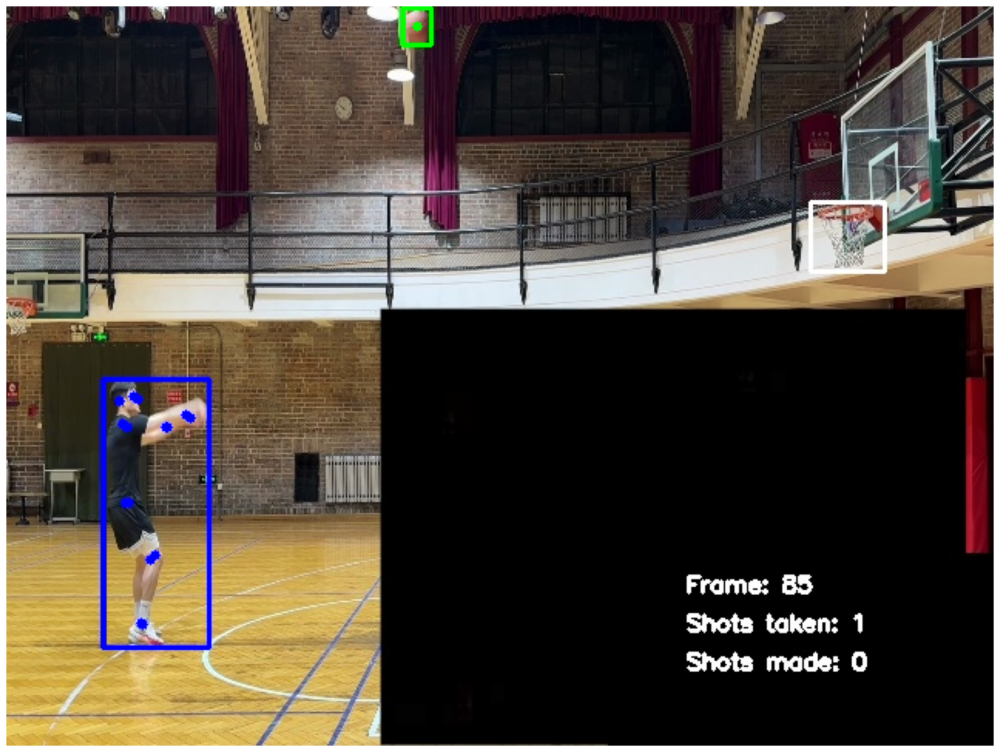

In [7]:
# Try plotting the points on the image
output_folder = "./output/run1"
frame_save_interval = 5
random_frame_id = random.randint(0, len(os.listdir(output_folder)) - 1)
random_frame_id = random_frame_id // frame_save_interval * frame_save_interval

# Format to 000000
random_frame_id = "{:06d}".format(random_frame_id)
print(os.path.join(output_folder, f"frame_{random_frame_id}.jpg"))

# Get the frame
example_frame = cv2.imread(os.path.join(output_folder, f"frame_{random_frame_id}.jpg"))
example_frame_height, example_frame_width, _ = example_frame.shape
print(example_frame_height, example_frame_width)
example_label = os.path.join(output_folder, f"frame_{random_frame_id}.txt")

with open(example_label, "r") as f:
    lines = f.readlines()
    
object_count = 0
for line in lines:
    line = line.strip()
    line = line.split(" ")
    line = [float(x) for x in line]
    
    while(True):
        object_line = line[object_count * 56 :object_count * 56 + 56]
        print(object_line)
        if len(object_line) < 56:
            break
        
        c = object_line[0]
        x, y, w, h = [x for x in object_line[1:5]]
        # Normalize the bounding box
        x = int(x * example_frame_width)
        y = int(y * example_frame_height)
        w = int(w * example_frame_width)
        h = int(h * example_frame_height)
        # Plot a rectangle using (center_x, center_y, width, height)
        
        colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
        cv2.rectangle(example_frame, (x - w//2, y - h//2), (x + w//2, y + h//2), colors[int(c)], 2)
        
        keypoints = object_line[5:]
        for i in range(0, len(keypoints), 3):
            x, y, v = keypoints[i:i+3]
            
            # Normalize the keypoints
            x = int(x * example_frame_width)
            y = int(y * example_frame_height)
            
            if v == 2.0:
                cv2.circle(example_frame, (int(x), int(y)), 3, colors[int(c)], -1)
                
        object_count += 1

# Plot using matplotlib
import matplotlib.pyplot as plt
# Convert to RGB
example_frame = cv2.cvtColor(example_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.axis("off")
plt.imshow(example_frame)

In [ ]:
from roboflow import Roboflow
from dotenv import load_dotenv

load_dotenv()
api_key = os.getenv("ROBOFLOW_API_KEY")

rf = Roboflow(api_key=api_key)
project = rf.workspace().project("ball-detector-y6tgg")
version = project.version(1)
version.export("yolov8")
# version.download("yolov8")

roboflow_model = project.version(1).model
roboflow_model.predict(os.path.join(output_folder, f"frame_{random_frame_id}.jpg"), confidence=40, overlap=30).save("prediction.jpg")


loading Roboflow workspace...
loading Roboflow project...

Version export complete for yolov8 format


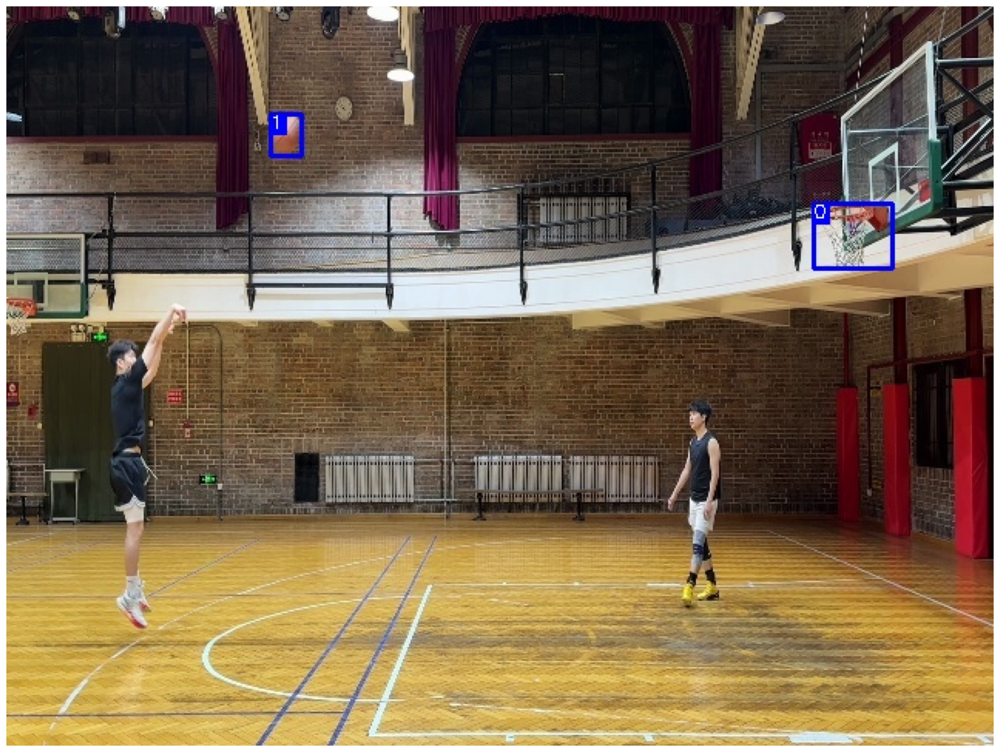

In [ ]:
result = cv2.imread("prediction.jpg")
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.axis("off")
plt.imshow(result)

## Use pretrained model


image 1/1 /Users/georgeli/Documents/Projects/HoopAI/videos/indoor1/frame_001370.jpg: 480x640 1 0, 2 1s, 95.1ms
Speed: 0.9ms preprocess, 95.1ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


tensor([0., 1., 1.])
tensor([[0.8567, 0.3153, 0.0746, 0.0917],
        [0.2820, 0.1765, 0.0340, 0.0633],
        [0.6985, 0.5629, 0.0128, 0.0327]])
tensor([0.8727, 0.7638, 0.4842])


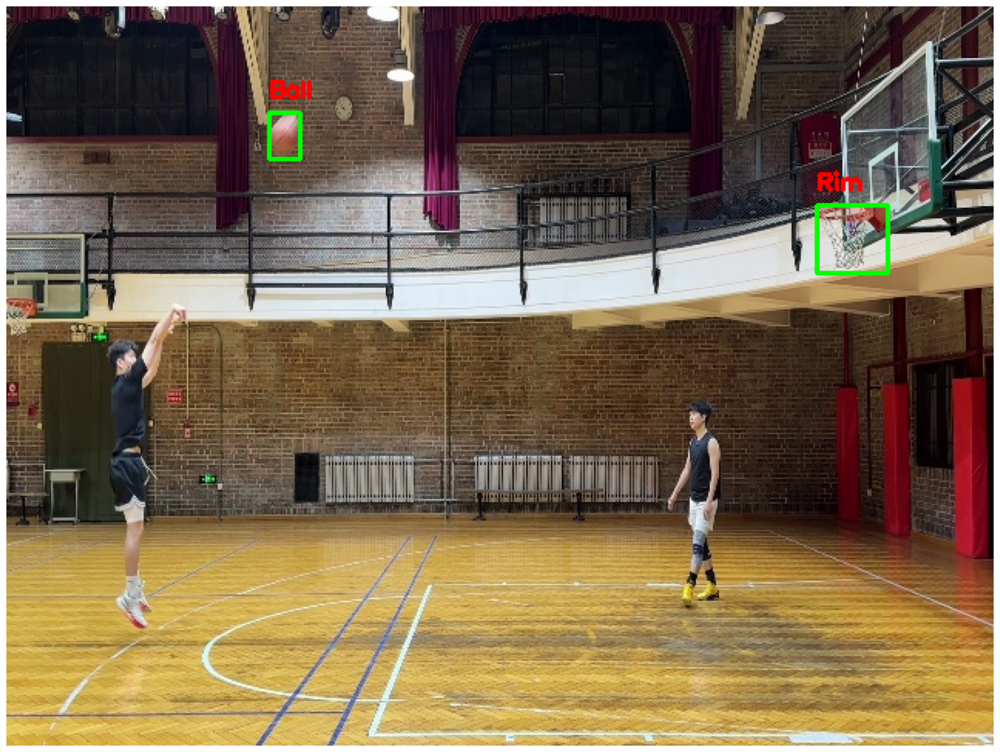

: 

In [ ]:
# Use a pretrained model instead of roboflow api
ball_detector_model = YOLO('yolov8s_ball_detector.pt')

# Make predictions
result = ball_detector_model.predict(os.path.join(output_folder, f"frame_{random_frame_id}.jpg"))
# print(result)

boxes = result[0].boxes

cls = boxes.cls
conf = boxes.conf
bbox = boxes.xywhn

# 0: Rim
# 1: Ball
print(cls)
print(bbox)
print(conf)

final_frame = cv2.imread(os.path.join(output_folder, f"frame_{random_frame_id}.jpg"))


for i in range(len(cls)):
    c = cls[i]
    c = "Rim" if c == 0 else "Ball"
    x, y, w, h = bbox[i]
    
    # Normalize the bounding box
    x = int(x * example_frame_width)
    y = int(y * example_frame_height)
    w = int(w * example_frame_width)
    h = int(h * example_frame_height)
    
    # Plot a rectangle using (center_x, center_y, width, height)
    if conf[i] > 0.5:
        cv2.rectangle(final_frame, (x - w//2, y - h//2), (x + w//2, y + h//2), (0, 255, 0), 2)
        cv2.putText(final_frame, f"{c}", (x - w//2, y - h//2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# Show the image
final_frame = cv2.cvtColor(final_frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 20))
plt.axis("off")
plt.imshow(final_frame)